In [1]:
import pandas as pd
from matplotlib import pyplot as plt, patches
import seaborn as sns
from matplotlib.ticker import FuncFormatter, ScalarFormatter, MaxNLocator
import squarify
import numpy as np
from collections import defaultdict
import time

In [2]:
print(time.strftime('%H:%M'))

%config InlineBackend.figure_format = 'retina'
plt.rc('figure', dpi=300)
plt.rc('savefig', dpi=300)
pd.set_option('display.max_columns', 100)
plt.style.use('default')
fig_size = (12,6)
big_fig_size = (18,8)
fig_fc = '#ffffff'
pc = ["#4285f4", "#db4437", "#f4b400", "#0f9d58", "#ab47bc", "#00acc1", "#ff7043", 
      "#9e9d24", "#5c6bc0", "#f06292", "#00796b", "#c2185b", "#7e57c2", "#03a9f4", 
      "#8bc34a", "#fdd835", "#fb8c00", "#8d6e63", "#9e9e9e", "#607d8b"]
# pd.set_option('display.float_format', lambda x: '%.3f' % x)
def plot_conf(ax, xlbl='', ylbl='', t=''):
    """
    This function perform operations to produce better-looking 
    visualizations
    """
    # changing the background color of the plot
    ax.set_facecolor('#ffffff')
    # modifying the ticks on plot axes
    ax.tick_params(axis='both', labelcolor='#616161', color='#ffffff')
    ax.tick_params(axis='both', which='major', labelsize=9)
    # adding a grid and specifying its color
    # ax.grid(True, color='#4d4a50')
    ax.grid(True, color='#e9e9e9')
    # making the grid appear behind the graph elements
    ax.set_axisbelow(True)
    # hiding axes
    ax.spines['bottom'].set_color('#ffffff')
    ax.spines['top'].set_color('#ffffff') 
    ax.spines['right'].set_color('#ffffff')
    ax.spines['left'].set_color('#ffffff')
    # setting the title, x label, and y label of the plot
    ax.set_title(t, fontsize=14, color='#616161', loc='left', pad=24, fontweight='bold');
    ax.set_xlabel(xlbl, labelpad=16, fontsize=11, color='#616161', fontstyle='italic');
    ax.set_ylabel(ylbl, color='#616161', labelpad=16, fontsize=11, fontstyle='italic');

rep_files_p = '/Users/ammar/Documents/CS-and-work/UM MDatSc/Research Project/Report-Files/'

02:00


## Reading data

In [3]:
data = pd.read_csv('./NYC_taxi_data/yellow_tripdata_2017-03.csv')

In [4]:
test_data = pd.read_csv('./NYC_taxi_data/yellow_tripdata_2018-03.csv')

In [5]:
weather_data = pd.read_csv('./weather_data/NY_central_park_weather_2017-03.csv')

In [6]:
weather_test_data = pd.read_csv('./weather_data/NY_central_park_weather_2018-03.csv')

In [7]:
zones_lookup_table = pd.read_csv('./NYC_taxi_data/additional_files/taxi_zone_lookup.csv')

## Taking a look at the data

In [8]:
data.shape, test_data.shape

((10294628, 17), (9430376, 17))

In [9]:
weather_data.shape, weather_test_data.shape

((31, 10), (31, 10))

In [10]:
zones_lookup_table.shape

(265, 4)

In [11]:
zones_lookup_table.head(5)

,LocationID,Borough,Zone,service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone


In [12]:
zones_lookup_table[zones_lookup_table.Borough == 'Unknown']

,LocationID,Borough,Zone,service_zone
263,264,Unknown,NV,NaN
264,265,Unknown,NaN,NaN


In [13]:
data.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2017-03-09 21:30:11,2017-03-09 21:44:20,1,4.06,1,N,148,48,1,14.0,0.5,0.5,3.06,0.0,0.3,18.36
1,2,2017-03-09 21:47:00,2017-03-09 21:58:01,1,2.73,1,N,48,107,2,11.5,0.5,0.5,0.00,0.0,0.3,12.80
2,2,2017-03-09 22:01:08,2017-03-09 22:11:16,1,2.27,1,N,79,162,1,10.0,0.5,0.5,2.82,0.0,0.3,14.12
3,2,2017-03-09 22:16:05,2017-03-10 06:26:11,1,3.86,1,N,237,41,1,12.0,0.5,0.5,3.99,0.0,0.3,17.29
4,2,2017-03-31 06:31:53,2017-03-31 06:41:48,1,3.45,1,N,41,162,2,12.0,0.5,0.5,0.00,0.0,0.3,13.30


In [14]:
'{:,} taxi trips'.format(data.shape[0])

'10,294,628 taxi trips'

In [15]:
weather_data.shape, weather_test_data.shape

((31, 10), (31, 10))

In [16]:
weather_data.head()

,Date,Maximum Temperature,Minimum Temperature,Average Temperature,Departure Temperature,HDD,CDD,Precipitation,New Snow,Snow Depth
0,2017-03-01,70,54,62.0,23.9,3,0,0.12,0.0,0
1,2017-03-02,64,35,49.5,11.2,15,0,0.00,0.0,0
2,2017-03-03,39,24,31.5,-7.1,33,0,0.00,0.0,0
3,2017-03-04,30,17,23.5,-15.3,41,0,0.00,0.0,0
4,2017-03-05,37,14,25.5,-13.6,39,0,0.00,0.0,0


## Dealing with missing values

In [17]:
data.isna().sum().sum()

0

In [18]:
test_data.isna().sum().sum()

0

In [19]:
weather_data.isna().sum().sum()

0

In [20]:
weather_test_data.isna().sum().sum()

0

## Checking duplicate rows

In [21]:
data.shape[0] - data.drop_duplicates().shape[0]

27

In [22]:
test_data.shape[0] - test_data.drop_duplicates().shape[0]

0

In [23]:
weather_data.shape[0] - weather_data.drop_duplicates().shape[0]

0

In [24]:
weather_test_data.shape[0] - weather_test_data.drop_duplicates().shape[0]

0

## Data-type conversion

In [25]:
data.dtypes

VendorID                   int64
tpep_pickup_datetime      object
tpep_dropoff_datetime     object
passenger_count            int64
trip_distance            float64
RatecodeID                 int64
store_and_fwd_flag        object
PULocationID               int64
DOLocationID               int64
payment_type               int64
fare_amount              float64
extra                    float64
mta_tax                  float64
tip_amount               float64
tolls_amount             float64
improvement_surcharge    float64
total_amount             float64
dtype: object

In [26]:
weather_data.dtypes

Date                      object
Maximum Temperature        int64
Minimum Temperature        int64
Average Temperature      float64
Departure Temperature    float64
HDD                        int64
CDD                        int64
Precipitation             object
New Snow                  object
Snow Depth                object
dtype: object

In [27]:
# for taxi-trips datasets
data.tpep_pickup_datetime = data.tpep_pickup_datetime.astype('M')
data.tpep_dropoff_datetime = data.tpep_dropoff_datetime.astype('M')

test_data.tpep_pickup_datetime = test_data.tpep_pickup_datetime.astype('M')
test_data.tpep_dropoff_datetime = test_data.tpep_dropoff_datetime.astype('M')


# for weather datasets
weather_data.Date = weather_data.Date.astype('M')
weather_test_data.Date = weather_test_data.Date.astype('M')

In [28]:
(weather_data.Precipitation.min(), weather_test_data.Precipitation.min(), 
weather_data['New Snow'].min(), weather_test_data['New Snow'].min(),
weather_data['Snow Depth'].min(), weather_test_data['Snow Depth'].min())

('0.00', '0.00', '0.0', '0.0', '0', '0')

In [29]:
for x in (weather_data.Precipitation.value_counts(), weather_test_data.Precipitation.value_counts(), 
          weather_data['New Snow'].value_counts(), weather_test_data['New Snow'].value_counts(),
          weather_data['Snow Depth'].value_counts(), weather_test_data['Snow Depth'].value_counts()):
    print('', end='') # print(x)

In [30]:
weather_data['Precipitation'] = weather_data['Precipitation'].replace(to_replace='T', value=0.0001).astype('f')
weather_data['New Snow'] = weather_data['New Snow'].replace(to_replace='T', value=0.002).astype('f')
weather_data['Snow Depth'] = weather_data['Snow Depth'].replace(to_replace='T', value=0.01).astype('f')

weather_test_data['Precipitation'] = (
    weather_test_data['Precipitation'].replace(to_replace='T', value=0.0001).astype('f'))
weather_test_data['New Snow'] = weather_test_data['New Snow'].replace(to_replace='T', value=0.002).astype('f')
weather_test_data['Snow Depth'] = weather_test_data['Snow Depth'].replace(to_replace='T', value=0.01).astype('f')

In [31]:
data.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2017-03-09 21:30:11,2017-03-09 21:44:20,1,4.06,1,N,148,48,1,14.0,0.5,0.5,3.06,0.0,0.3,18.36
1,2,2017-03-09 21:47:00,2017-03-09 21:58:01,1,2.73,1,N,48,107,2,11.5,0.5,0.5,0.00,0.0,0.3,12.80
2,2,2017-03-09 22:01:08,2017-03-09 22:11:16,1,2.27,1,N,79,162,1,10.0,0.5,0.5,2.82,0.0,0.3,14.12
3,2,2017-03-09 22:16:05,2017-03-10 06:26:11,1,3.86,1,N,237,41,1,12.0,0.5,0.5,3.99,0.0,0.3,17.29
4,2,2017-03-31 06:31:53,2017-03-31 06:41:48,1,3.45,1,N,41,162,2,12.0,0.5,0.5,0.00,0.0,0.3,13.30


## Unit conversion

In [32]:
data.trip_distance = data.trip_distance * 1.609
test_data.trip_distance = test_data.trip_distance * 1.609

In [33]:
for df in (weather_data, weather_test_data):
    df['Maximum Temperature'] = (df['Maximum Temperature'] - 32) * 5 / 9
    df['Minimum Temperature'] = (df['Minimum Temperature'] - 32) * 5 / 9
    df['Average Temperature'] = (df['Average Temperature'] - 32) * 5 / 9
    df['Departure Temperature'] = (df['Departure Temperature'] - 32) * 5 / 9
    df['Precipitation'] = df['Precipitation'] * 2.54
    df['New Snow'] = df['New Snow'] * 2.54    
    df['Snow Depth'] = df['Snow Depth'] * 2.54    

## Removing incorrect and inconsistent data

### When pickup and drop-off times are the same

In [34]:
data[data.tpep_pickup_datetime >= data.tpep_dropoff_datetime].shape[0]

10285

In [35]:
data = data[data.tpep_pickup_datetime < data.tpep_dropoff_datetime]

In [36]:
test_data[test_data.tpep_pickup_datetime >= test_data.tpep_dropoff_datetime].shape[0]

7777

In [37]:
test_data = test_data[test_data.tpep_pickup_datetime < test_data.tpep_dropoff_datetime]

### When trip distance is less than or equal to zero

In [38]:
data[data.trip_distance <= 0].shape[0]

56387

In [39]:
data = data[data.trip_distance > 0]

In [40]:
test_data[test_data.trip_distance <= 0].shape[0]

53407

In [41]:
test_data = test_data[test_data.trip_distance > 0]

In [42]:
data.trip_distance.max(), test_data.trip_distance.max()

(962.9865, 487.2052)

### When total charge amount is less than or equal zero

In [43]:
data[data.total_amount <= 0].shape[0]

4203

In [44]:
data = data[data.total_amount > 0]

In [45]:
test_data[test_data.total_amount <= 0].shape[0]

4452

In [46]:
test_data = test_data[test_data.total_amount > 0]

In [47]:
data.total_amount.max(), test_data.total_amount.max()

(171863.58, 214750.24)

### When passenger count is less than 1

In [48]:
data[data.passenger_count < 1].shape[0]

66

In [49]:
data = data[data.passenger_count >= 1]

In [50]:
test_data[test_data.passenger_count < 1].shape[0]

69135

In [51]:
test_data = test_data[test_data.passenger_count >= 1]

In [52]:
data.passenger_count.max(), test_data.passenger_count.max()

(9, 9)

In [53]:
data.shape, test_data.shape

((10223687, 17), (9295605, 17))

In [54]:
weather_data.shape, weather_test_data.shape

((31, 10), (31, 10))

# Creating the target variable

In [55]:
data['trip_duration'] = (data.tpep_dropoff_datetime - data.tpep_pickup_datetime).dt.total_seconds() / 60

test_data['trip_duration'] = (test_data.tpep_dropoff_datetime - test_data.tpep_pickup_datetime
                             ).dt.total_seconds() / 60

# Taxi-trips EDA: Single-Variables

### Trip-duration distribution

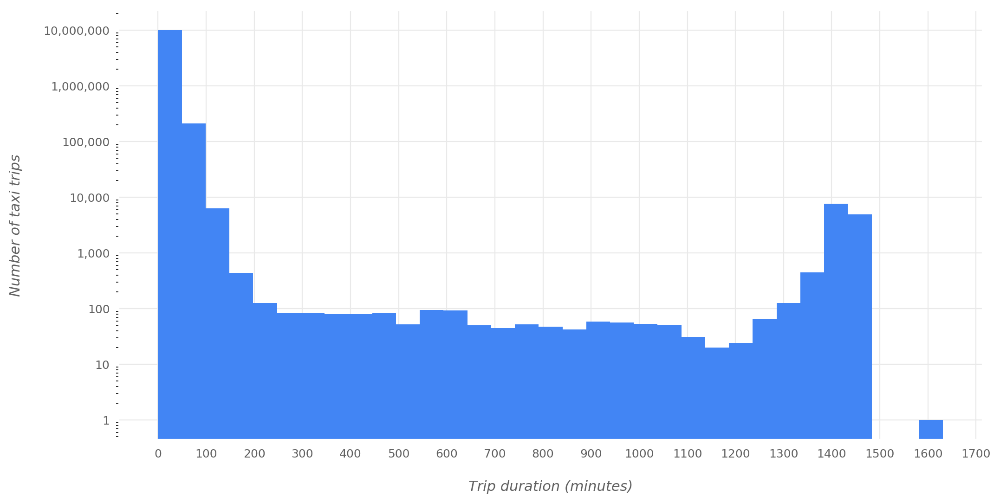

In [56]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.distplot(data.trip_duration, kde=False, bins=33, color=pc[0], hist_kws={'alpha': 1, 'log': True})
plot_conf(ax, xlbl='Trip duration (minutes)', ylbl='Number of taxi trips', t='')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
plt.xticks(range(0, 1800, 100), range(0, 1800, 100))
fig.savefig('{}histdurtr.png'.format(rep_files_p), dpi=300)

In [57]:
data[['trip_distance', 'trip_duration', 'total_amount']][data.trip_duration > 1500]

,trip_distance,trip_duration,total_amount
8795532,26.2267,1631.45,73.56


#### Subsequent data cleaning

In [58]:
data = data[data.trip_duration <= 1500]

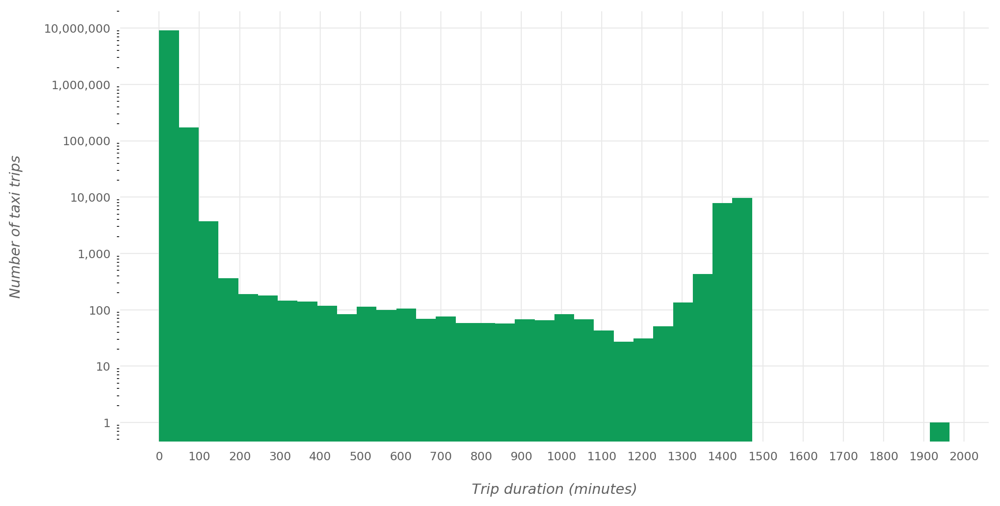

In [59]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.distplot(test_data.trip_duration, kde=False, bins=40, color=pc[3], hist_kws={'alpha': 1, 'log': True})
plot_conf(ax, xlbl='Trip duration (minutes)', ylbl='Number of taxi trips', t='')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
plt.xticks(range(0, 2100, 100), range(0, 2100, 100))
fig.savefig('{}histdurts.png'.format(rep_files_p), dpi=300)

In [60]:
test_data[['trip_distance', 'trip_duration', 'total_amount']][test_data.trip_duration > 1500]

,trip_distance,trip_duration,total_amount
6455412,3.8616,1964.516667,17.75


#### Subsequent data cleaning

In [61]:
test_data = test_data[test_data.trip_duration <= 1500]

### Number of taxi trips provided by each vendor

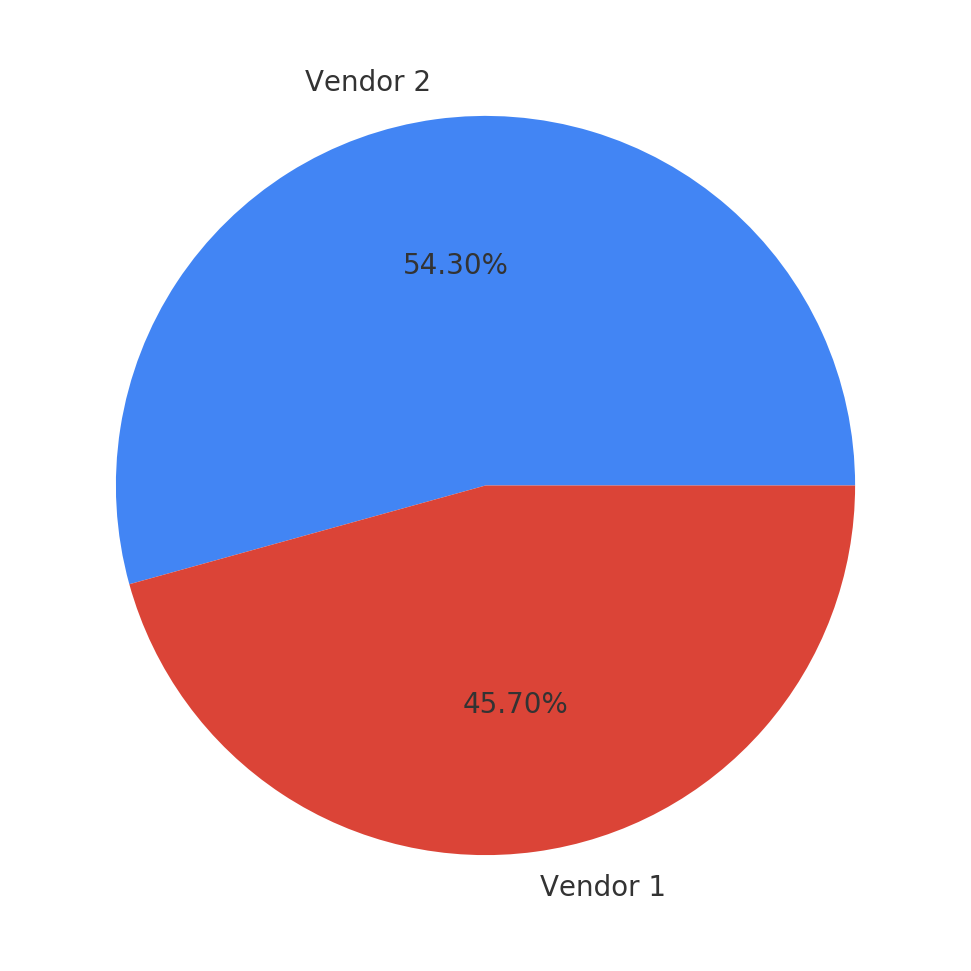

In [62]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
ven_vc = data.VendorID.value_counts()
ax.pie(ven_vc.values, labels=['Vendor {}'.format(x) for x in ven_vc.index], 
       textprops={'color': '#333333'}, colors=[pc[0], pc[1]], autopct='%.2f%%')
plot_conf(ax, xlbl='', ylbl='', t='')
ax.set_aspect(1)

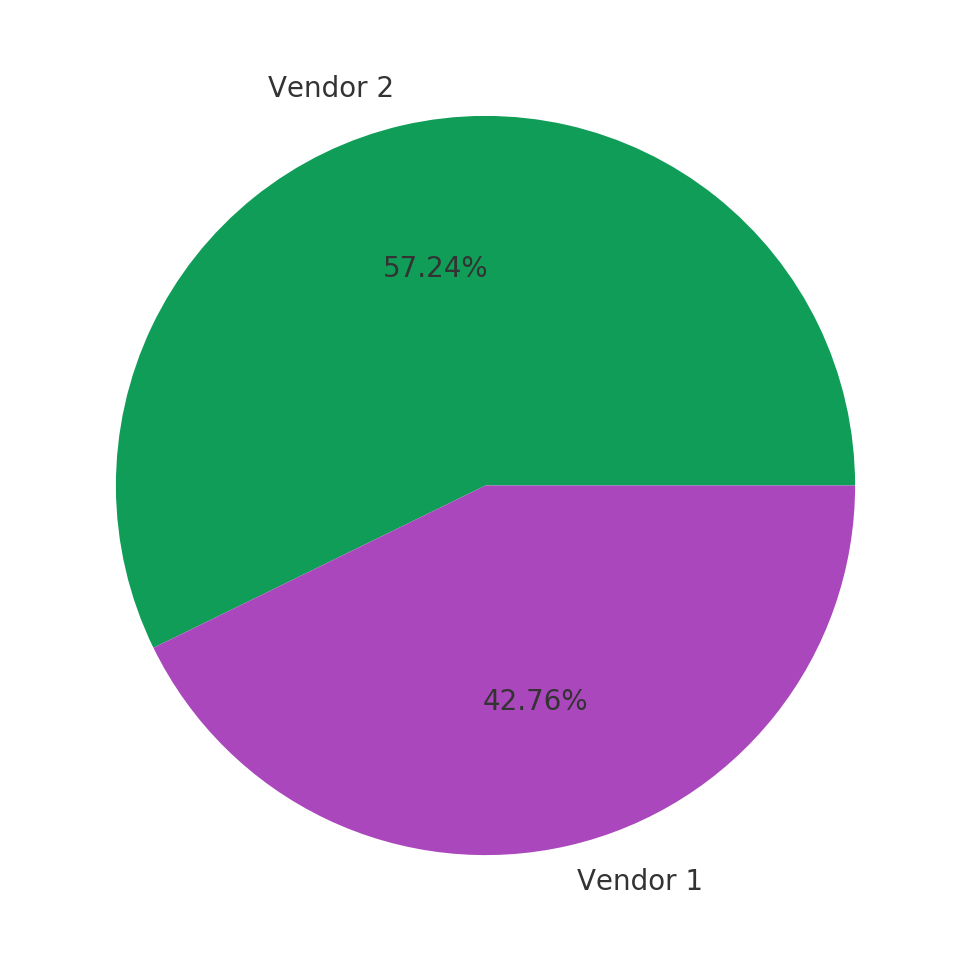

In [63]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
ven_vc = test_data.VendorID.value_counts()
ax.pie(ven_vc.values, labels=['Vendor {}'.format(x) for x in ven_vc.index], 
       textprops={'color': '#333333'}, colors=[pc[3], pc[4]], autopct='%.2f%%')
plot_conf(ax, xlbl='', ylbl='', t='')
ax.set_aspect(1)

### Number of taxi trips per day

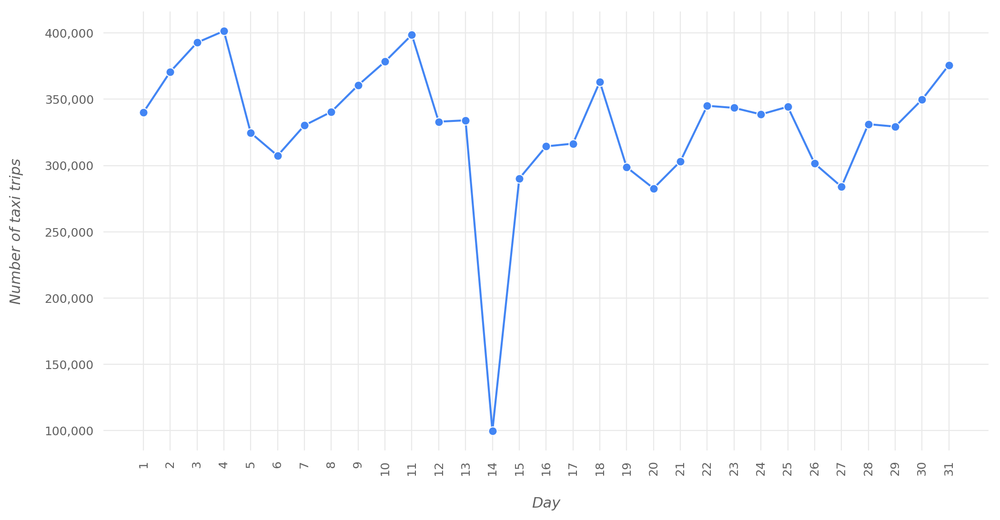

In [64]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
trip_days = data.tpep_pickup_datetime.dt.day
data_groupedby_day = data.groupby(trip_days, sort=True).size()
sns.lineplot(data_groupedby_day.index, data_groupedby_day.values, 
             color=pc[0], marker='.', ms=13)
plot_conf(ax, xlbl='Day', ylbl='Number of taxi trips', t='')
plt.xticks(range(1,32), range(1,32), rotation=90);
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}perdaytr.png'.format(rep_files_p), dpi=300)

In [65]:
weather_data[['Date', 'Average Temperature', 'Precipitation', 'New Snow']].iloc[10:17]

,Date,Average Temperature,Precipitation,New Snow
10,2017-03-11,-5.000000,0.0000,0.000000
11,2017-03-12,-4.444444,0.0000,0.000000
12,2017-03-13,-2.222222,0.0000,0.005080
13,2017-03-14,-3.055556,5.0038,19.303999
14,2017-03-15,-5.000000,0.0000,0.000000
15,2017-03-16,-0.277778,0.0000,0.000000
16,2017-03-17,3.333333,0.0000,0.000000


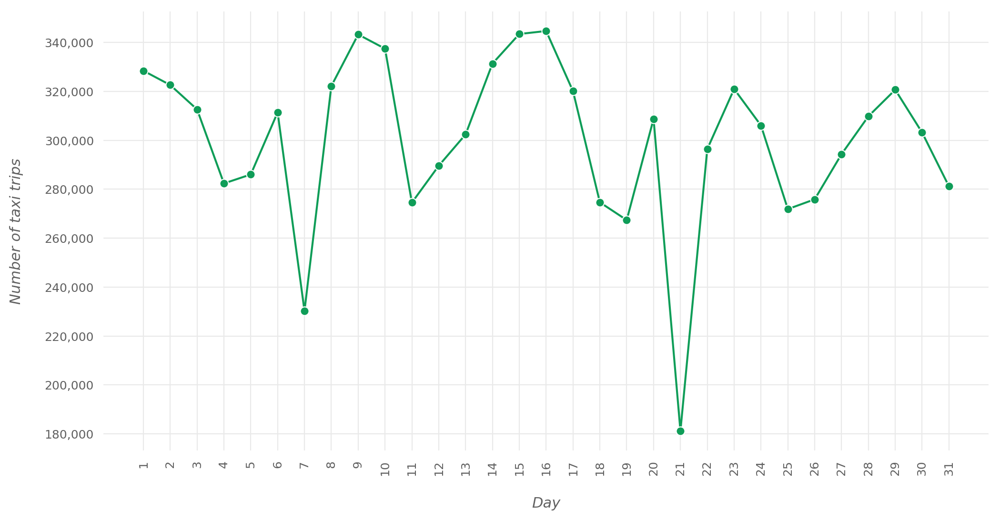

In [66]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
trip_days = test_data.tpep_pickup_datetime.dt.day
data_groupedby_day = test_data.groupby(trip_days, sort=True).size()
sns.lineplot(data_groupedby_day.index, data_groupedby_day.values, 
             color=pc[3], marker='.', ms=13)
plot_conf(ax, xlbl='Day', ylbl='Number of taxi trips', t='')
plt.xticks(range(1,32), range(1,32), rotation=90);
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}perdayts.png'.format(rep_files_p), dpi=300)

In [67]:
weather_test_data[['Date', 'Average Temperature', 'Precipitation', 'New Snow']].iloc[17:24]

,Date,Average Temperature,Precipitation,New Snow
17,2018-03-18,1.944444,0.000000,0.000000
18,2018-03-19,4.444444,0.000000,0.000000
19,2018-03-20,1.388889,0.000254,0.000000
20,2018-03-21,1.666667,2.514600,20.827999
21,2018-03-22,5.000000,0.152400,0.508000
22,2018-03-23,5.555556,0.000254,0.000000
23,2018-03-24,6.111111,0.000000,0.000000


In [68]:
weather_test_data[['Date', 'Average Temperature', 'Precipitation', 'New Snow']].iloc[3:10]

,Date,Average Temperature,Precipitation,New Snow
3,2018-03-04,3.888889,0.000000,0.00000
4,2018-03-05,3.333333,0.000000,0.00000
5,2018-03-06,4.166667,0.000254,0.00000
6,2018-03-07,2.222222,3.581400,8.12800
7,2018-03-08,2.222222,0.000254,0.00508
8,2018-03-09,2.222222,0.000000,0.00000
9,2018-03-10,1.944444,0.000000,0.00000


### Number of taxi trips per hour

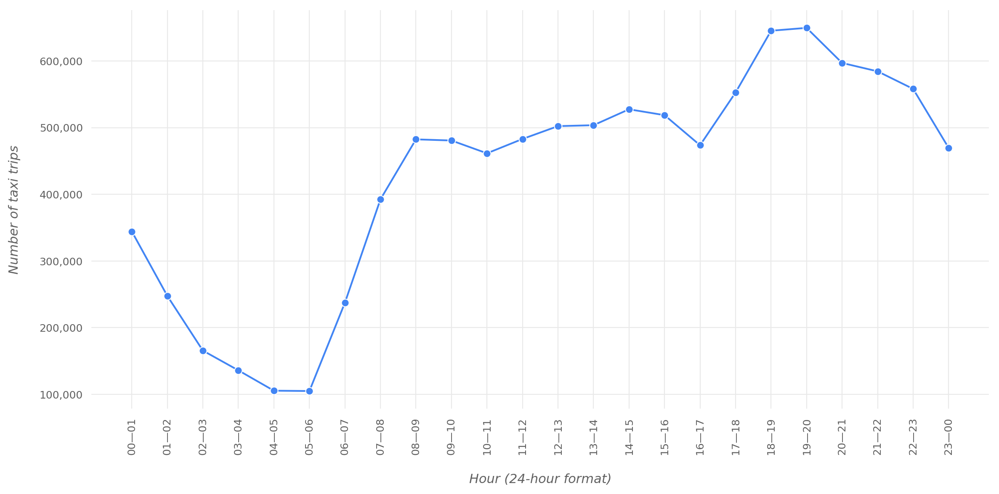

In [69]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
trip_hours = data.tpep_pickup_datetime.dt.hour
data_groupedby_hour = data.groupby(trip_hours, sort=True).size()
sns.lineplot(data_groupedby_hour.index, data_groupedby_hour.values, 
             color=pc[0], marker='.', ms=13)
plot_conf(ax, xlbl='Hour (24-hour format)', ylbl='Number of taxi trips', t='')
plt.xticks(range(0,24), range(0,24), rotation=90);
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:02d}—{:02d}".format(x, (x+1)%24)));
plt.tight_layout()
fig.savefig('{}perhourtr.png'.format(rep_files_p), dpi=300)

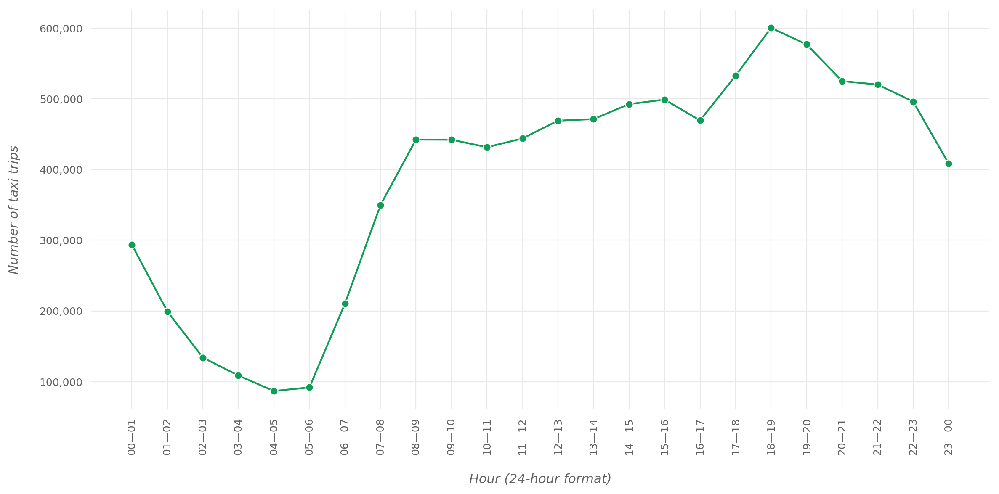

In [70]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
trip_hours = test_data.tpep_pickup_datetime.dt.hour
data_groupedby_hour = test_data.groupby(trip_hours, sort=True).size()
sns.lineplot(data_groupedby_hour.index, data_groupedby_hour.values, 
             color=pc[3], marker='.', ms=13)
plot_conf(ax, xlbl='Hour (24-hour format)', ylbl='Number of taxi trips', t='')
plt.xticks(range(0,24), range(0,24), rotation=90);
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:02d}—{:02d}".format(x, (x+1)%24)));
plt.tight_layout()
fig.savefig('{}perhourts.png'.format(rep_files_p), dpi=300)

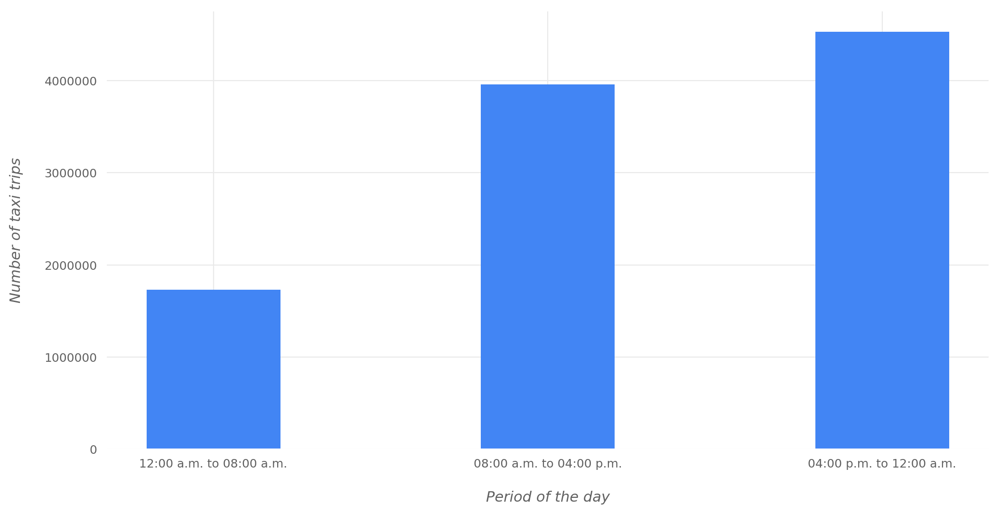

In [71]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
trip_hours = data.tpep_pickup_datetime.dt.hour
data_groupedby_hour = data.groupby(trip_hours, sort=True).size()
dghdf = data_groupedby_hour.rename_axis('hour').reset_index(name='count')
dghdf['hour'] = dghdf['hour'].replace([x for x in range(8)], 1)
dghdf['hour'] = dghdf['hour'].replace([x for x in range(8, 16)], 2)
dghdf['hour'] = dghdf['hour'].replace([x for x in range(16, 24)], 3)
data_groupedby_period = dghdf.groupby('hour')['count'].sum()
data_groupedby_period.index = ['12:00 a.m. to 08:00 a.m.', '08:00 a.m. to 04:00 p.m.', '04:00 p.m. to 12:00 a.m.']
ax.bar(data_groupedby_period.index, data_groupedby_period.values, color=pc[0], width=0.4)
plot_conf(ax, xlbl='Period of the day', ylbl='Number of taxi trips', t='')
fig.savefig('{}perperiodtr.png'.format(rep_files_p), dpi=300)

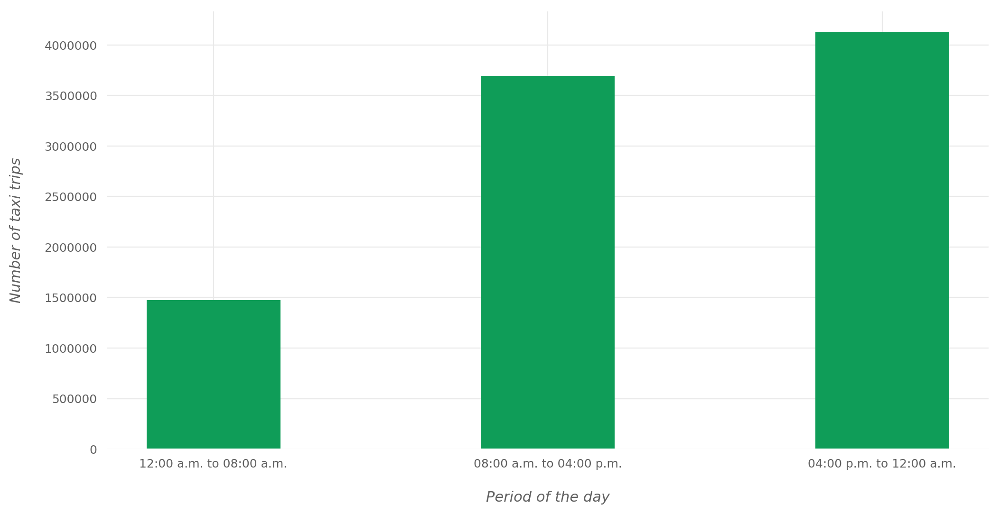

In [72]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
trip_hours = test_data.tpep_pickup_datetime.dt.hour
data_groupedby_hour = test_data.groupby(trip_hours, sort=True).size()
dghdf = data_groupedby_hour.rename_axis('hour').reset_index(name='count')
dghdf['hour'] = dghdf['hour'].replace([x for x in range(8)], 1)
dghdf['hour'] = dghdf['hour'].replace([x for x in range(8, 16)], 2)
dghdf['hour'] = dghdf['hour'].replace([x for x in range(16, 24)], 3)
data_groupedby_period = dghdf.groupby('hour')['count'].sum()
data_groupedby_period.index = ['12:00 a.m. to 08:00 a.m.', '08:00 a.m. to 04:00 p.m.', '04:00 p.m. to 12:00 a.m.']
ax.bar(data_groupedby_period.index, data_groupedby_period.values, color=pc[3], width=0.4)
plot_conf(ax, xlbl='Period of the day', ylbl='Number of taxi trips', t='')
fig.savefig('{}perperiodts.png'.format(rep_files_p), dpi=300)

### Passenger-count distribution

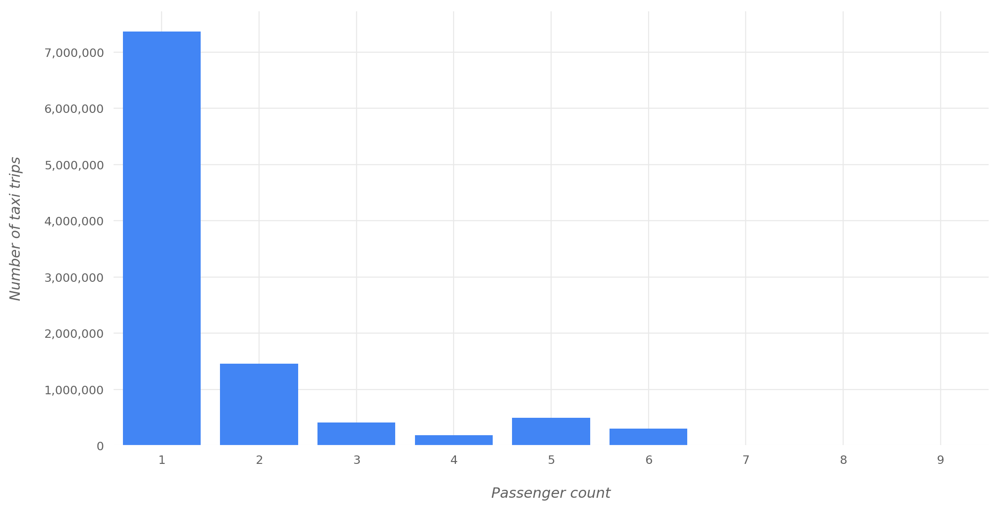

In [73]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
pass_value_counts = data.passenger_count.value_counts()
sns.barplot(x=pass_value_counts.index, y=pass_value_counts.values, color=pc[0], saturation=1, log=False)
plot_conf(ax, xlbl='Passenger count', ylbl='Number of taxi trips', t='')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}passdisttr.png'.format(rep_files_p), dpi=300)

In [74]:
data.passenger_count.value_counts(normalize=True) * 100

1    72.067110
2    14.254458
5     4.873311
3     4.026728
6     2.930929
4     1.847074
7     0.000176
8     0.000127
9     0.000088
Name: passenger_count, dtype: float64

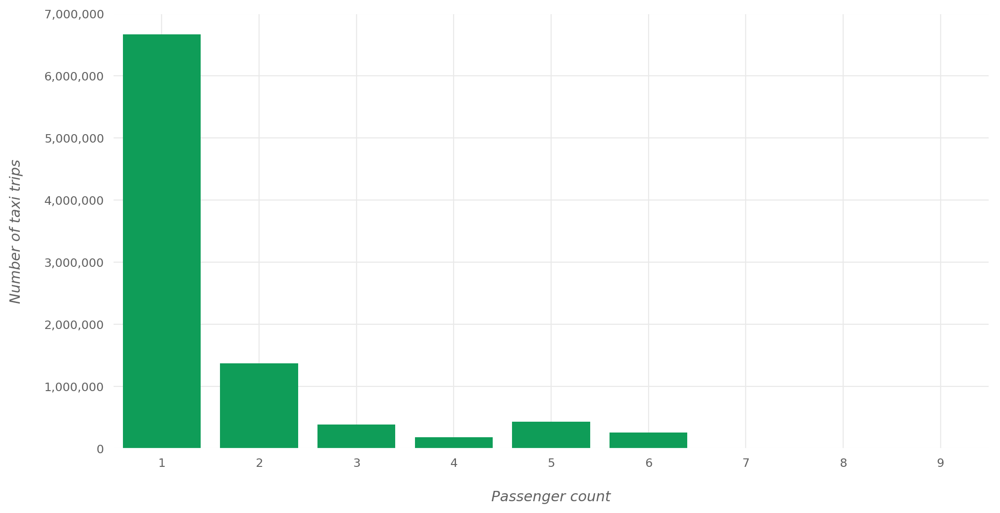

In [75]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
pass_value_counts = test_data.passenger_count.value_counts()
sns.barplot(x=pass_value_counts.index, y=pass_value_counts.values, color=pc[3], saturation=1, log=False)
plot_conf(ax, xlbl='Passenger count', ylbl='Number of taxi trips', t='')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}passdistts.png'.format(rep_files_p), dpi=300)

In [76]:
test_data.passenger_count.value_counts(normalize=True) * 100

1    71.681066
2    14.764517
5     4.692638
3     4.165367
6     2.764802
4     1.931311
8     0.000129
7     0.000118
9     0.000054
Name: passenger_count, dtype: float64

### Trip-distance distribution

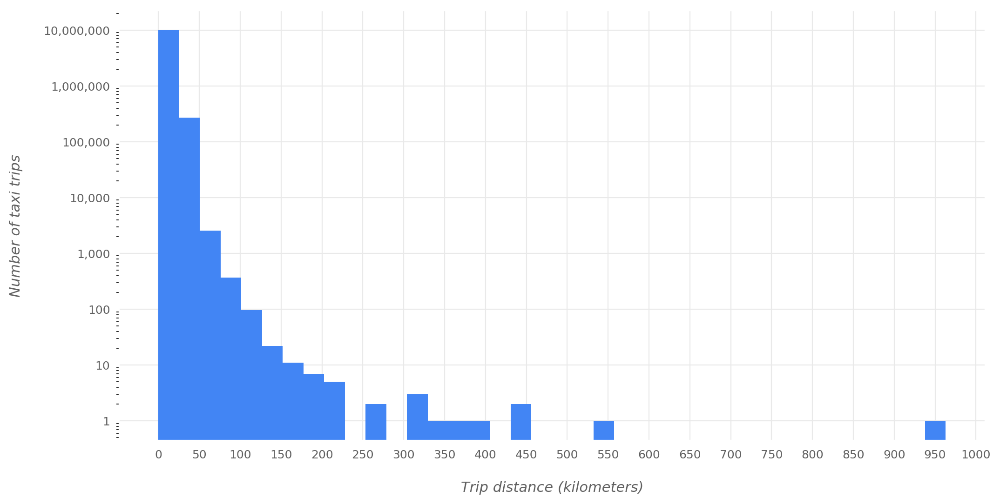

In [77]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.distplot(data.trip_distance, kde=False, bins=38, color=pc[0], hist_kws={'alpha': 1, 'log': True})
plot_conf(ax, xlbl='Trip distance (kilometers)', ylbl='Number of taxi trips', t='')
plt.xticks(range(0, int(data.trip_distance.max()) + 50, 50), 
           range(0, int(data.trip_distance.max()) + 50, 50));
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}distdisttr.png'.format(rep_files_p), dpi=300)

02:03
02:04


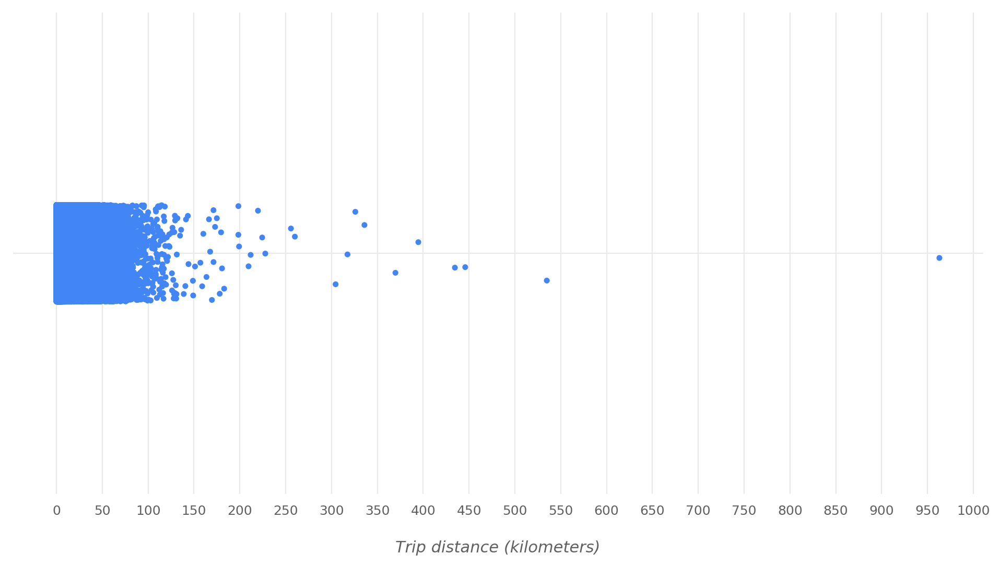

In [78]:
print(time.strftime('%H:%M'))
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.stripplot(data.trip_distance, color=pc[0], size=4)
plot_conf(ax, xlbl='Trip distance (kilometers)', ylbl='', t='')
plt.xticks(range(0, int(data.trip_distance.max()) + 50, 50), 
           range(0, int(data.trip_distance.max()) + 50, 50));
fig.savefig('{}distdiststrtr.png'.format(rep_files_p), dpi=300)
print(time.strftime('%H:%M'))

In [79]:
data[data.trip_distance < 25].shape[0] / data.shape[0] * 100

97.28520613798194

In [80]:
data[(data.trip_distance >= 25) & (data.trip_distance <= 225)].shape[0] / data.shape[0] * 100

2.7146667063131633

In [81]:
(data[['trip_distance', 'trip_duration', 'total_amount']][data.trip_distance > 900]
 .sort_values(by='trip_distance', ascending=False)).reset_index(drop=True)

,trip_distance,trip_duration,total_amount
0,962.9865,20.666667,18.35


#### Subsequent data cleaning

In [82]:
data = data[data.trip_distance < 900]

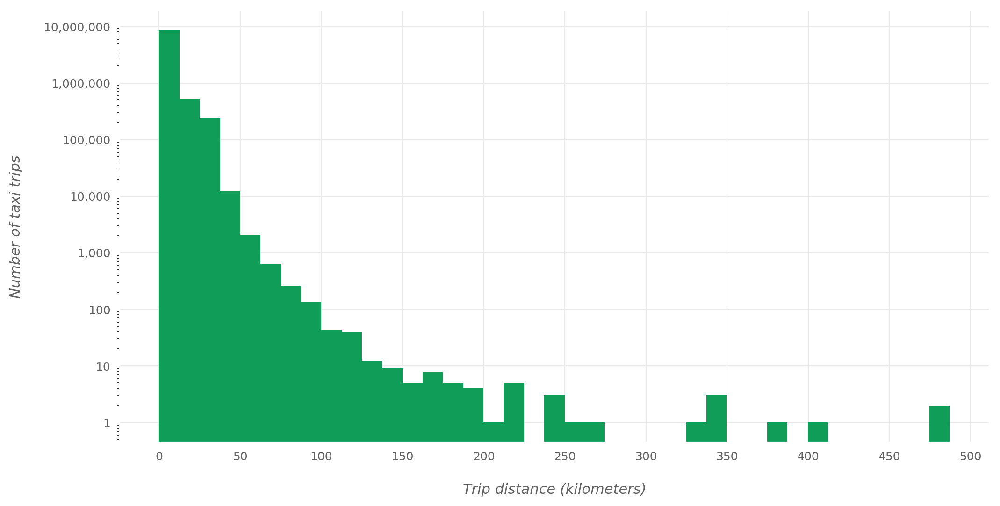

In [83]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.distplot(test_data.trip_distance, kde=False, bins=39, color=pc[3], hist_kws={'alpha': 1, 'log': True})
plot_conf(ax, xlbl='Trip distance (kilometers)', ylbl='Number of taxi trips', t='')
plt.xticks(range(0, int(test_data.trip_distance.max()) + 50, 50), 
           range(0, int(test_data.trip_distance.max()) + 50, 50));
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}distdistts.png'.format(rep_files_p), dpi=300)

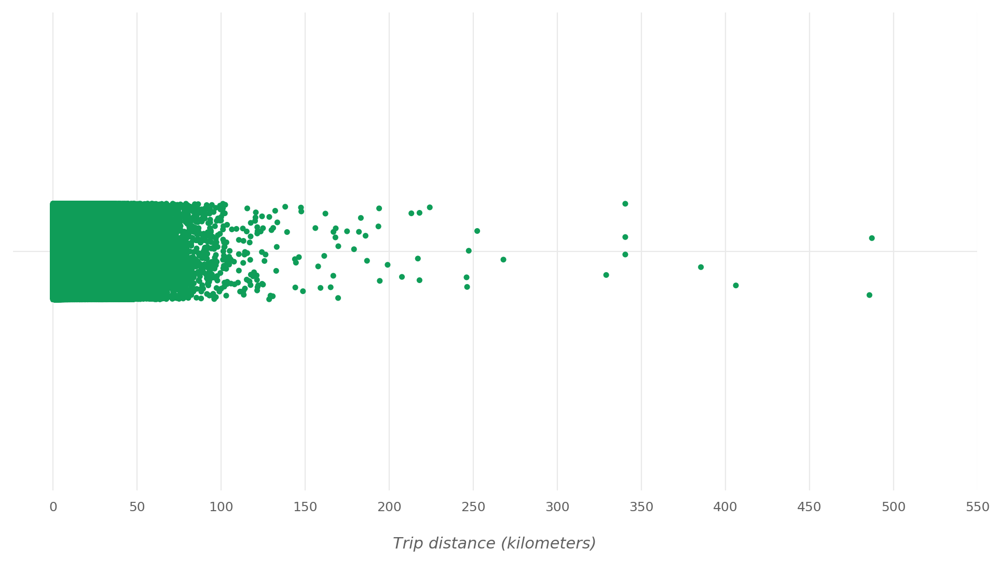

In [84]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.stripplot(test_data.trip_distance, color=pc[3], size=4)
plot_conf(ax, xlbl='Trip distance (kilometers)', ylbl='', t='')
plt.xticks(range(0, int(data.trip_distance.max()) + 50, 50), 
           range(0, int(data.trip_distance.max()) + 50, 50));
fig.savefig('{}distdiststrts.png'.format(rep_files_p), dpi=300)

In [85]:
test_data[test_data.trip_distance < 25].shape[0] / test_data.shape[0] * 100

97.25707979814975

In [86]:
test_data[(test_data.trip_distance >= 25) & (test_data.trip_distance <= 225)].shape[0] / test_data.shape[0] * 100

2.742780350798076

In [87]:
(test_data[['trip_distance', 'trip_duration', 'total_amount']][test_data.trip_distance > 450]
 .sort_values(by='trip_distance', ascending=False)).reset_index(drop=True)

,trip_distance,trip_duration,total_amount
0,487.2052,334.816667,217.56
1,485.7571,378.433333,18.57


### Rate-code-ID distribution

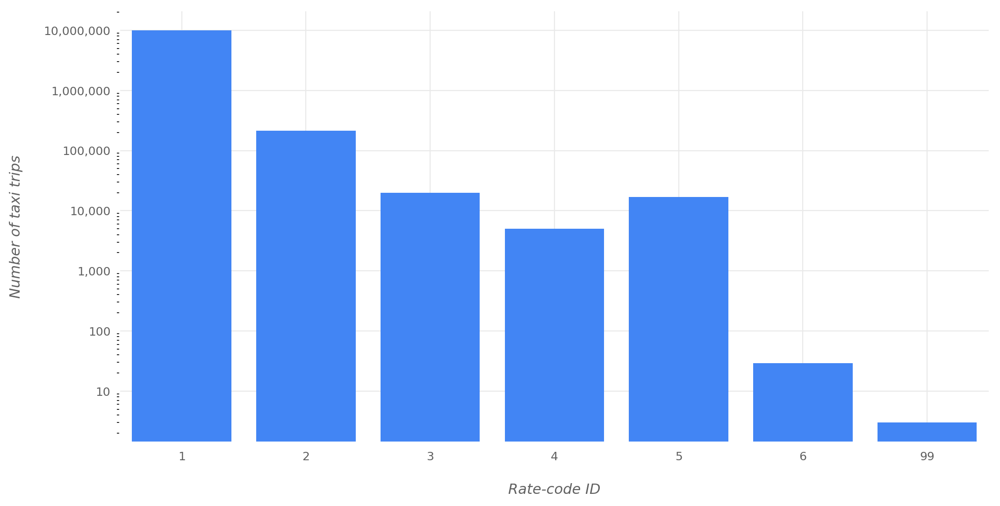

In [88]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
ratec_vc = data.RatecodeID.value_counts()
sns.barplot(x=ratec_vc.index, y=ratec_vc.values, color=pc[0], saturation=1, log=True)
plot_conf(ax, xlbl='Rate-code ID', ylbl='Number of taxi trips', t='')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}ratedisttr.png'.format(rep_files_p), dpi=300)

In [89]:
data[data.RatecodeID == 1].shape[0] / data.shape[0] * 100

97.48549568966571

In [90]:
data[data.RatecodeID == 99]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,trip_duration
3308765,1,2017-03-08 19:44:56,2017-03-08 19:51:49,1,1.2872,99,N,143,142,2,6.0,1.0,0.5,0.0,0.0,0.3,7.8,6.883333
6694366,1,2017-03-25 18:29:15,2017-03-25 18:35:35,2,2.5744,99,N,145,112,1,7.5,0.0,0.5,1.0,0.0,0.3,9.3,6.333333
6862863,1,2017-03-20 14:00:33,2017-03-20 14:14:18,1,2.7353,99,N,161,263,2,10.0,0.0,0.5,0.0,0.0,0.3,10.8,13.750000


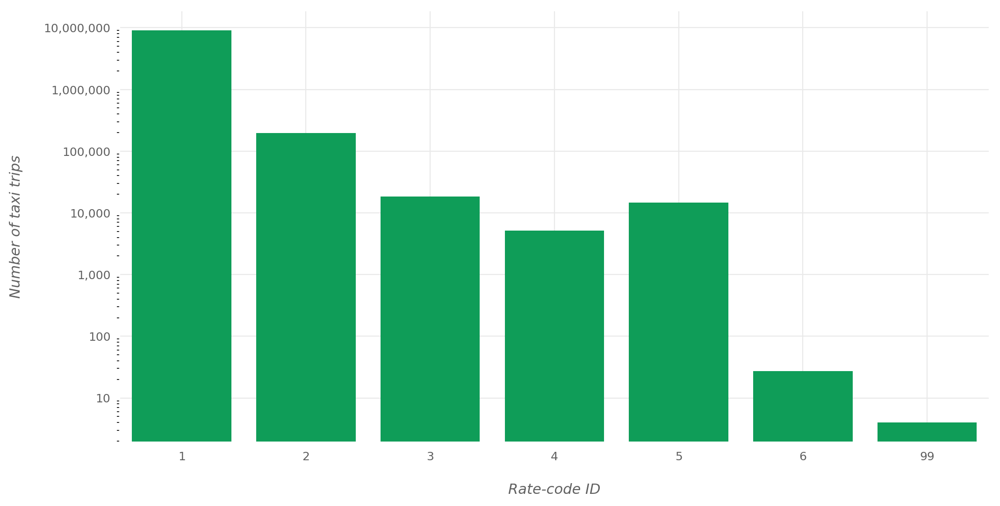

In [91]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
ratec_vc = test_data.RatecodeID.value_counts()
sns.barplot(x=ratec_vc.index, y=ratec_vc.values, color=pc[3], saturation=1, log=True)
plot_conf(ax, xlbl='Rate-code ID', ylbl='Number of taxi trips', t='')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}ratedistts.png'.format(rep_files_p), dpi=300)

In [92]:
test_data[test_data.RatecodeID == 1].shape[0] / test_data.shape[0] * 100

97.46300509359047

In [93]:
test_data[test_data.RatecodeID == 99]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,trip_duration
2145595,1,2018-03-08 08:22:05,2018-03-08 08:59:37,1,17.3772,99,N,74,25,1,34.5,0.0,0.5,3.00,0.0,0.3,38.30,37.533333
3251562,1,2018-03-11 13:20:51,2018-03-11 13:36:20,1,4.5052,99,N,237,224,3,12.5,0.0,0.5,0.00,0.0,0.3,13.30,15.483333
6157032,1,2018-03-20 20:39:06,2018-03-20 20:43:01,1,1.6090,99,N,137,229,1,5.5,0.5,0.5,1.35,0.0,0.3,8.15,3.916667
8816357,1,2018-03-29 22:02:08,2018-03-29 22:13:45,2,5.1488,99,N,237,151,1,11.5,0.5,0.5,2.55,0.0,0.3,15.35,11.616667


### Store-and-forward flag distribution

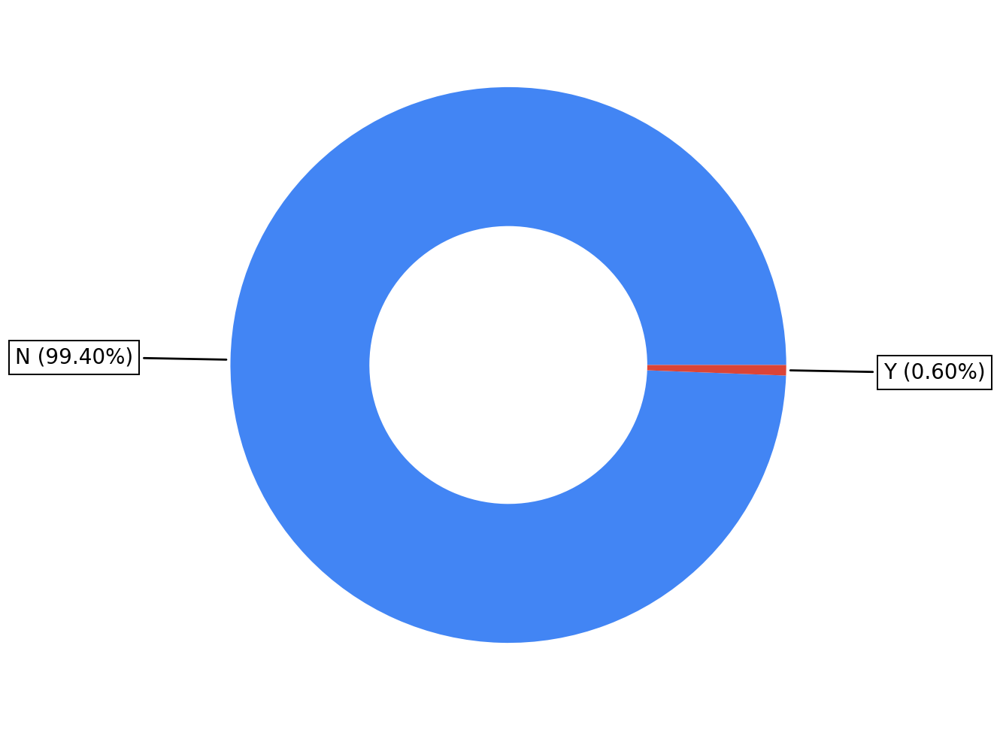

In [94]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sff_vc = data.store_and_fwd_flag.value_counts()
wedges, texts = ax.pie(sff_vc.values, textprops={'color': '#333333'}, colors=[pc[0], pc[1]], 
                       wedgeprops=dict(width=0.5), pctdistance=0.72)

bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(arrowprops=dict(arrowstyle="-"), bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    kw["arrowprops"].update({"connectionstyle": connectionstyle})
    ax.annotate("{} ({:.2f}%)".format(sff_vc.index[i], sff_vc.values[i]*100/np.sum(sff_vc.values)), 
                xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
                horizontalalignment=horizontalalignment, **kw)
    
plot_conf(ax, xlbl='', ylbl='', t='')
ax.set_aspect(1)
fig.savefig('{}stfdisttr.png'.format(rep_files_p), dpi=300)

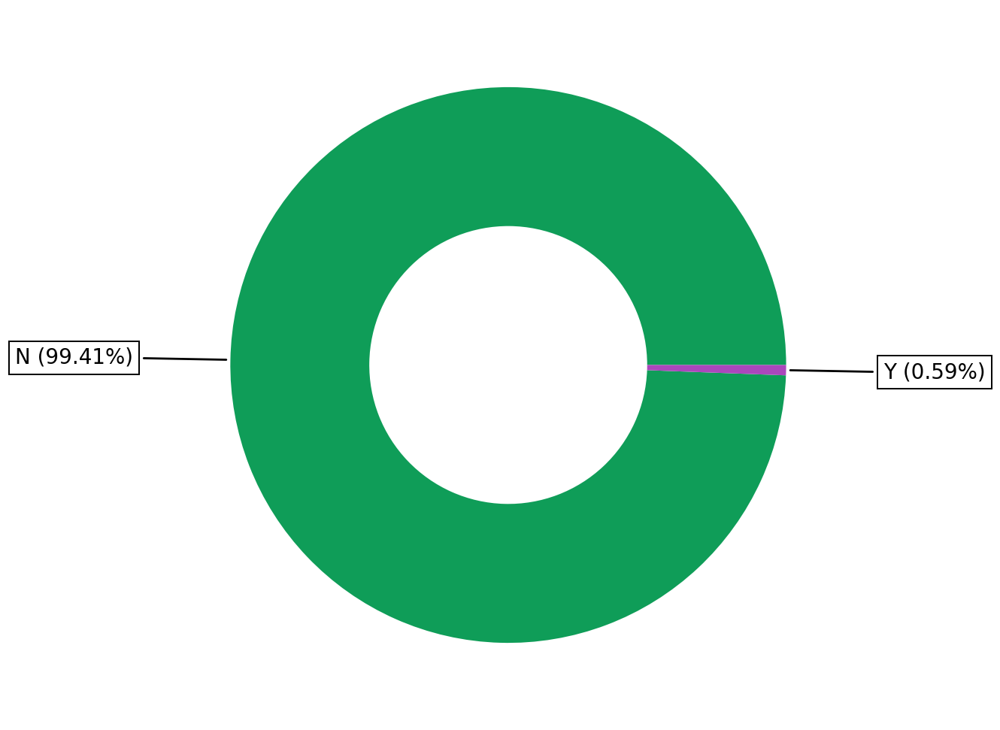

In [95]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sff_vc = test_data.store_and_fwd_flag.value_counts()
wedges, texts = ax.pie(sff_vc.values, textprops={'color': '#333333'}, colors=[pc[3], pc[4]], 
                       wedgeprops=dict(width=0.5), pctdistance=0.72)

bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(arrowprops=dict(arrowstyle="-"), bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    kw["arrowprops"].update({"connectionstyle": connectionstyle})
    ax.annotate("{} ({:.2f}%)".format(sff_vc.index[i], sff_vc.values[i]*100/np.sum(sff_vc.values)), 
                xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
                horizontalalignment=horizontalalignment, **kw)
    
plot_conf(ax, xlbl='', ylbl='', t='')
ax.set_aspect(1)
fig.savefig('{}stfdistts.png'.format(rep_files_p), dpi=300)

### Pickup-location-ID distribution

In [96]:
data.PULocationID.value_counts().head()

237    379739
161    375901
230    356424
186    355545
236    351631
Name: PULocationID, dtype: int64

In [97]:
data.PULocationID.value_counts().tail()

44     2
84     1
245    1
27     1
59     1
Name: PULocationID, dtype: int64

### Payment-type distribution

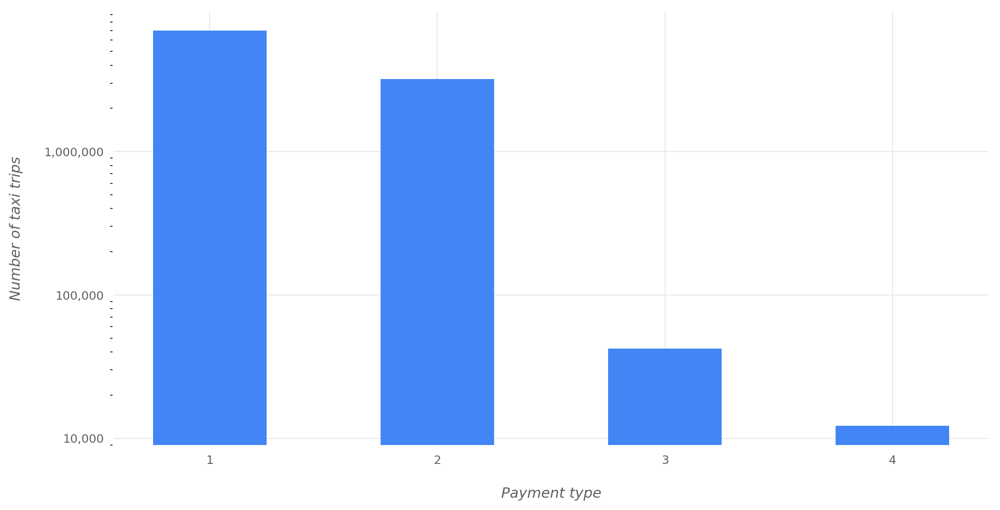

In [98]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
payt_vc = data.payment_type.value_counts()
ax.bar([str (x) for x in payt_vc.index], payt_vc.values, color=pc[0], log=True, width=0.5)
plot_conf(ax, xlbl='Payment type', ylbl='Number of taxi trips', t='')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}paydisttr.png'.format(rep_files_p), dpi=300)

In [99]:
data.payment_type.value_counts(normalize=True) * 100

1    68.164287
2    31.303439
3     0.412796
4     0.119477
Name: payment_type, dtype: float64

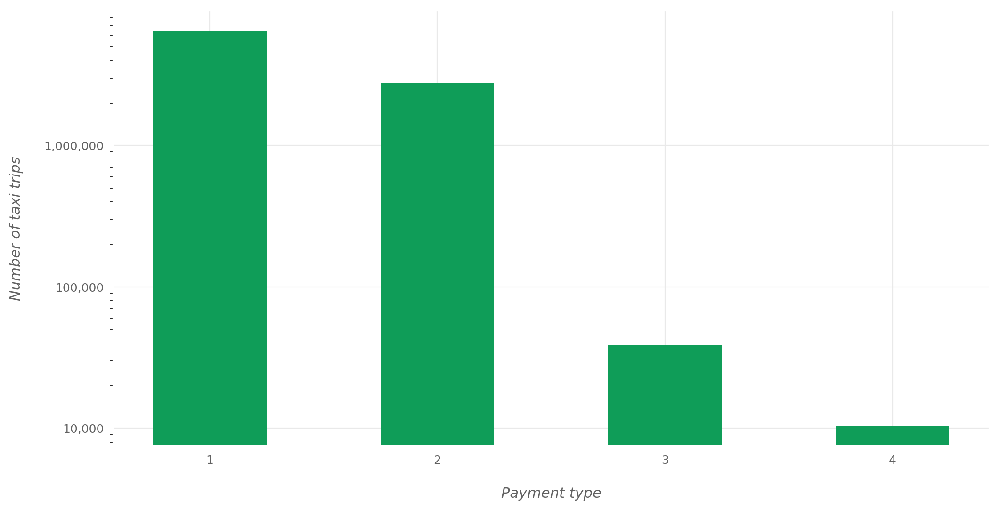

In [100]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
payt_vc = test_data.payment_type.value_counts()
ax.bar([str (x) for x in payt_vc.index], payt_vc.values, color=pc[3], log=True, width=0.5)
plot_conf(ax, xlbl='Payment type', ylbl='Number of taxi trips', t='')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}paydistts.png'.format(rep_files_p), dpi=300)

In [101]:
test_data.payment_type.value_counts(normalize=True) * 100

1    69.794023
2    29.673973
3     0.419983
4     0.112021
Name: payment_type, dtype: float64

### Total-amount distribution

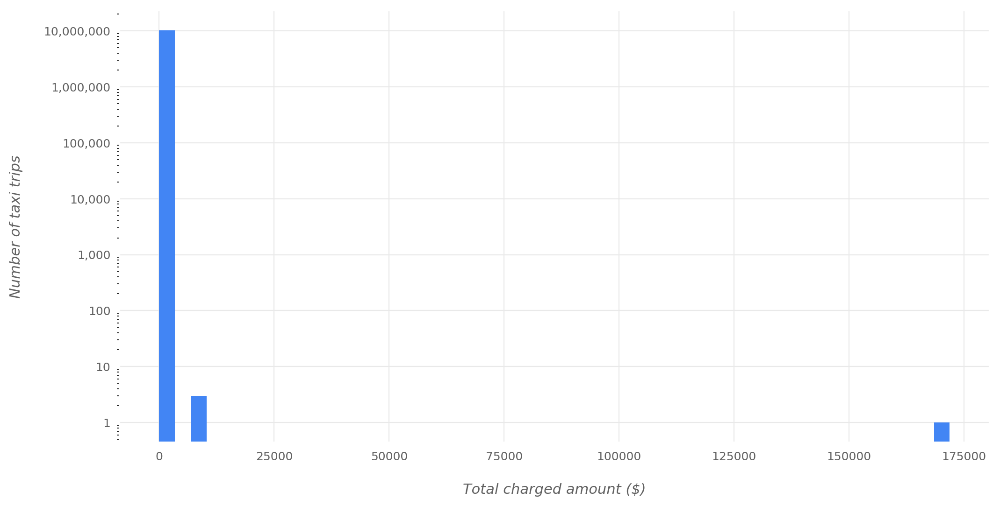

In [102]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.distplot(data.total_amount, kde=False, bins=50, color=pc[0], hist_kws={'alpha': 1, 'log': True})
plot_conf(ax, xlbl='Total charged amount ($)', ylbl='Number of taxi trips', t='')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}totaldisttr.png'.format(rep_files_p), dpi=300)

In [103]:
data[data.total_amount > 150000]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,trip_duration
9155331,1,2017-03-28 18:39:19,2017-03-28 19:01:53,2,5.9533,1,N,142,145,3,171861.78,1.0,0.5,0.0,0.0,0.3,171863.58,22.566667


In [104]:
data = data[data.total_amount < 150000]

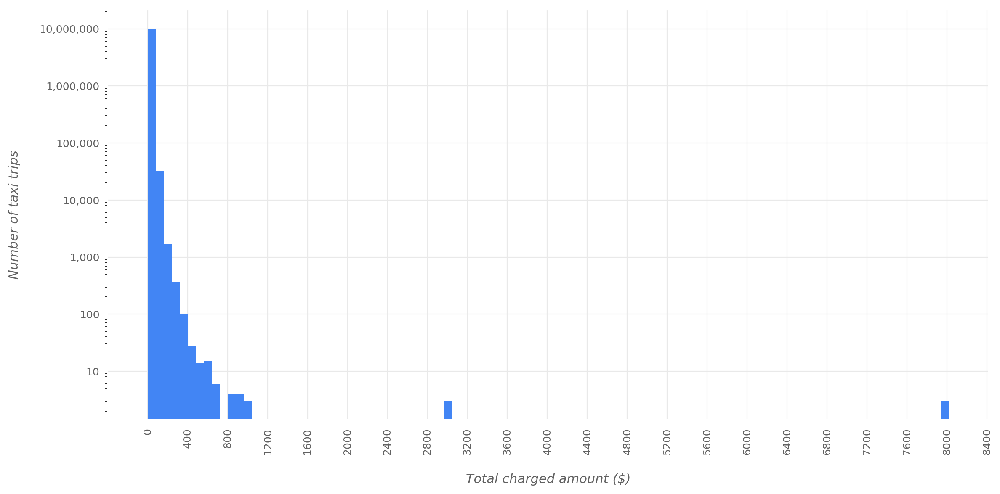

In [105]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.distplot(data.total_amount, kde=False, bins=100, color=pc[0], hist_kws={'alpha': 1, 'log': True})
plot_conf(ax, xlbl='Total charged amount ($)', ylbl='Number of taxi trips', t='')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
plt.xticks(range(0, int(data.total_amount.max())+400, 400), 
           range(0, int(data.total_amount.max())+400, 400), rotation=90)
plt.tight_layout()
fig.savefig('{}totaldisttr2.png'.format(rep_files_p), dpi=300)

In [106]:
# # not added to the report yet
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.stripplot(data.total_amount, color=pc[0], size=4)
# plot_conf(ax, xlbl='Total charged amount ($)', ylbl='', t='')
# fig.savefig('{}totaldiststrtr.png'.format(rep_files_p), dpi=300)

In [107]:
data[data.total_amount < 80].shape[0] / data.shape[0] * 100

99.6581858359472

In [108]:
data[data.total_amount > 7000]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,trip_duration
971076,1,2017-03-02 17:57:18,2017-03-02 18:20:10,1,6.5969,1,N,264,264,3,8015.0,-13.68,14.48,0.0,0.0,0.0,8015.8,22.866667
1960809,1,2017-03-04 22:38:45,2017-03-04 22:44:54,1,2.7353,1,N,264,264,3,8006.5,-45.72,46.52,0.0,0.0,0.0,8007.3,6.150000
4835686,1,2017-03-13 23:36:19,2017-03-13 23:40:36,1,2.5744,1,N,264,264,2,8005.5,-52.73,53.53,0.0,0.0,0.0,8006.3,4.283333


In [109]:
data = data[data.total_amount <= 7000]

In [110]:
data[data.total_amount > 2000]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,trip_duration
1926622,1,2017-03-04 21:27:09,2017-03-04 21:43:13,2,5.6315,1,N,264,264,3,3012.0,-53.71,54.51,0.0,0.0,0.0,3012.8,16.066667
2310518,1,2017-03-05 21:21:56,2017-03-05 21:31:20,2,3.8616,1,N,264,264,3,3008.0,0.00,0.50,0.0,0.0,0.3,3008.8,9.400000
4146145,1,2017-03-11 23:07:12,2017-03-11 23:21:00,1,5.1488,1,N,264,264,2,3011.0,-17.73,18.53,0.0,0.0,0.0,3011.8,13.800000


In [111]:
data = data[data.total_amount <= 2000]

# Weather EDA: Single-Variables

In [112]:
# # not included in the report
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.distplot(weather_data['Average Temperature'], kde=False, bins=13, color=pc[0], hist_kws={'alpha': 1})
# plot_conf(ax, xlbl='Total charged amount ($)', ylbl='Number of taxi trips', t='')
# ax.yaxis.set_major_locator(MaxNLocator(nbins='auto', integer=True));
# plt.xticks()
# fig.savefig('{}avgtemp.png'.format(rep_files_p), dpi=300)

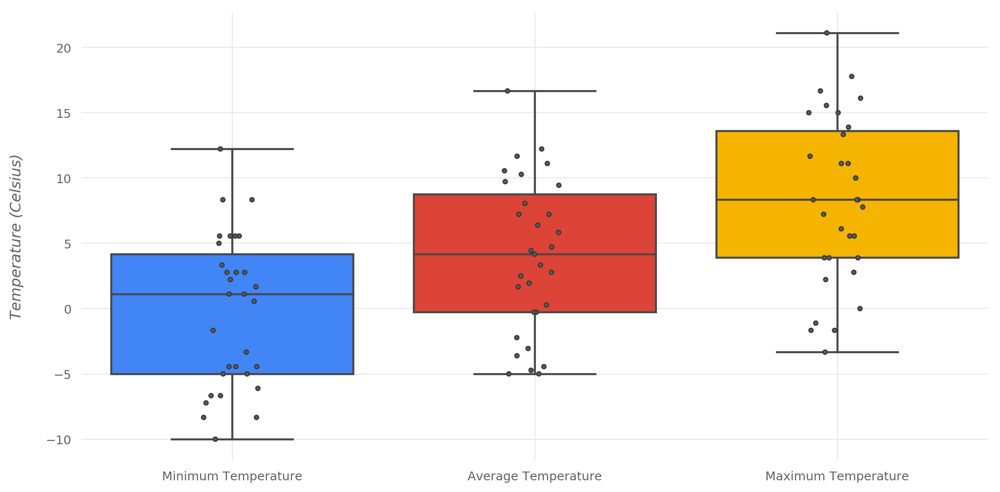

In [113]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.boxplot(data=weather_data[['Minimum Temperature', 'Average Temperature', 'Maximum Temperature']], 
            palette=sns.color_palette([pc[0], pc[1], pc[2]]), saturation=1, whis=np.Inf)
sns.stripplot(data=weather_data[['Minimum Temperature', 'Average Temperature', 'Maximum Temperature']], 
              color='#616161', size=3, linewidth=1)
plot_conf(ax, xlbl='', ylbl='Temperature (Celsius)', t='')
fig.savefig('{}tempbxtr.png'.format(rep_files_p), dpi=300)

In [114]:
print(weather_data['Minimum Temperature'].min(), weather_data['Minimum Temperature'].max())
print(weather_data['Average Temperature'].min(), weather_data['Average Temperature'].max())
print(weather_data['Maximum Temperature'].min(), weather_data['Maximum Temperature'].max())

-10.0 12.222222222222221
-5.0 16.666666666666668
-3.3333333333333335 21.11111111111111


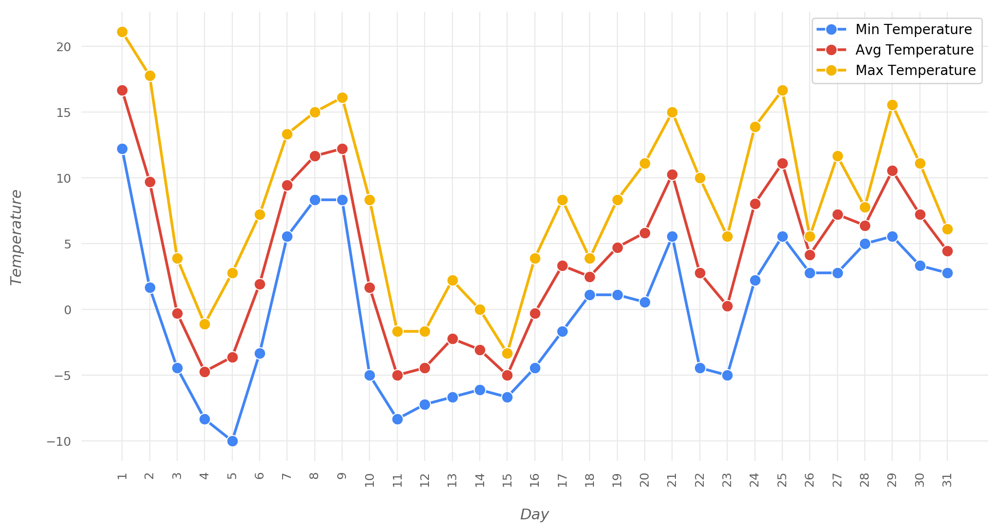

In [115]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.lineplot(weather_data['Date'].dt.day, weather_data['Minimum Temperature'], 
             color=pc[0], marker='.', ms=17, lw=2, label='Min Temperature')
sns.lineplot(weather_data['Date'].dt.day, weather_data['Average Temperature'], 
             color=pc[1], marker='.', ms=17, lw=2, label='Avg Temperature')
sns.lineplot(weather_data['Date'].dt.day, weather_data['Maximum Temperature'], 
             color=pc[2], marker='.', ms=17, lw=2, label='Max Temperature')
plot_conf(ax, xlbl='Day', ylbl='Temperature', t='')
plt.xticks(range(1,32), range(1,32), rotation=90);
# ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}dailytemtr.png'.format(rep_files_p), dpi=300)

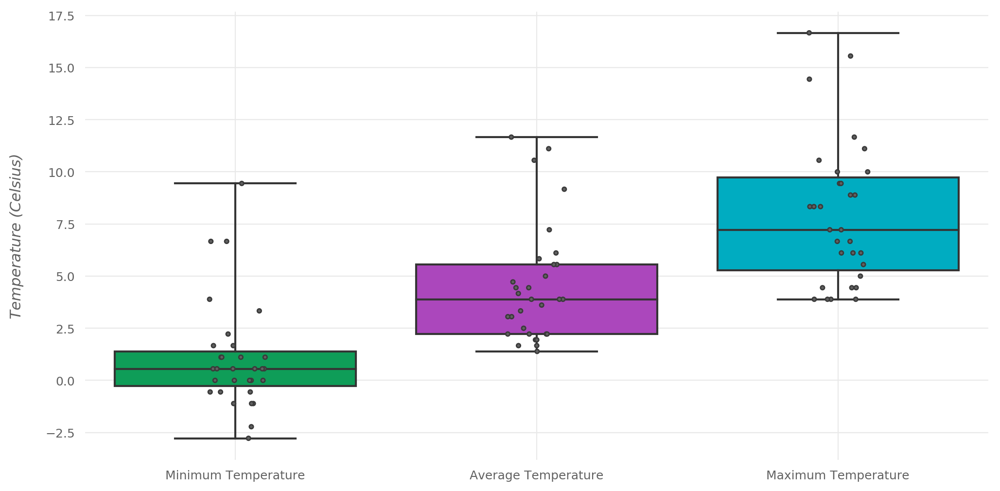

In [116]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.boxplot(data=weather_test_data[['Minimum Temperature', 'Average Temperature', 'Maximum Temperature']], 
            palette=sns.color_palette([pc[3], pc[4], pc[5]]), saturation=1, whis=np.Inf)
sns.stripplot(data=weather_test_data[['Minimum Temperature', 'Average Temperature', 'Maximum Temperature']], 
              color='#616161', size=3, linewidth=1)
plot_conf(ax, xlbl='', ylbl='Temperature (Celsius)', t='')
fig.savefig('{}tempbxts.png'.format(rep_files_p), dpi=300)

In [117]:
print(weather_test_data['Minimum Temperature'].min(), weather_test_data['Minimum Temperature'].max())
print(weather_test_data['Average Temperature'].min(), weather_test_data['Average Temperature'].max())
print(weather_test_data['Maximum Temperature'].min(), weather_test_data['Maximum Temperature'].max())

-2.7777777777777777 9.444444444444445
1.3888888888888888 11.666666666666666
3.888888888888889 16.666666666666668


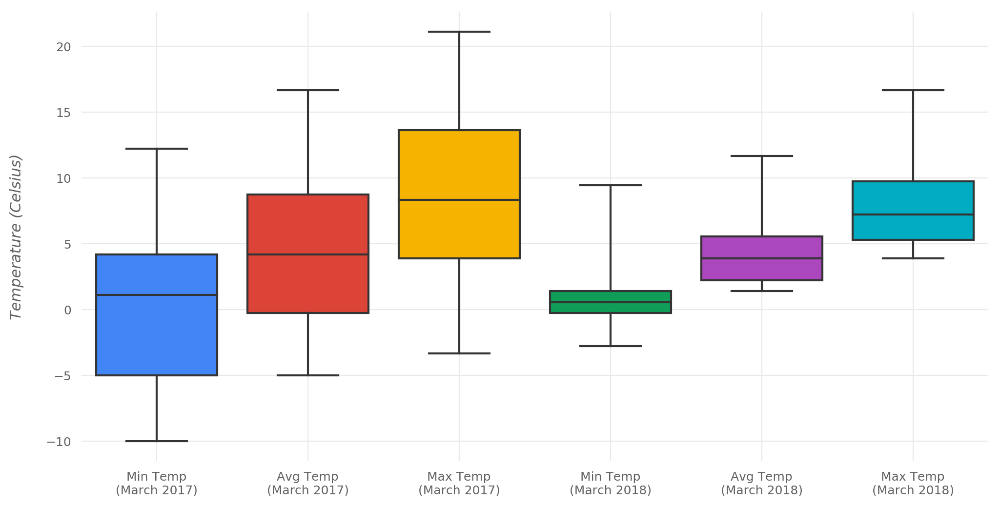

In [118]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
tmp_df = pd.concat([
    weather_data[['Minimum Temperature', 'Average Temperature', 'Maximum Temperature']].rename(
    columns={'Minimum Temperature': 'Min Temp\n(March 2017)', 
             'Average Temperature': 'Avg Temp\n(March 2017)', 
             'Maximum Temperature': 'Max Temp\n(March 2017)'}),
    weather_test_data[['Minimum Temperature', 'Average Temperature', 'Maximum Temperature']].rename(
    columns={'Minimum Temperature': 'Min Temp\n(March 2018)', 
             'Average Temperature': 'Avg Temp\n(March 2018)', 
             'Maximum Temperature': 'Max Temp\n(March 2018)'})
], axis=1)
sns.boxplot(data=tmp_df, palette=sns.color_palette([pc[0], pc[1], pc[2], pc[3], pc[4], pc[5]]), 
            saturation=1, whis=np.Inf)
plot_conf(ax, xlbl='', ylbl='Temperature (Celsius)', t='')
fig.savefig('{}tempbxall.png'.format(rep_files_p), dpi=300)

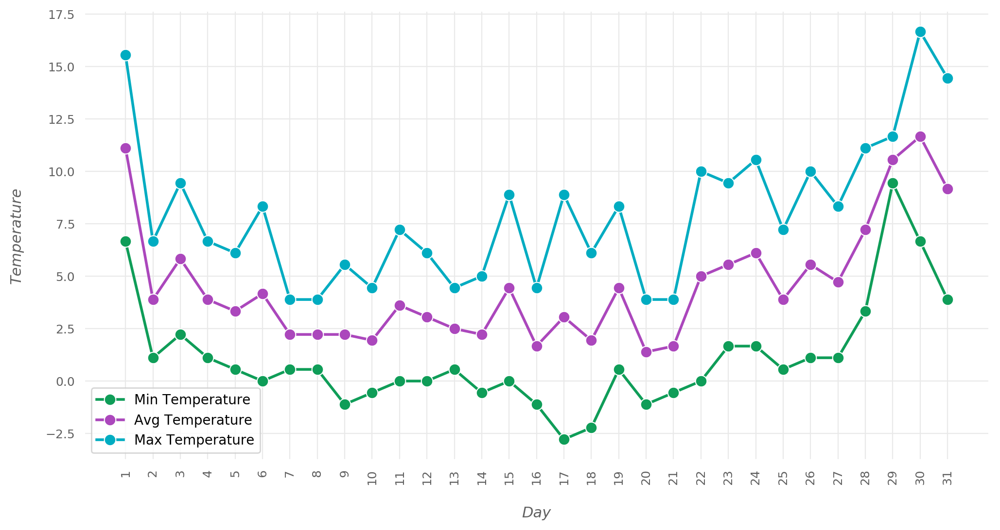

In [119]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.lineplot(weather_test_data['Date'].dt.day, weather_test_data['Minimum Temperature'], 
             color=pc[3], marker='.', ms=17, lw=2, label='Min Temperature')
sns.lineplot(weather_test_data['Date'].dt.day, weather_test_data['Average Temperature'], 
             color=pc[4], marker='.', ms=17, lw=2, label='Avg Temperature')
sns.lineplot(weather_test_data['Date'].dt.day, weather_test_data['Maximum Temperature'], 
             color=pc[5], marker='.', ms=17, lw=2, label='Max Temperature')
plot_conf(ax, xlbl='Day', ylbl='Temperature', t='')
plt.xticks(range(1,32), range(1,32), rotation=90);
# ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}dailytemts.png'.format(rep_files_p), dpi=300)

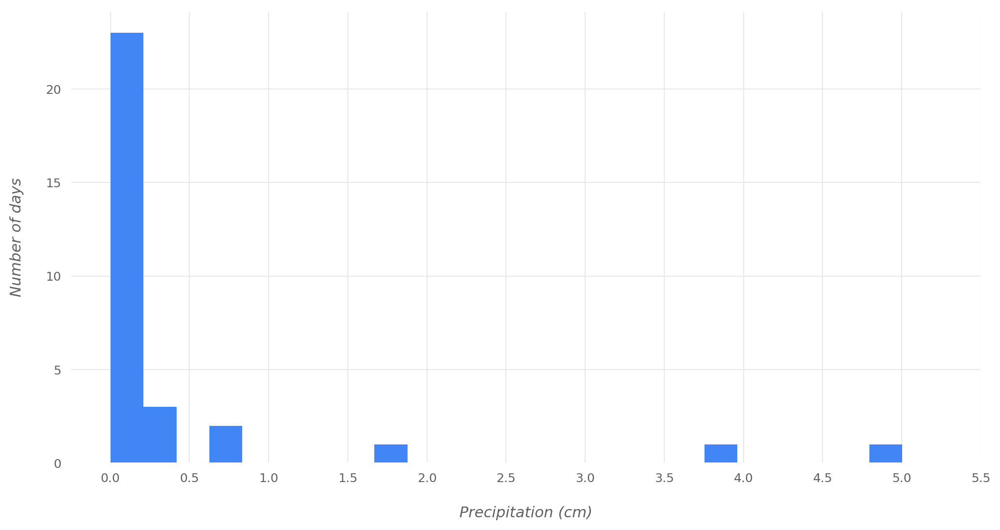

In [120]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.distplot(weather_data['Precipitation'], kde=False, bins=24, color=pc[0], hist_kws={'alpha': 1})
plot_conf(ax, xlbl='Precipitation (cm)', ylbl='Number of days', t='')
plt.xticks(np.arange(0, weather_data['Precipitation'].max()+0.5, 0.5),
           np.arange(0, weather_data['Precipitation'].max()+0.5, 0.5))
fig.savefig('{}precdisttr.png'.format(rep_files_p), dpi=300)

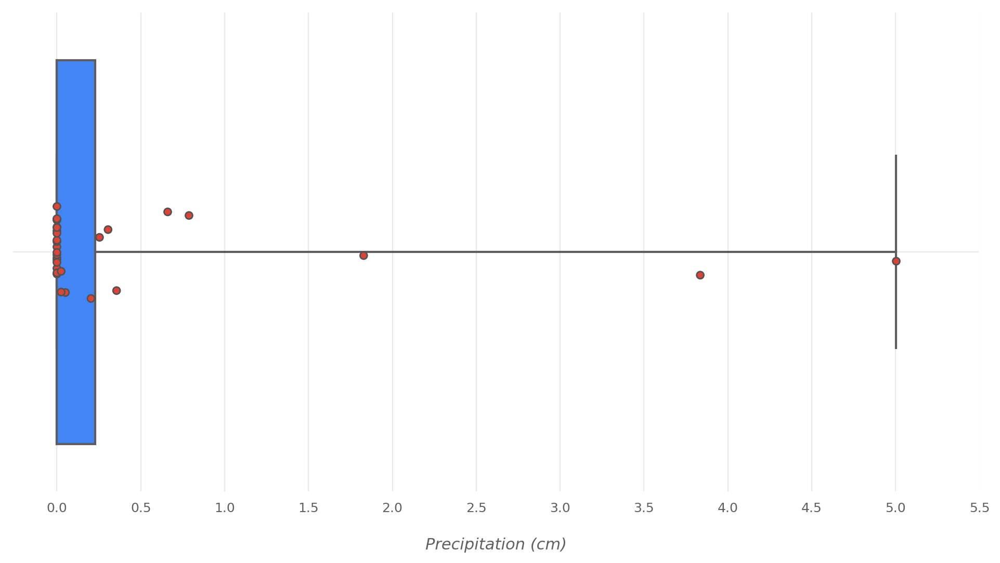

In [121]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.boxplot(weather_data['Precipitation'], saturation=1, color=pc[0], whis=np.Inf)
sns.stripplot(weather_data['Precipitation'], color=pc[1], size=5, linewidth=1)
plot_conf(ax, xlbl='Precipitation (cm)', ylbl='', t='')
plt.xticks(np.arange(0, weather_data['Precipitation'].max()+0.5, 0.5),
           np.arange(0, weather_data['Precipitation'].max()+0.5, 0.5))
fig.savefig('{}precdistbstr.png'.format(rep_files_p), dpi=300)

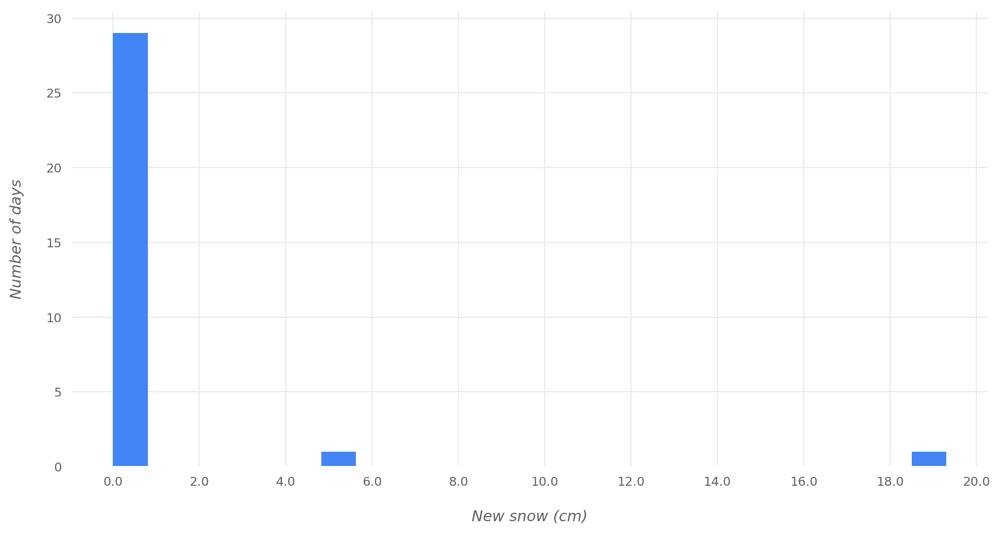

In [122]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.distplot(weather_data['New Snow'], kde=False, bins=24, color=pc[0], hist_kws={'alpha': 1})
plot_conf(ax, xlbl='New snow (cm)', ylbl='Number of days', t='')
plt.xticks(np.arange(0, weather_data['New Snow'].max()+2, 2),
           np.arange(0, weather_data['New Snow'].max()+2, 2))
fig.savefig('{}snowdisttr.png'.format(rep_files_p), dpi=300)

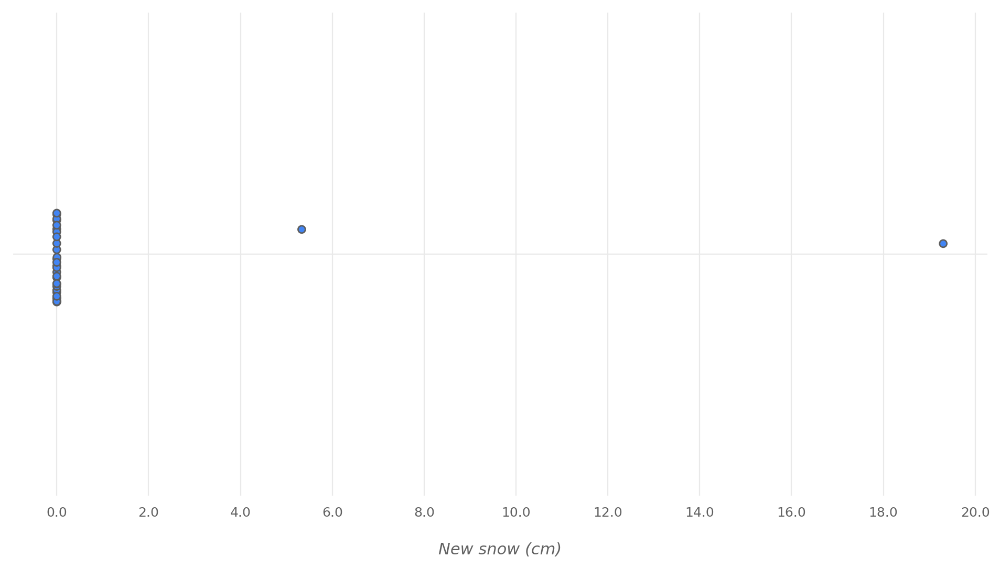

In [123]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.boxplot(weather_data['New Snow'], saturation=1, color=pc[0], whis=np.Inf)
sns.stripplot(weather_data['New Snow'], color=pc[0], size=5, linewidth=1)
plot_conf(ax, xlbl='New snow (cm)', ylbl='', t='')
plt.xticks(np.arange(0, weather_data['New Snow'].max()+2, 2),
           np.arange(0, weather_data['New Snow'].max()+2, 2))
fig.savefig('{}snowdistbtr.png'.format(rep_files_p), dpi=300)

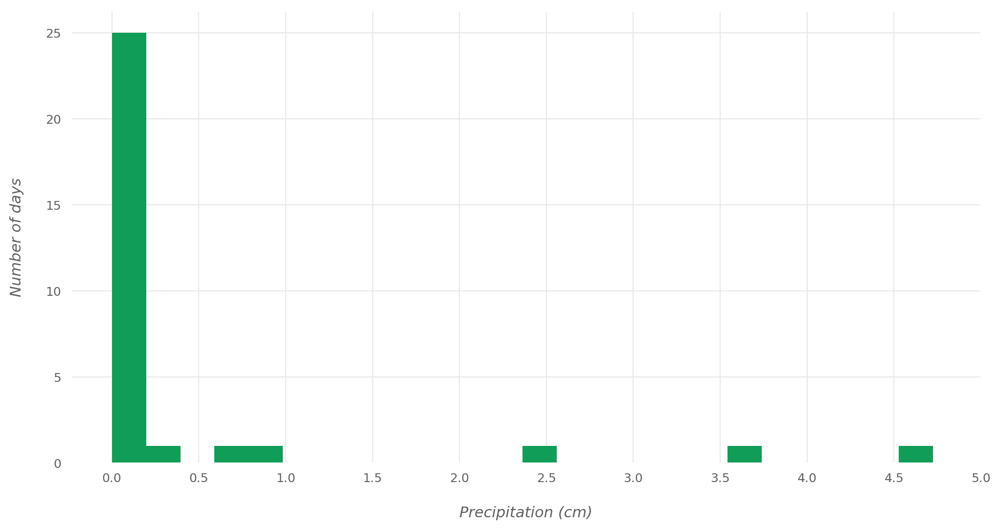

In [124]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.distplot(weather_test_data['Precipitation'], kde=False, bins=24, color=pc[3], hist_kws={'alpha': 1})
plot_conf(ax, xlbl='Precipitation (cm)', ylbl='Number of days', t='')
plt.xticks(np.arange(0, weather_test_data['Precipitation'].max()+0.5, 0.5),
           np.arange(0, weather_test_data['Precipitation'].max()+0.5, 0.5))
fig.savefig('{}precdistts.png'.format(rep_files_p), dpi=300)

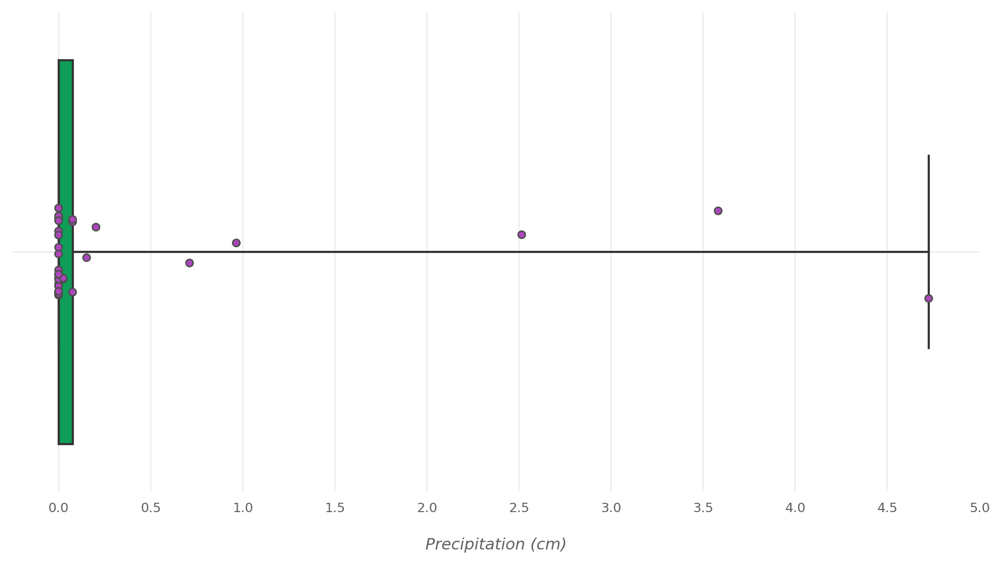

In [125]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.boxplot(weather_test_data['Precipitation'], saturation=1, color=pc[3], whis=np.Inf)
sns.stripplot(weather_test_data['Precipitation'], color=pc[4], size=5, linewidth=1)
plot_conf(ax, xlbl='Precipitation (cm)', ylbl='', t='')
plt.xticks(np.arange(0, weather_test_data['Precipitation'].max()+0.5, 0.5),
           np.arange(0, weather_test_data['Precipitation'].max()+0.5, 0.5))
fig.savefig('{}precdistbsts.png'.format(rep_files_p), dpi=300)

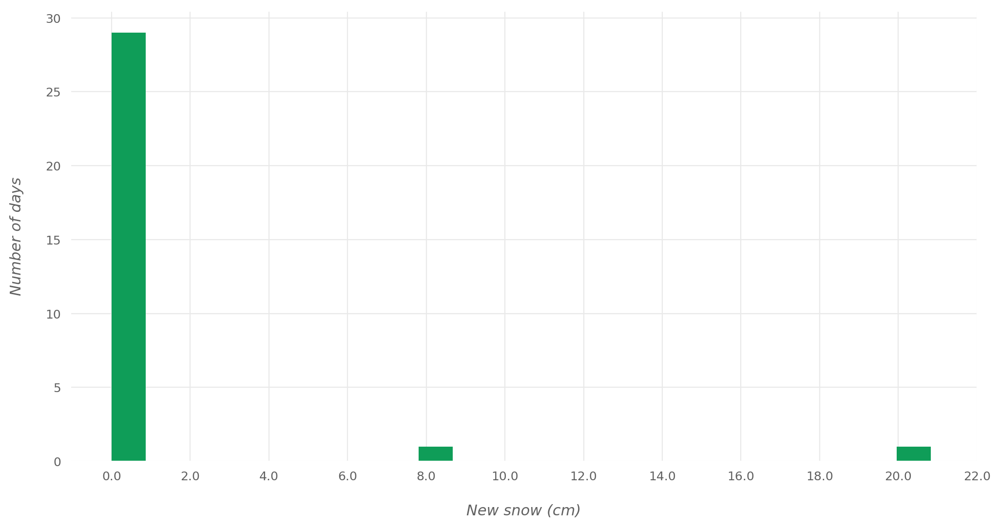

In [126]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.distplot(weather_test_data['New Snow'], kde=False, bins=24, color=pc[3], hist_kws={'alpha': 1})
plot_conf(ax, xlbl='New snow (cm)', ylbl='Number of days', t='')
plt.xticks(np.arange(0, weather_test_data['New Snow'].max()+2, 2),
           np.arange(0, weather_test_data['New Snow'].max()+2, 2))
fig.savefig('{}snowdistts.png'.format(rep_files_p), dpi=300)

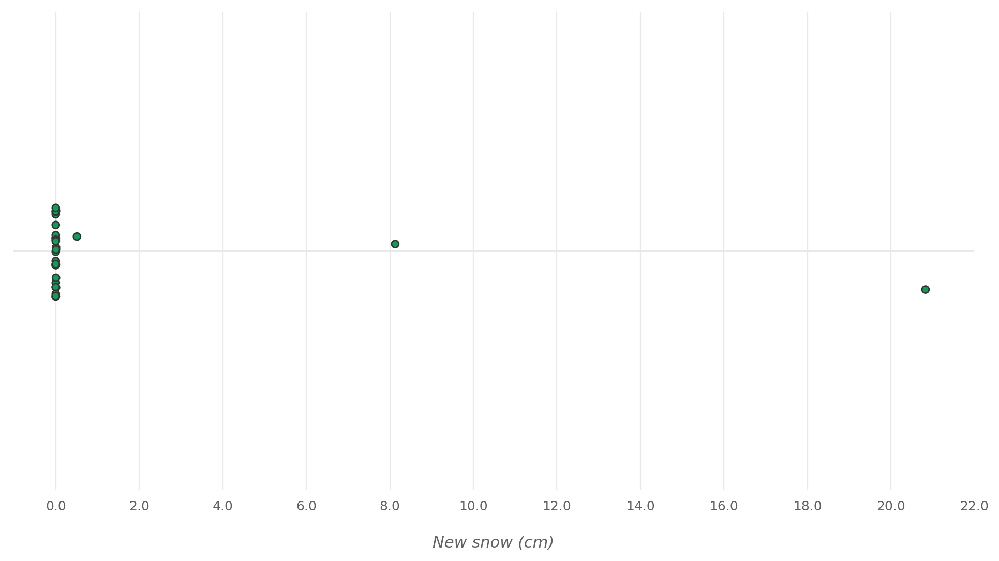

In [127]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.boxplot(weather_data['New Snow'], saturation=1, color=pc[0], whis=np.Inf)
sns.stripplot(weather_test_data['New Snow'], color=pc[3], size=5, linewidth=1)
plot_conf(ax, xlbl='New snow (cm)', ylbl='', t='')
plt.xticks(np.arange(0, weather_test_data['New Snow'].max()+2, 2),
           np.arange(0, weather_test_data['New Snow'].max()+2, 2))
fig.savefig('{}snowdistbts.png'.format(rep_files_p), dpi=300)

In [128]:
locID_borough_map = {}
for loc_id, b in zip(zones_lookup_table.LocationID.tolist(), zones_lookup_table.Borough.tolist()):
    locID_borough_map[loc_id] = b

In [129]:
data['pickup_borough'] = data['PULocationID'].map(locID_borough_map)
data['dropoff_borough'] = data['DOLocationID'].map(locID_borough_map)
test_data['pickup_borough'] = test_data['PULocationID'].map(locID_borough_map)
test_data['dropoff_borough'] = test_data['DOLocationID'].map(locID_borough_map)

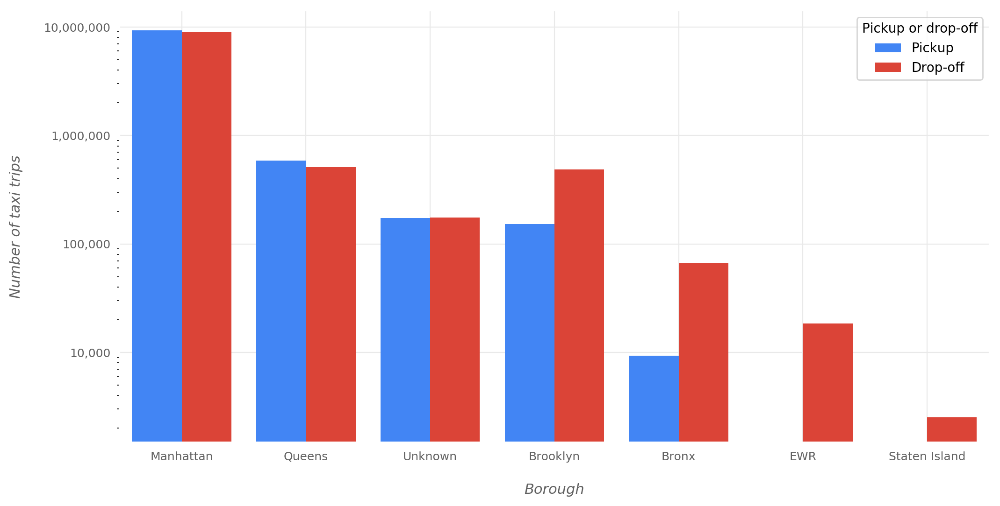

In [130]:
b_vc = data.pickup_borough.value_counts()
bp_vc = pd.DataFrame({'trip_count': b_vc.values}, index=b_vc.index)
bp_vc['Pickup or drop-off'] = 'Pickup'

b_vc = data.dropoff_borough.value_counts()
bd_vc = pd.DataFrame({'trip_count': b_vc.values}, index=b_vc.index)
bd_vc['Pickup or drop-off'] = 'Drop-off'

borough_vc = pd.concat([bp_vc, bd_vc])

fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.barplot(x=borough_vc.index, y=borough_vc.trip_count, hue=borough_vc['Pickup or drop-off'],
            palette=sns.color_palette([pc[0], pc[1]]), saturation=1, log=True)
plot_conf(ax, xlbl='Borough', ylbl='Number of taxi trips', t='')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}bordisttr.png'.format(rep_files_p), dpi=300)

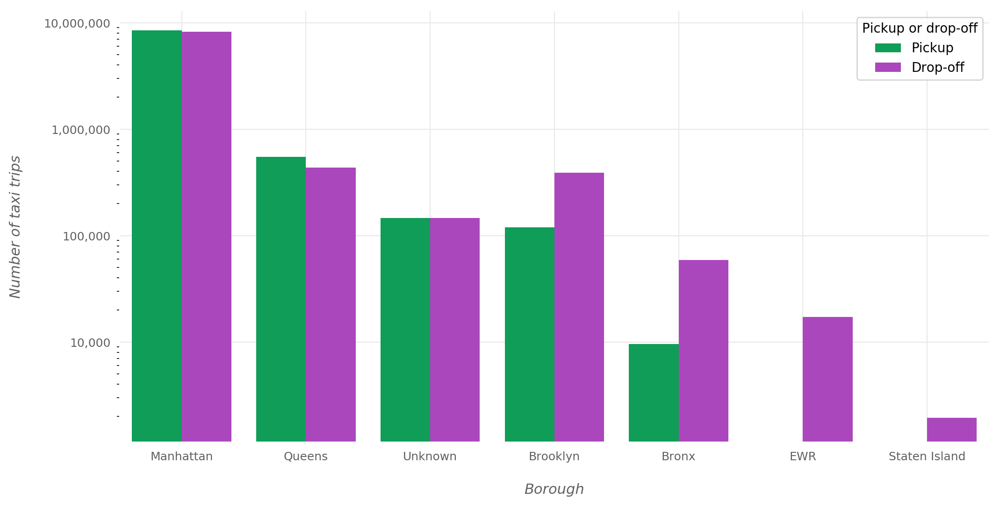

In [131]:
b_vc = test_data.pickup_borough.value_counts()
bp_vc = pd.DataFrame({'trip_count': b_vc.values}, index=b_vc.index)
bp_vc['Pickup or drop-off'] = 'Pickup'

b_vc = test_data.dropoff_borough.value_counts()
bd_vc = pd.DataFrame({'trip_count': b_vc.values}, index=b_vc.index)
bd_vc['Pickup or drop-off'] = 'Drop-off'

borough_vc = pd.concat([bp_vc, bd_vc])

fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.barplot(x=borough_vc.index, y=borough_vc.trip_count, hue=borough_vc['Pickup or drop-off'],
            palette=sns.color_palette([pc[3], pc[4]]), saturation=1, log=True)
plot_conf(ax, xlbl='Borough', ylbl='Number of taxi trips', t='')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}bordistts.png'.format(rep_files_p), dpi=300)

In [132]:
(data[(data.pickup_borough == 'Unknown') | (data.dropoff_borough == 'Unknown')].shape[0] / data.shape[0] * 100)

1.9197689911595417

In [133]:
(test_data[(test_data.pickup_borough == 'Unknown') | (test_data.dropoff_borough == 'Unknown')].shape[0] / 
 test_data.shape[0] * 100)

1.8000013769949752

# EDA: Relationships Between Variables

02:13
02:15


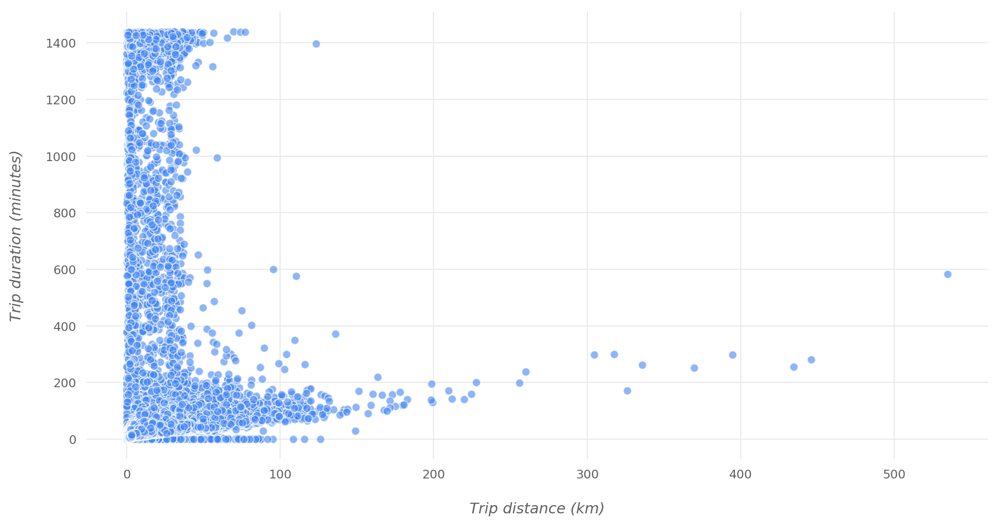

In [134]:
print(time.strftime('%H:%M'))
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.scatterplot(x=data.trip_distance, y=data.trip_duration, color=pc[0], 
                s=1, linewidth=0, edgecolor='none')
plot_conf(ax, xlbl='Trip distance (km)', ylbl='Trip duration (minutes)', t='')
fig.savefig('{}distdurtr.png'.format(rep_files_p), dpi=300)
print(time.strftime('%H:%M'))

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


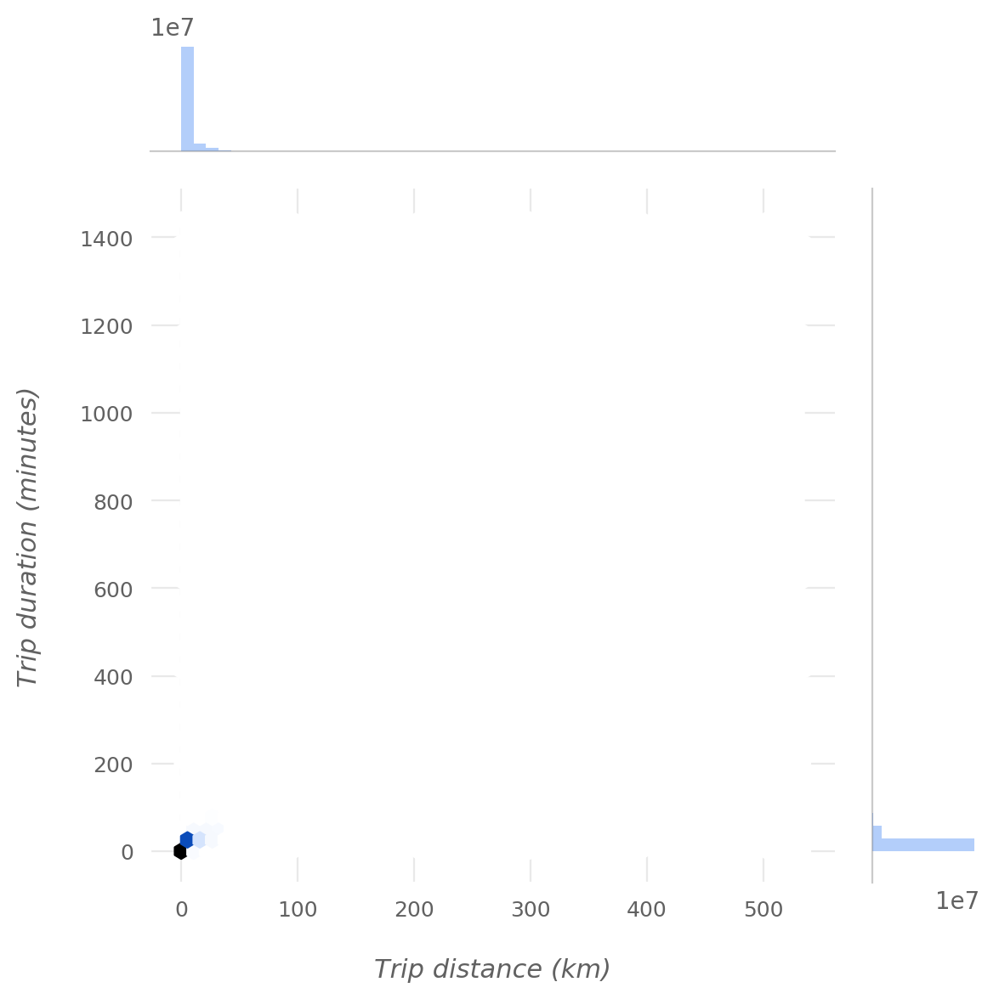

In [135]:
didu_j = sns.jointplot(x=data.trip_distance, y=data.trip_duration, kind="hex", color=pc[0]);
plot_conf(didu_j.ax_joint, xlbl='Trip distance (km)', ylbl='Trip duration (minutes)', t='')
plot_conf(didu_j.ax_marg_x, xlbl='', ylbl='', t='')
plot_conf(didu_j.ax_marg_y, xlbl='', ylbl='', t='')
didu_j.ax_marg_x.grid(False)
didu_j.ax_marg_x.spines['bottom'].set_color('#61616155')
didu_j.ax_marg_y.grid(False)
didu_j.ax_marg_y.spines['bottom'].set_color('#616161')
didu_j.ax_marg_y.spines['left'].set_color('#61616155')
plt.tight_layout()
plt.savefig('{}distdurhxtr.png'.format(rep_files_p), dpi=300)

### Speed

In [136]:
data['speed (km/h)'] = (data['trip_distance'] / data['trip_duration'] * 60)
test_data['speed (km/h)'] = (test_data['trip_distance'] / test_data['trip_duration'] * 60)

In [137]:
# # not included in the report
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.distplot(data['speed (km/h)'], kde=False, bins='sqrt', color=pc[0], hist_kws={'alpha': 1, 'log': True})
# plot_conf(ax, xlbl='Speed (km/h)', ylbl='Number of taxi trips', t='')
# plt.xticks(range(0, int(data['speed (km/h)'].max())+100, 10000),
#            range(0, int(data['speed (km/h)'].max())+100, 10000), rotation=90)
# ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
# ax.xaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
# fig.savefig('{}speeddisttr.png'.format(rep_files_p), dpi=300)

02:18
02:23


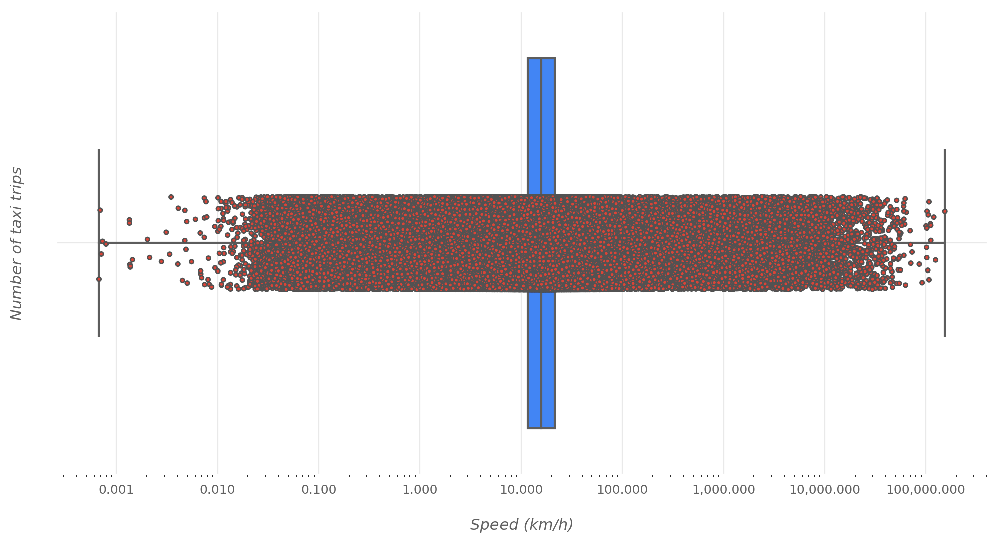

In [138]:
print(time.strftime('%H:%M'))
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.boxplot(x=data['speed (km/h)'], color=pc[0], orient='h', saturation=1, whis=np.Inf)
sns.stripplot(data['speed (km/h)'], color=pc[1], size=3, linewidth=1)
plt.xscale('log')
plot_conf(ax, xlbl='Speed (km/h)', ylbl='Number of taxi trips', t='')
# plt.xticks(range(0, int(data['speed (km/h)'].max())+100, 10000),
#            range(0, int(data['speed (km/h)'].max())+100, 10000), rotation=90)
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,.3f}".format(x)));
fig.savefig('{}speeddistbxtr.png'.format(rep_files_p), dpi=300)
print(time.strftime('%H:%M'))

In [139]:
data['speed (km/h)'].quantile(q=0.99)

55.113030490388866

In [140]:
# # not included
# speed_q75, speed_q25 = np.percentile(data['speed (km/h)'], [75 ,25])
# speed_iqr = speed_q75 - speed_q25
# upper_outer_fence = speed_q75 + 3 * speed_iqr
# lower_outer_fence = speed_q25 - 3 * speed_iqr
# lower_outer_fence, upper_outer_fence

In [141]:
speed_mad = np.median(np.abs(data['speed (km/h)'] - np.median(data['speed (km/h)']))) 
speed_std = np.std(data['speed (km/h)'])
speed_mad, speed_std

(4.717070568082898, 275.05783024503216)

In [142]:
lower_limit = np.median(data['speed (km/h)']) - 2.5 * speed_mad
lower_limit

3.9517665328128917

In [143]:
for i in [2.5, 3, 3.1, 3.2, 3.3, 3.5]:
    ddd = np.median(data['speed (km/h)']) - i * speed_mad
    print(ddd, data[data['speed (km/h)'] < ddd].shape[0])

3.9517665328128917 87077
1.593231248771442 19864
1.121524191963152 16376
0.6498171351548621 13729
0.17811007834657389 8574
-0.7653040352700078 0


In [144]:
data_ = data.copy()

In [145]:
data.shape

(10223678, 21)

In [146]:
data = data[(data['speed (km/h)'] < 120) & (data['speed (km/h)'] > lower_limit)]

In [147]:
data.shape

(10126643, 21)

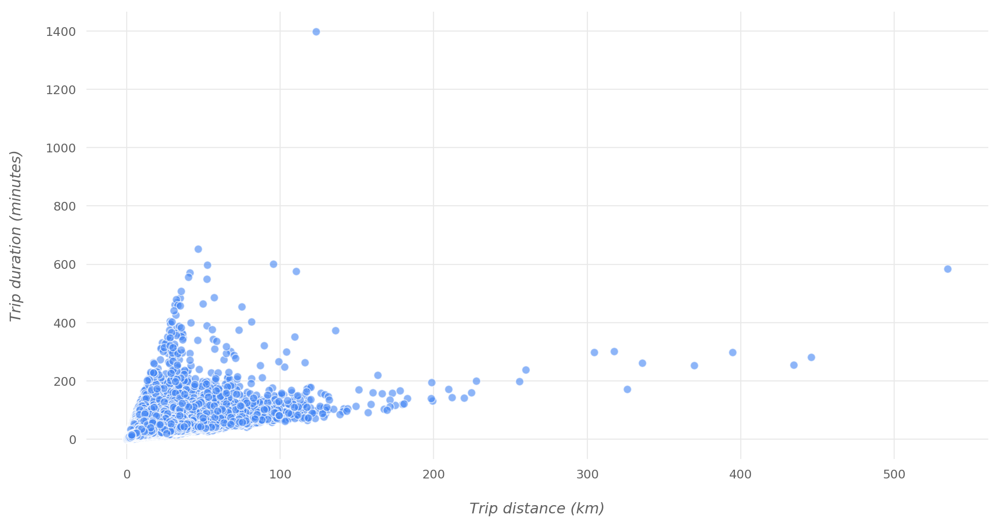

In [148]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.scatterplot(x=data.trip_distance, y=data.trip_duration, color=pc[0], 
                s=1, linewidth=0, edgecolor='none')
plot_conf(ax, xlbl='Trip distance (km)', ylbl='Trip duration (minutes)', t='')
fig.savefig('{}distduraftertr.png'.format(rep_files_p), dpi=300)

In [149]:
data[data.trip_duration > 1000]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,trip_duration,pickup_borough,dropoff_borough,speed (km/h)
6920497,2,2017-03-20 17:53:41,2017-03-21 17:11:35,1,123.34594,5,N,215,265,1,200.0,0.0,0.0,41.52,7.29,0.3,249.11,1397.9,Queens,Unknown,5.294196


In [150]:
data = data[data.trip_duration < 1000]
data.shape

(10126642, 21)

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


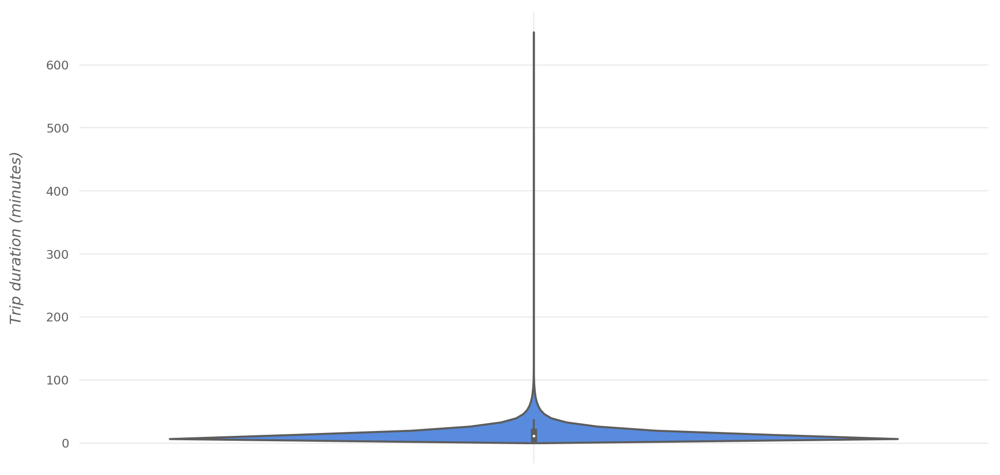

In [151]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.violinplot(data.trip_duration, cut=0, color=pc[0], orient='v')
plot_conf(ax, xlbl='', ylbl='Trip duration (minutes)', t='')
fig.savefig('{}vidurtr.png'.format(rep_files_p), dpi=300)

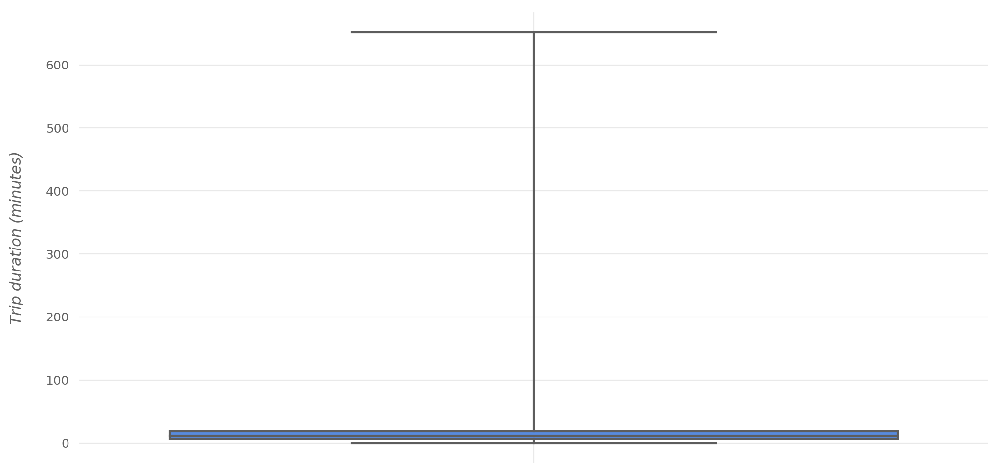

In [152]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.boxplot(data.trip_duration, whis=np.Inf, color=pc[0], orient='v')
plot_conf(ax, xlbl='', ylbl='Trip duration (minutes)', t='')
fig.savefig('{}bxdurtr.png'.format(rep_files_p), dpi=300)

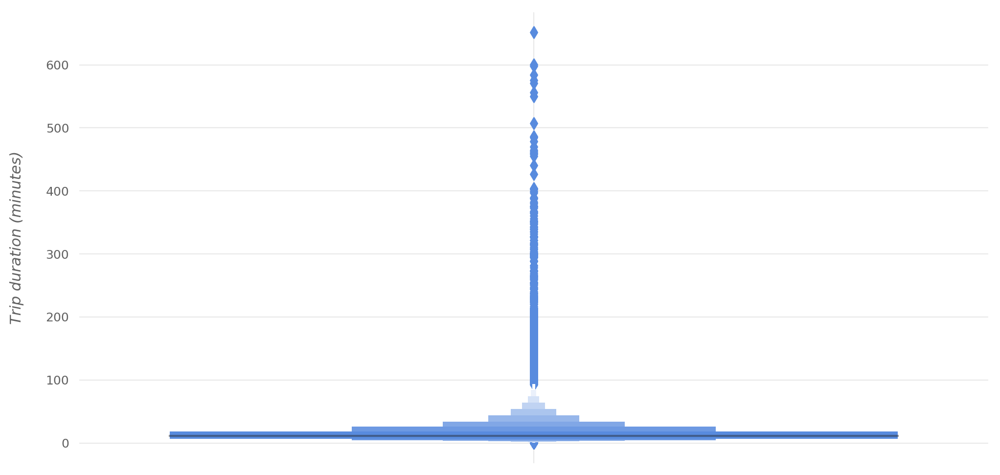

In [153]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.boxenplot(data.trip_duration, outlier_prop=0, color=pc[0], orient='v')
plot_conf(ax, xlbl='', ylbl='Trip duration (minutes)', t='')
fig.savefig('{}bxndurtr.png'.format(rep_files_p), dpi=300)

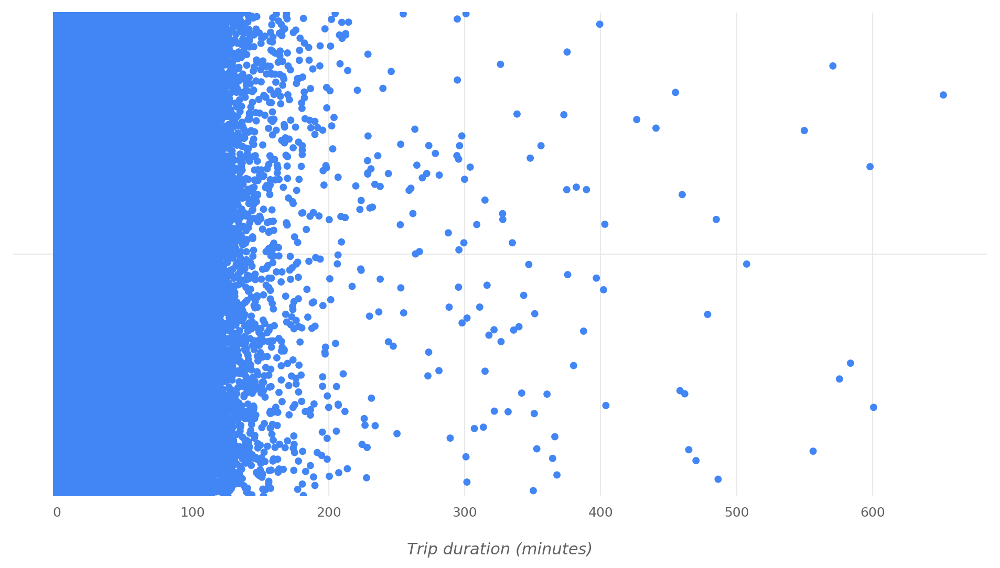

In [154]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.stripplot(data.trip_duration, jitter=0.5, color=pc[0], orient='h')
plot_conf(ax, xlbl='Trip duration (minutes)', ylbl='', t='')
fig.savefig('{}strdurtr.png'.format(rep_files_p), dpi=300)

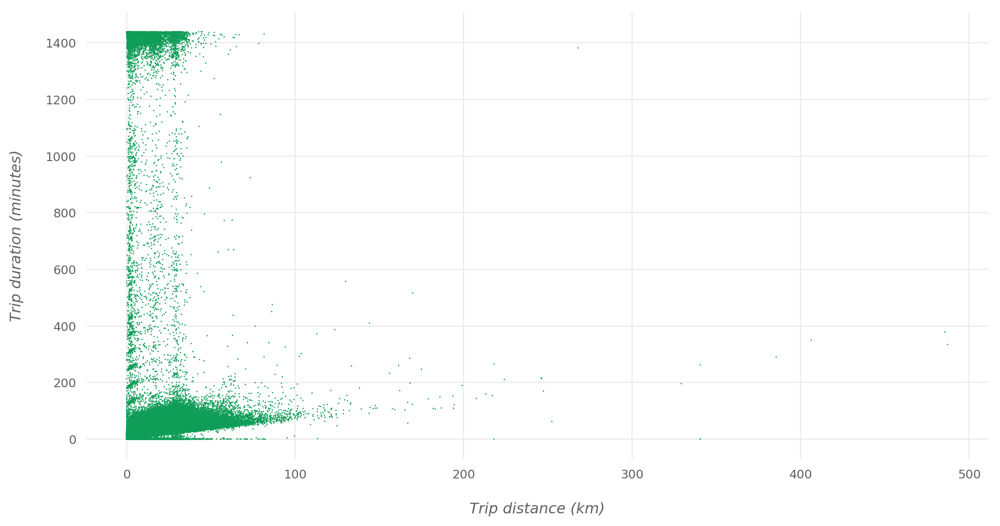

In [155]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.scatterplot(x=test_data.trip_distance, y=test_data.trip_duration, s=1, linewidth=0, edgecolor='none', color=pc[3])
plot_conf(ax, xlbl='Trip distance (km)', ylbl='Trip duration (minutes)', t='')
fig.savefig('{}distdurts.png'.format(rep_files_p), dpi=300)

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


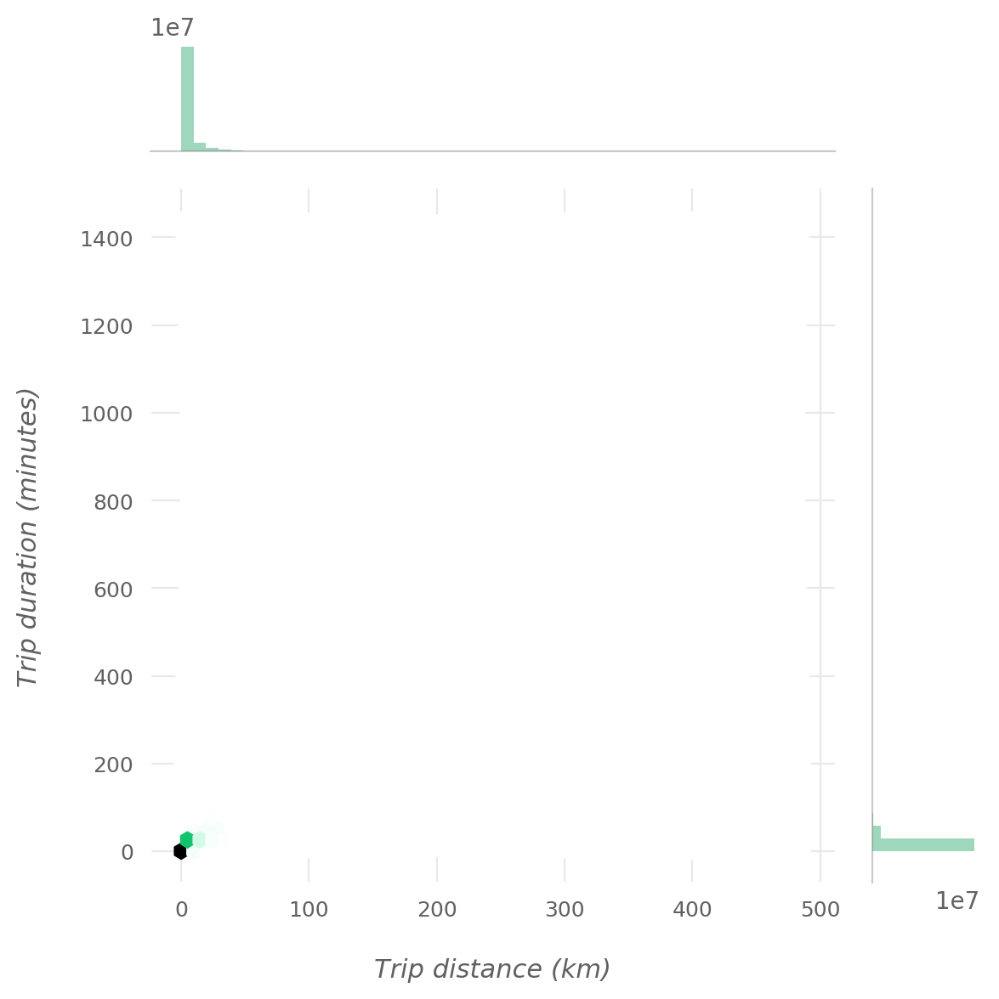

In [156]:
didu_j = sns.jointplot(x=test_data.trip_distance, y=test_data.trip_duration, kind="hex", color=pc[3]);
plot_conf(didu_j.ax_joint, xlbl='Trip distance (km)', ylbl='Trip duration (minutes)', t='')
plot_conf(didu_j.ax_marg_x, xlbl='', ylbl='', t='')
plot_conf(didu_j.ax_marg_y, xlbl='', ylbl='', t='')
didu_j.ax_marg_x.grid(False)
didu_j.ax_marg_x.spines['bottom'].set_color('#61616155')
didu_j.ax_marg_y.grid(False)
didu_j.ax_marg_y.spines['bottom'].set_color('#616161')
didu_j.ax_marg_y.spines['left'].set_color('#61616155')
plt.tight_layout()
plt.savefig('{}distdurhxts.png'.format(rep_files_p), dpi=300)

### Speed

In [157]:
# # not included in the report
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.distplot(data['speed (km/h)'], kde=False, bins='sqrt', color=pc[0], hist_kws={'alpha': 1, 'log': True})
# plot_conf(ax, xlbl='Speed (km/h)', ylbl='Number of taxi trips', t='')
# plt.xticks(range(0, int(data['speed (km/h)'].max())+100, 10000),
#            range(0, int(data['speed (km/h)'].max())+100, 10000), rotation=90)
# ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
# ax.xaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
# fig.savefig('{}speeddisttr.png'.format(rep_files_p), dpi=300)

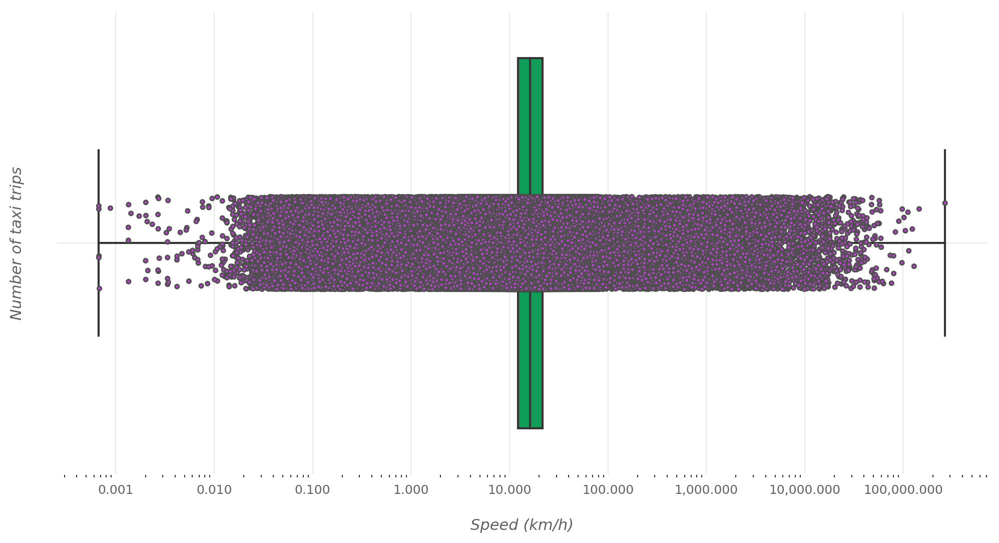

In [158]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.boxplot(x=test_data['speed (km/h)'], color=pc[3], orient='h', saturation=1, whis=np.Inf)
sns.stripplot(test_data['speed (km/h)'], color=pc[4], size=3, linewidth=1)
plt.xscale('log')
plot_conf(ax, xlbl='Speed (km/h)', ylbl='Number of taxi trips', t='')
# plt.xticks(range(0, int(data['speed (km/h)'].max())+100, 10000),
#            range(0, int(data['speed (km/h)'].max())+100, 10000), rotation=90)
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,.3f}".format(x)));
fig.savefig('{}speeddistbxts.png'.format(rep_files_p), dpi=300)

In [159]:
test_data['speed (km/h)'].quantile(q=0.99)

54.36838649767636

In [160]:
# # not included
# speed_q75, speed_q25 = np.percentile(data['speed (km/h)'], [75 ,25])
# speed_iqr = speed_q75 - speed_q25
# upper_outer_fence = speed_q75 + 3 * speed_iqr
# lower_outer_fence = speed_q25 - 3 * speed_iqr
# lower_outer_fence, upper_outer_fence

In [161]:
speed_mad = np.median(np.abs(test_data['speed (km/h)'] - np.median(test_data['speed (km/h)']))) 
speed_std = np.std(test_data['speed (km/h)'])
speed_mad, speed_std

(4.581538203407334, 253.17949881822122)

In [162]:
lower_limit = np.median(test_data['speed (km/h)']) - 2.5 * speed_mad
lower_limit

4.698039106866279

In [163]:
for i in [2.5, 3, 3.1, 3.2, 3.3, 3.5]:
    ddd = np.median(test_data['speed (km/h)']) - i * speed_mad
    print(ddd, test_data[test_data['speed (km/h)'] < ddd].shape[0])

4.698039106866279 88116
2.407270005162612 28980
1.9491161848218788 25544
1.4909623644811454 22825
1.032808544140412 20192
0.11650090345894526 7729


In [164]:
test_data_ = test_data.copy()

In [165]:
test_data.shape

(9295604, 21)

In [166]:
test_data = test_data[(test_data['speed (km/h)'] < 120) & (test_data['speed (km/h)'] > lower_limit)]

In [167]:
test_data.shape

(9199662, 21)

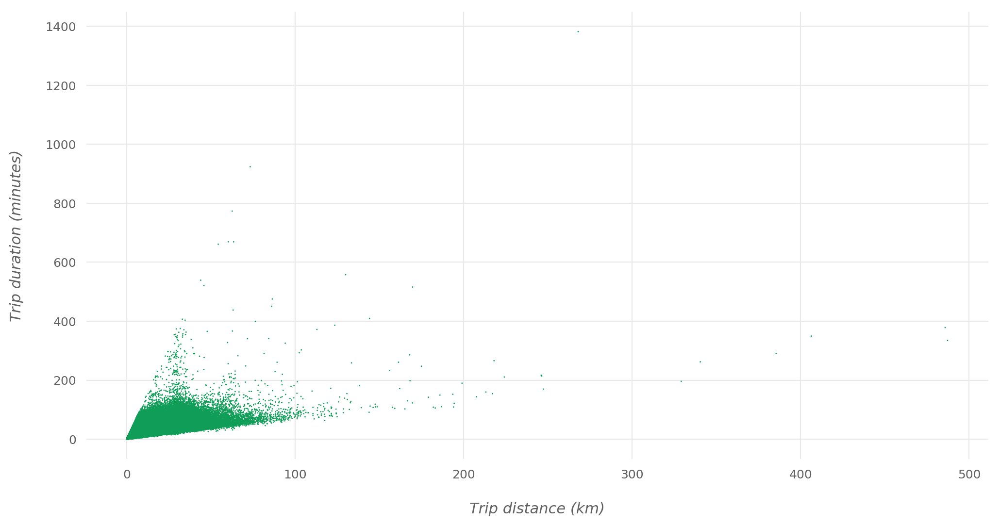

In [168]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.scatterplot(x=test_data.trip_distance, y=test_data.trip_duration, color=pc[3], 
                s=1, linewidth=0, edgecolor='none')
plot_conf(ax, xlbl='Trip distance (km)', ylbl='Trip duration (minutes)', t='')
fig.savefig('{}distdurafterts.png'.format(rep_files_p), dpi=300)

In [169]:
test_data[test_data.trip_duration > 1000]

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,trip_duration,pickup_borough,dropoff_borough,speed (km/h)
7909670,2,2018-03-27 03:45:59,2018-03-28 02:48:11,1,267.94677,5,N,163,133,2,190.0,0.0,0.0,0.0,0.0,0.3,190.3,1382.2,Manhattan,Brooklyn,11.631317


In [170]:
test_data = test_data[test_data.trip_duration < 1000]
test_data.shape

(9199661, 21)

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


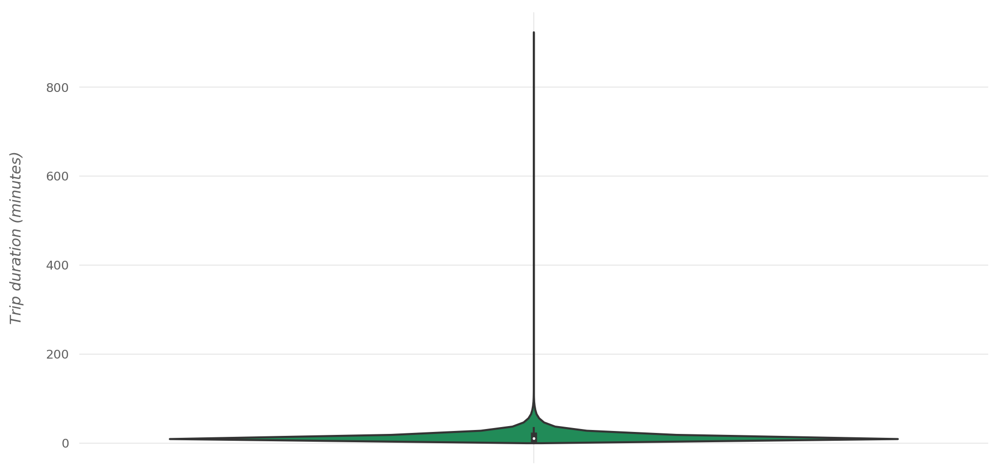

In [171]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.violinplot(test_data.trip_duration, cut=0, color=pc[3], orient='v')
plot_conf(ax, xlbl='', ylbl='Trip duration (minutes)', t='')
fig.savefig('{}vidurts.png'.format(rep_files_p), dpi=300)

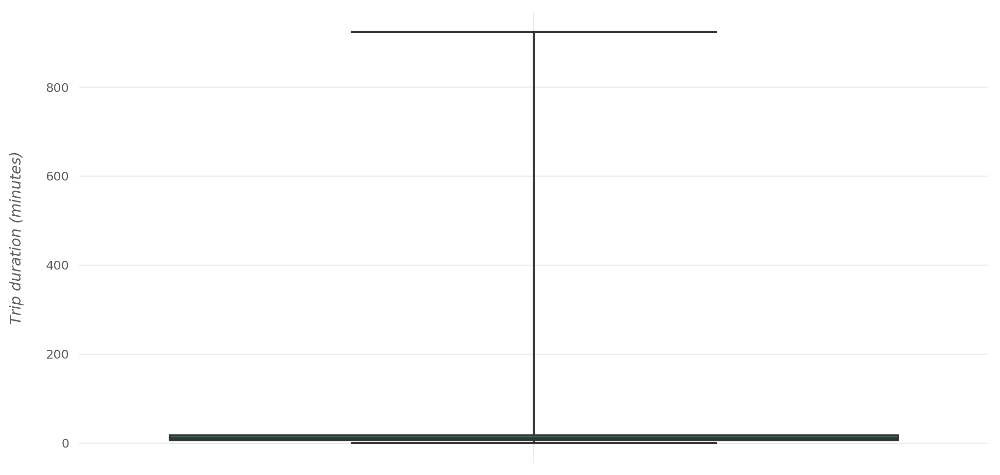

In [172]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.boxplot(test_data.trip_duration, whis=np.Inf, color=pc[3], orient='v')
plot_conf(ax, xlbl='', ylbl='Trip duration (minutes)', t='')
fig.savefig('{}bxdurts.png'.format(rep_files_p), dpi=300)

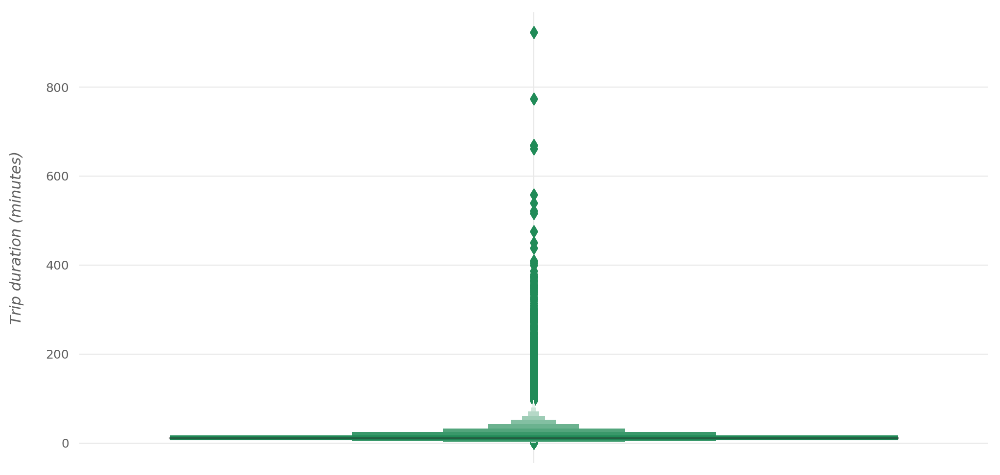

In [173]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.boxenplot(test_data.trip_duration, outlier_prop=0, color=pc[3], orient='v')
plot_conf(ax, xlbl='', ylbl='Trip duration (minutes)', t='')
fig.savefig('{}bxndurts.png'.format(rep_files_p), dpi=300)

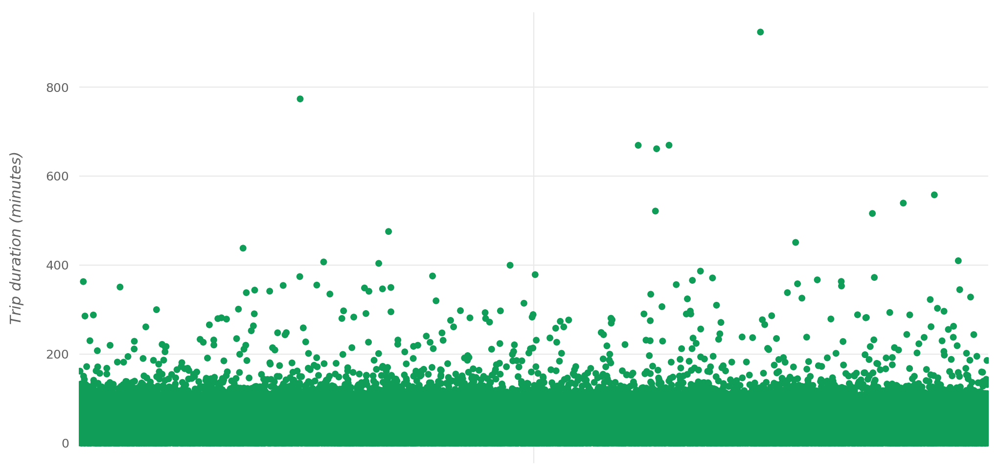

In [174]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.stripplot(test_data.trip_duration, jitter=0.5, color=pc[3], orient='v')
plot_conf(ax, xlbl='', ylbl='Trip duration (minutes)', t='')
fig.savefig('{}strdurts.png'.format(rep_files_p), dpi=300)

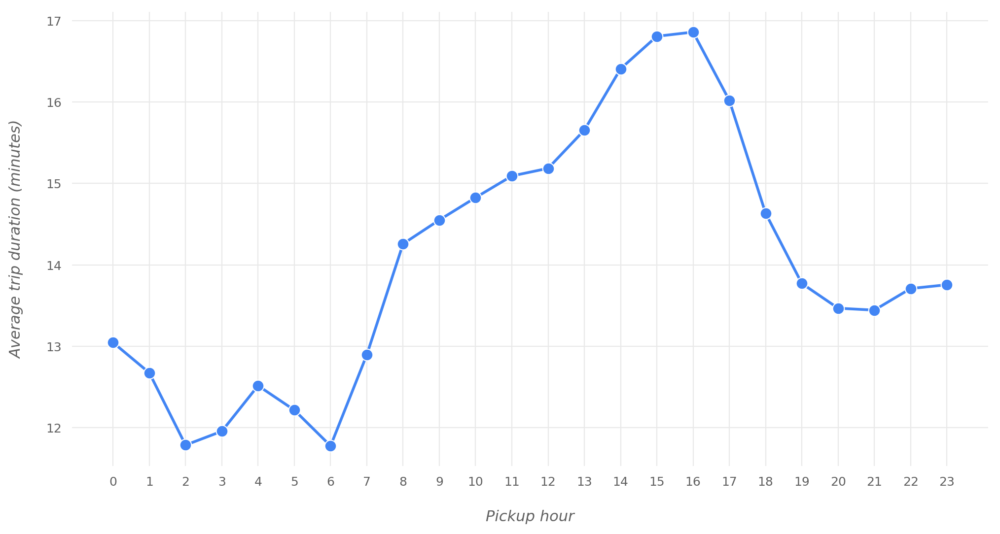

In [175]:
avg_dur_hour = data.groupby(data.tpep_pickup_datetime.dt.hour).trip_duration.mean()
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.lineplot(x=avg_dur_hour.index, y=avg_dur_hour.values, color=pc[0], 
             marker='.', ms=17, lw=2)
plot_conf(ax, xlbl='Pickup hour', ylbl='Average trip duration (minutes)', t='')
plt.xticks(range(0, 24), range(0,24))
fig.savefig('{}durhourtr.png'.format(rep_files_p), dpi=300)

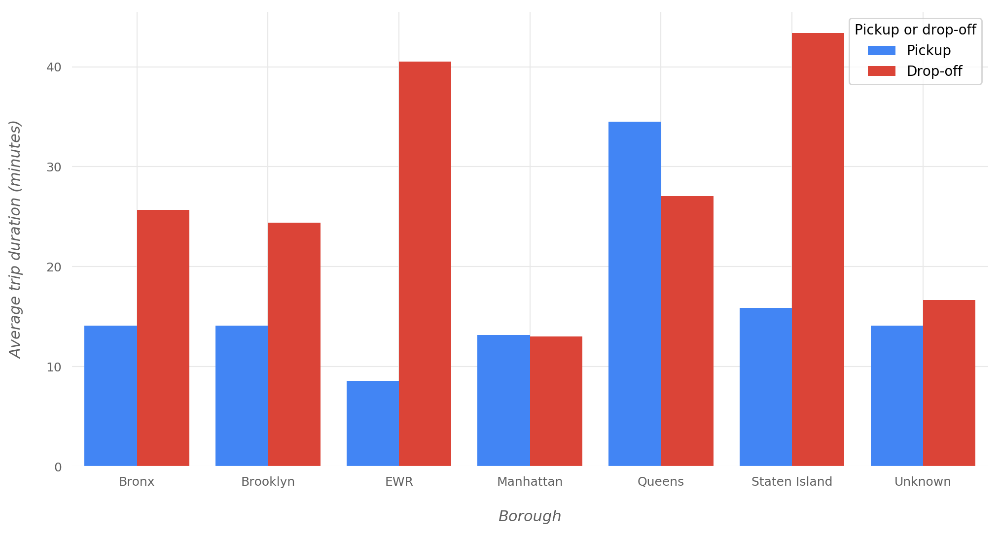

In [176]:
b_vc = data.groupby(data.pickup_borough).trip_duration.mean()
bp_vc = pd.DataFrame({'avg_trip_duration': b_vc.values}, index=b_vc.index)
bp_vc['Pickup or drop-off'] = 'Pickup'

b_vc = data.groupby(data.dropoff_borough).trip_duration.mean()
bd_vc = pd.DataFrame({'avg_trip_duration': b_vc.values}, index=b_vc.index)
bd_vc['Pickup or drop-off'] = 'Drop-off'

borough_vc = pd.concat([bp_vc, bd_vc])

fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.barplot(x=borough_vc.index, y=borough_vc.avg_trip_duration, hue=borough_vc['Pickup or drop-off'],
            palette=sns.color_palette([pc[0], pc[1]]), saturation=1)
plot_conf(ax, xlbl='Borough', ylbl='Average trip duration (minutes)', t='')
# ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}durbortr.png'.format(rep_files_p), dpi=300)

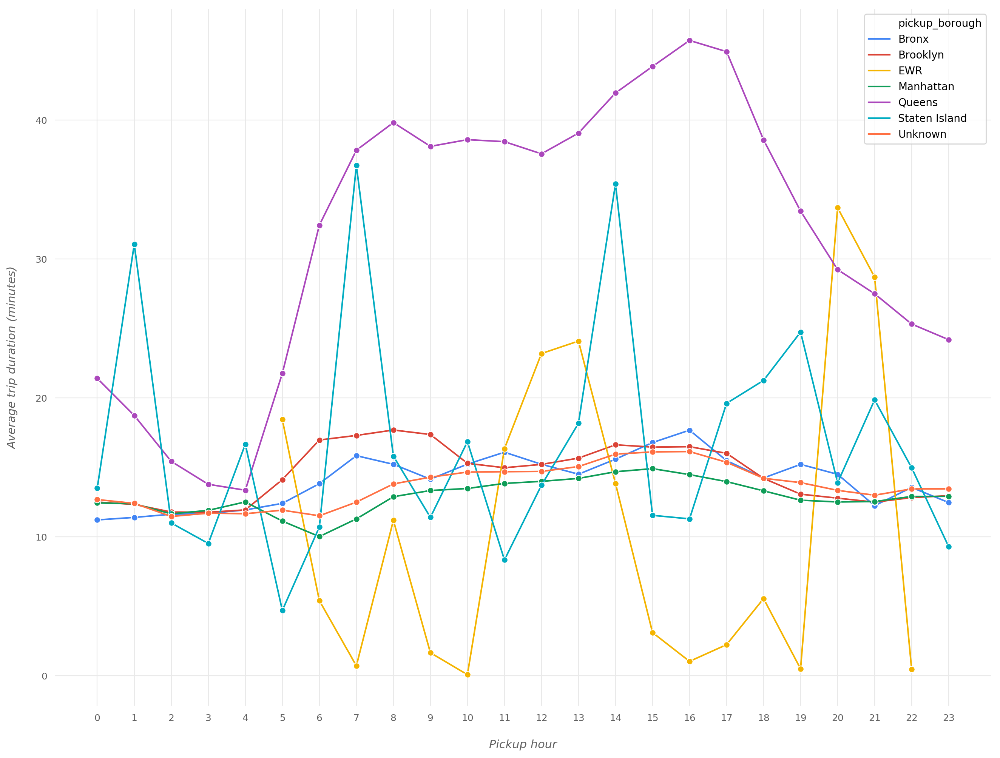

In [177]:
avg_dur_hour = data.groupby([data.pickup_borough, data.tpep_pickup_datetime.dt.hour]).trip_duration.mean()
fig, ax = plt.subplots(figsize=(16,12), facecolor=fig_fc)
sns.lineplot(x=avg_dur_hour.index.get_level_values(level='tpep_pickup_datetime'), y=avg_dur_hour.values, 
             hue=avg_dur_hour.index.get_level_values(level='pickup_borough'), 
             marker='.', ms=12, lw=1.5, sort=False, palette=sns.color_palette([pc[x] for x in range(7)]))
plot_conf(ax, xlbl='Pickup hour', ylbl='Average trip duration (minutes)', t='')
plt.xticks(range(0, 24), range(0,24))
fig.savefig('{}durhourbrptr.png'.format(rep_files_p), dpi=300)

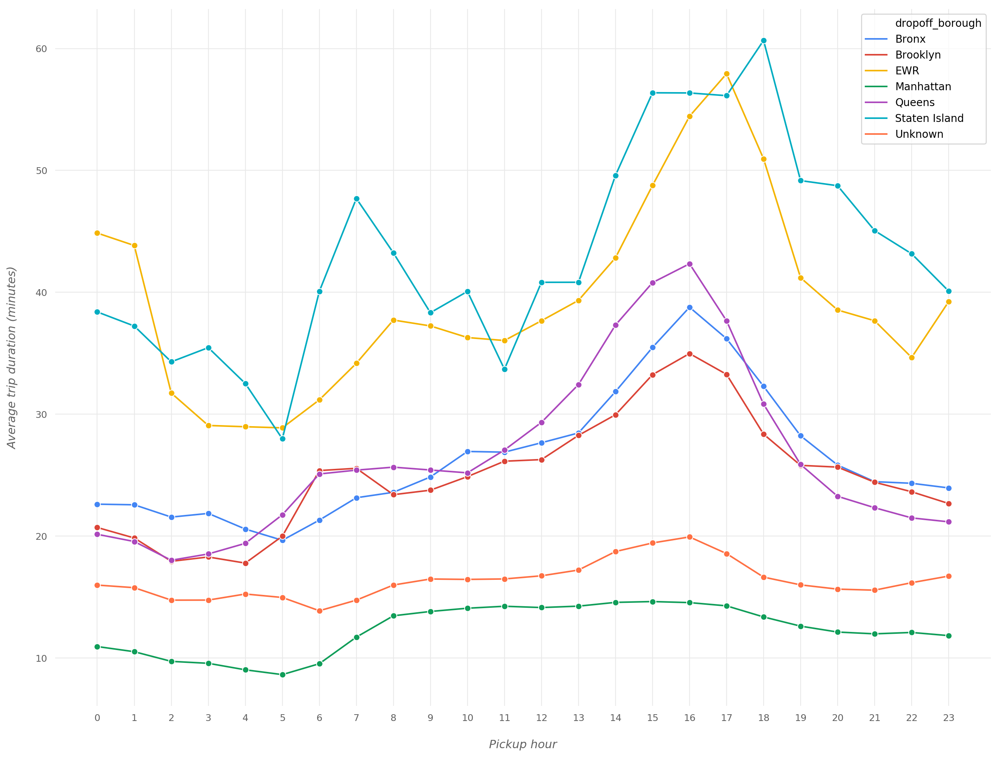

In [178]:
avg_dur_hour = data.groupby([data.dropoff_borough, data.tpep_pickup_datetime.dt.hour]).trip_duration.mean()
fig, ax = plt.subplots(figsize=(16,12), facecolor=fig_fc)
sns.lineplot(x=avg_dur_hour.index.get_level_values(level='tpep_pickup_datetime'), y=avg_dur_hour.values, 
             hue=avg_dur_hour.index.get_level_values(level='dropoff_borough'), 
             marker='.', ms=12, lw=1.5, sort=False, palette=sns.color_palette([pc[x] for x in range(7)]))
plot_conf(ax, xlbl='Pickup hour', ylbl='Average trip duration (minutes)', t='')
plt.xticks(range(0, 24), range(0,24))
fig.savefig('{}durhourbrdtr.png'.format(rep_files_p), dpi=300)

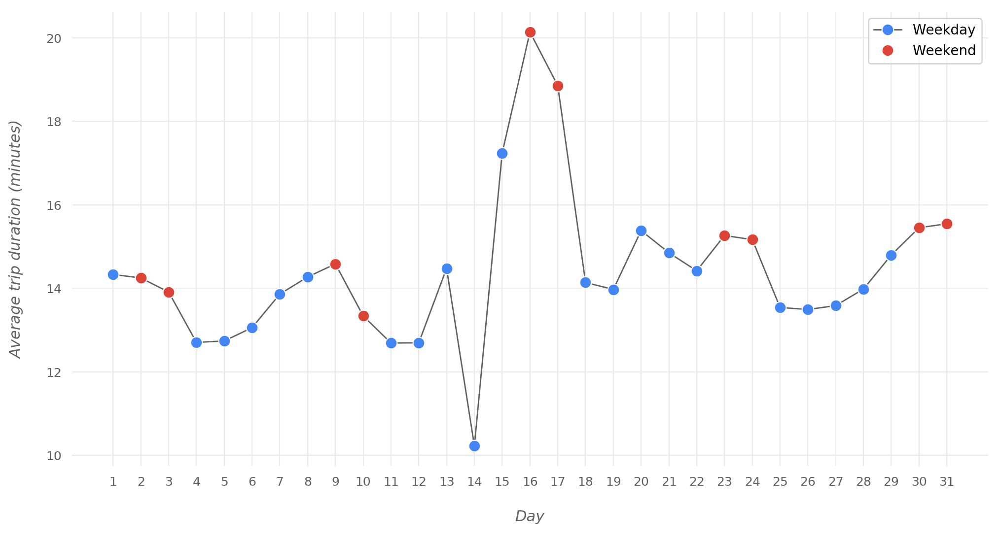

In [179]:
avg_dur_day = data.groupby(data.tpep_pickup_datetime.dt.day).trip_duration.mean()
day_of_week = [pd.to_datetime("2019-03-{:02}".format(x), format='%Y-%m-%d').day_name() for x in avg_dur_day.index]
day_of_week = ['Weekday' if x not in ('Saturday', 'Sunday') else 'Weekend' for x in day_of_week]
day_of_week = np.array(day_of_week)
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.lineplot(x=avg_dur_day.index, y=avg_dur_day.values, color='#616161', 
             marker='.', ms=17, lw=1, mfc=pc[0], label='Weekday')
sns.lineplot(x=avg_dur_day[day_of_week == 'Weekend'].index, y=avg_dur_day[day_of_week == 'Weekend'].values, 
             color=pc[1], marker='.', ms=17, lw=0, label='Weekend')
plot_conf(ax, xlbl='Day', ylbl='Average trip duration (minutes)', t='')
plt.xticks(range(1, 32), range(1,32))
fig.savefig('{}durdaytr.png'.format(rep_files_p), dpi=300)

In [180]:
# # not included
# dur_day_df = pd.DataFrame({'day': data.tpep_pickup_datetime.dt.day, 'trip_duration': data.trip_duration})
# dur_day_df.day = dur_day_df.day.replace([x for x in range(1, 7)], '1st fifth')
# dur_day_df.day = dur_day_df.day.replace([x for x in range(7, 13)], '2nd fifth')
# dur_day_df.day = dur_day_df.day.replace([x for x in range(13, 19)], '3rd fifth')
# dur_day_df.day = dur_day_df.day.replace([x for x in range(19, 25)], '4th fifth')
# dur_day_df.day = dur_day_df.day.replace([x for x in range(25, 32)], '5th fifth')
# avg_dur_day = dur_day_df.groupby('day').trip_duration.mean()
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.barplot(x=avg_dur_day.index, y=avg_dur_day.values, color=pc[0])
# plot_conf(ax, xlbl='Part of the month', ylbl='Average trip duration (minutes)', t='')
# # plt.xticks(range(0, 24), range(0,24))
# fig.savefig('{}durmpartstr.png'.format(rep_files_p), dpi=300)

In [181]:
# # not included
# avg_dur_day = data.groupby([data.pickup_borough, data.tpep_pickup_datetime.dt.day]).trip_duration.mean()
# fig, ax = plt.subplots(figsize=(16,12), facecolor=fig_fc)
# sns.lineplot(x=avg_dur_day.index.get_level_values(level='tpep_pickup_datetime'), y=avg_dur_day.values, 
#              hue=avg_dur_day.index.get_level_values(level='pickup_borough'), 
#              marker='.', ms=12, lw=1.5, sort=False, palette=sns.color_palette([pc[x] for x in range(7)]))
# plot_conf(ax, xlbl='Day', ylbl='Average trip duration (minutes)', t='')
# # plt.xticks(range(0, 24), range(0,24))
# fig.savefig('{}durdaybrptr.png'.format(rep_files_p), dpi=300)

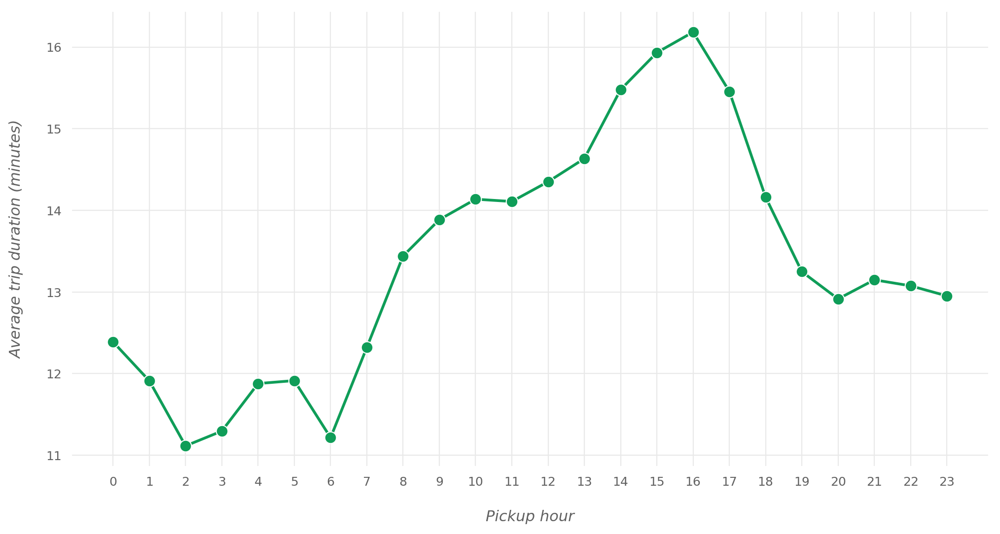

In [182]:
avg_dur_hour = test_data.groupby(test_data.tpep_pickup_datetime.dt.hour).trip_duration.mean()
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.lineplot(x=avg_dur_hour.index, y=avg_dur_hour.values, color=pc[3], 
             marker='.', ms=17, lw=2)
plot_conf(ax, xlbl='Pickup hour', ylbl='Average trip duration (minutes)', t='')
plt.xticks(range(0, 24), range(0,24))
fig.savefig('{}durhourts.png'.format(rep_files_p), dpi=300)

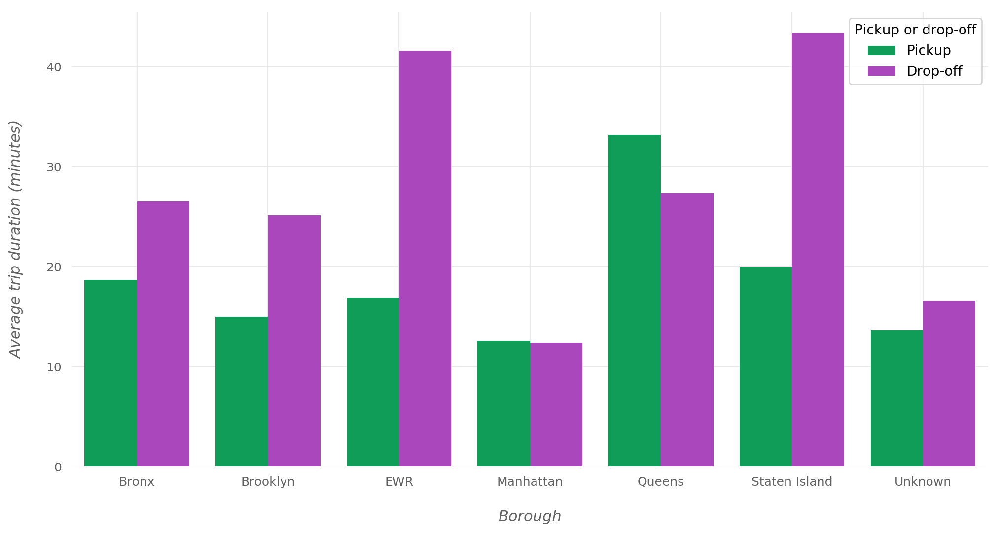

In [183]:
b_vc = test_data.groupby(test_data.pickup_borough).trip_duration.mean()
bp_vc = pd.DataFrame({'avg_trip_duration': b_vc.values}, index=b_vc.index)
bp_vc['Pickup or drop-off'] = 'Pickup'

b_vc = test_data.groupby(test_data.dropoff_borough).trip_duration.mean()
bd_vc = pd.DataFrame({'avg_trip_duration': b_vc.values}, index=b_vc.index)
bd_vc['Pickup or drop-off'] = 'Drop-off'

borough_vc = pd.concat([bp_vc, bd_vc])

fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.barplot(x=borough_vc.index, y=borough_vc.avg_trip_duration, hue=borough_vc['Pickup or drop-off'],
            palette=sns.color_palette([pc[3], pc[4]]), saturation=1)
plot_conf(ax, xlbl='Borough', ylbl='Average trip duration (minutes)', t='')
# ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
fig.savefig('{}durborts.png'.format(rep_files_p), dpi=300)

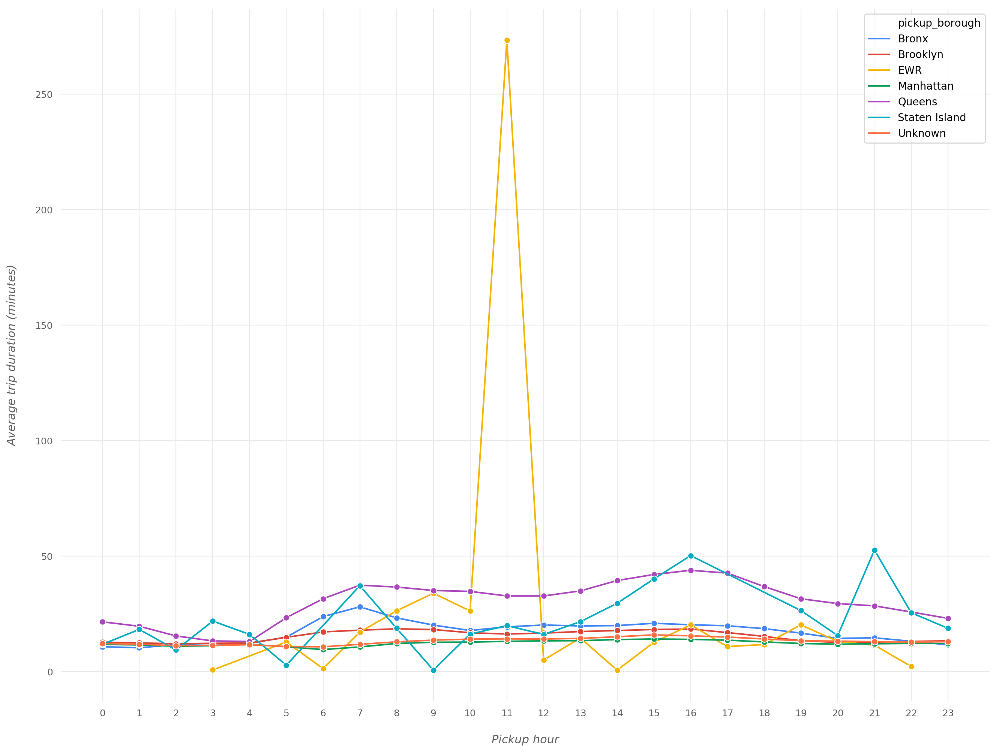

In [184]:
avg_dur_hour = test_data.groupby([test_data.pickup_borough, 
                                  test_data.tpep_pickup_datetime.dt.hour]).trip_duration.mean()
fig, ax = plt.subplots(figsize=(16,12), facecolor=fig_fc)
sns.lineplot(x=avg_dur_hour.index.get_level_values(level='tpep_pickup_datetime'), y=avg_dur_hour.values, 
             hue=avg_dur_hour.index.get_level_values(level='pickup_borough'), 
             marker='.', ms=12, lw=1.5, sort=False, palette=sns.color_palette([pc[x] for x in range(7)]))
plot_conf(ax, xlbl='Pickup hour', ylbl='Average trip duration (minutes)', t='')
plt.xticks(range(0, 24), range(0,24))
fig.savefig('{}durhourbrpts.png'.format(rep_files_p), dpi=300)

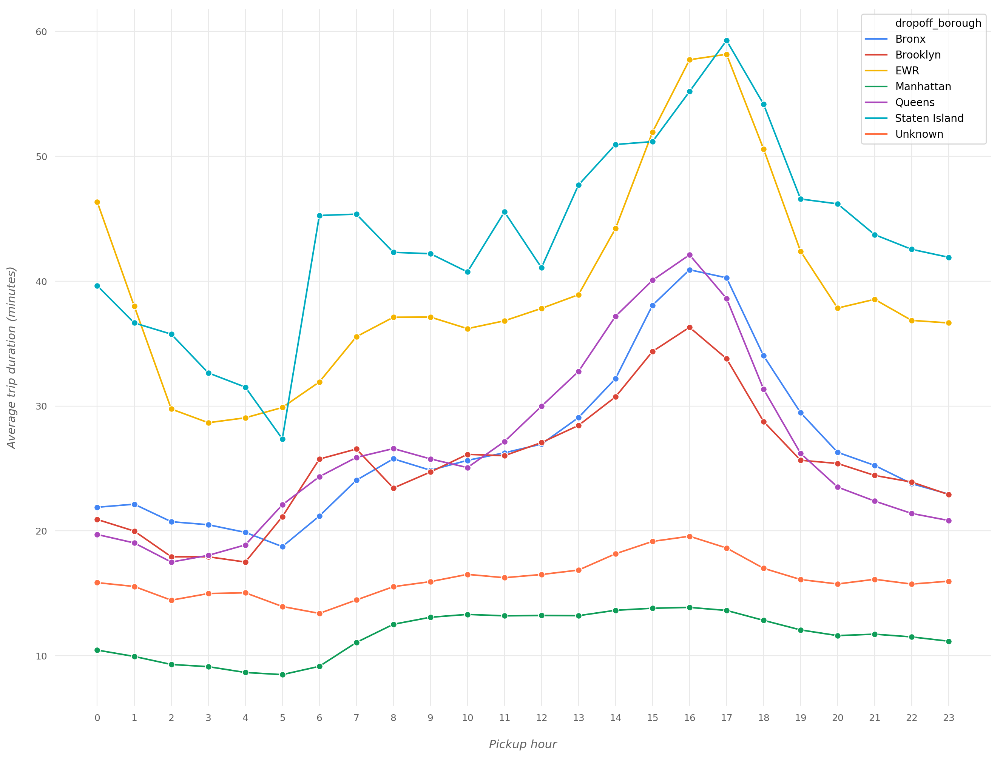

In [185]:
avg_dur_hour = test_data.groupby([test_data.dropoff_borough, 
                                  test_data.tpep_pickup_datetime.dt.hour]).trip_duration.mean()
fig, ax = plt.subplots(figsize=(16,12), facecolor=fig_fc)
sns.lineplot(x=avg_dur_hour.index.get_level_values(level='tpep_pickup_datetime'), y=avg_dur_hour.values, 
             hue=avg_dur_hour.index.get_level_values(level='dropoff_borough'), 
             marker='.', ms=12, lw=1.5, sort=False, palette=sns.color_palette([pc[x] for x in range(7)]))
plot_conf(ax, xlbl='Pickup hour', ylbl='Average trip duration (minutes)', t='')
plt.xticks(range(0, 24), range(0,24))
fig.savefig('{}durhourbrdts.png'.format(rep_files_p), dpi=300)

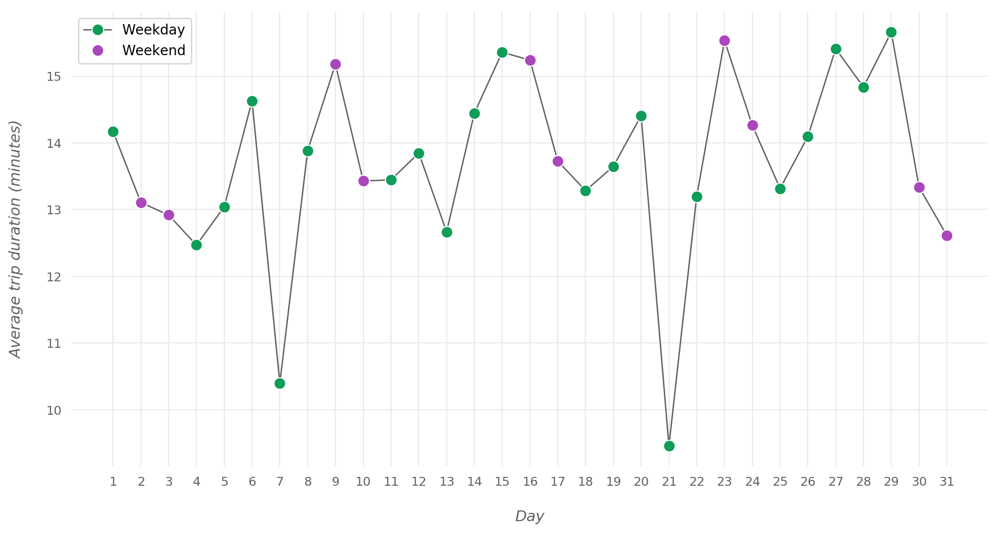

In [186]:
avg_dur_day = test_data.groupby(test_data.tpep_pickup_datetime.dt.day).trip_duration.mean()
day_of_week = [pd.to_datetime("2019-03-{:02}".format(x), format='%Y-%m-%d').day_name() for x in avg_dur_day.index]
day_of_week = ['Weekday' if x not in ('Saturday', 'Sunday') else 'Weekend' for x in day_of_week]
day_of_week = np.array(day_of_week)
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.lineplot(x=avg_dur_day.index, y=avg_dur_day.values, color='#616161', 
             marker='.', ms=17, lw=1, mfc=pc[3], label='Weekday')
sns.lineplot(x=avg_dur_day[day_of_week == 'Weekend'].index, y=avg_dur_day[day_of_week == 'Weekend'].values, 
             color=pc[4], marker='.', ms=17, lw=0, label='Weekend')
plot_conf(ax, xlbl='Day', ylbl='Average trip duration (minutes)', t='')
plt.xticks(range(1, 32), range(1,32))
fig.savefig('{}durdayts.png'.format(rep_files_p), dpi=300)

In [187]:
# # not included
# avg_dur_day = test_data.groupby([test_data.pickup_borough, 
#                                  test_data.tpep_pickup_datetime.dt.day]).trip_duration.mean()
# fig, ax = plt.subplots(figsize=(16,12), facecolor=fig_fc)
# sns.lineplot(x=avg_dur_day.index.get_level_values(level='tpep_pickup_datetime'), y=avg_dur_day.values, 
#              hue=avg_dur_day.index.get_level_values(level='pickup_borough'), 
#              marker='.', ms=12, lw=1.5, sort=False, palette=sns.color_palette([pc[x] for x in range(7,14)]))
# plot_conf(ax, xlbl='Day', ylbl='Average trip duration (minutes)', t='')
# # plt.xticks(range(0, 24), range(0,24))
# fig.savefig('{}durdaybrpts.png'.format(rep_files_p), dpi=300)

In [188]:
avg_dur_day_tr = data.groupby(data.tpep_pickup_datetime.dt.day).trip_duration.mean()
avg_dur_day_ts = test_data.groupby(test_data.tpep_pickup_datetime.dt.day).trip_duration.mean()
np.corrcoef(avg_dur_day_tr.values, avg_dur_day_ts.values)[0][1]

0.1792492173439462

In [189]:
# # not included
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.scatterplot(x=data.trip_distance, y=data.trip_duration, hue=data.pickup_borough, 
#                 alpha=0.6, palette=sns.color_palette([pc[x] for x in range(7)]), edgecolors='#282828');
# plot_conf(ax, xlbl='Trip distance (km)', ylbl='Trip duration (minutes)', t='')
# fig.savefig('{}distdurbortr.png'.format(rep_files_p), dpi=300)

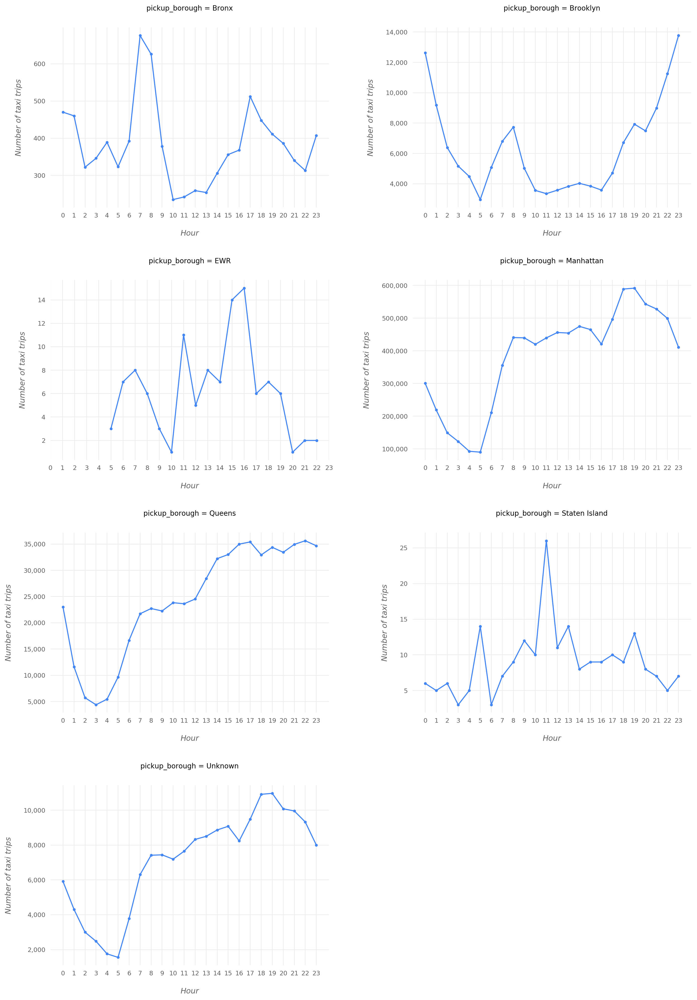

In [190]:
data_grouped_bor = data.groupby('pickup_borough')['tpep_pickup_datetime']
data_grouped_bor_dict = defaultdict(list)
for i, (name, group) in enumerate(data_grouped_bor):
    group = group.dt.hour.value_counts(sort=False, ascending=False).sort_index()
    data_grouped_bor_dict['pickup_borough'].extend([name] * group.shape[0])
    data_grouped_bor_dict['hour'].extend(list(group.index.values))
    data_grouped_bor_dict['num_of_trips'].extend(list(group.values))
data_grouped_bor_df = pd.DataFrame(data_grouped_bor_dict)
g = sns.FacetGrid(data_grouped_bor_df, col="pickup_borough", col_wrap=2, height=5, aspect=1.4, 
                  sharey=False, sharex=False)
g = g.map(plt.plot, "hour", "num_of_trips", marker=".", color=pc[0])
for ax in g.axes:
    plot_conf(ax, xlbl='Hour', ylbl='Number of taxi trips', t='')
    ax.set_xticks(range(0, 24))
    ax.set_xticklabels(range(0, 24))
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
plt.tight_layout()
plt.subplots_adjust(hspace=0.4, wspace=0.3)
plt.savefig('{}borpicktimestr.png'.format(rep_files_p), dpi=300)

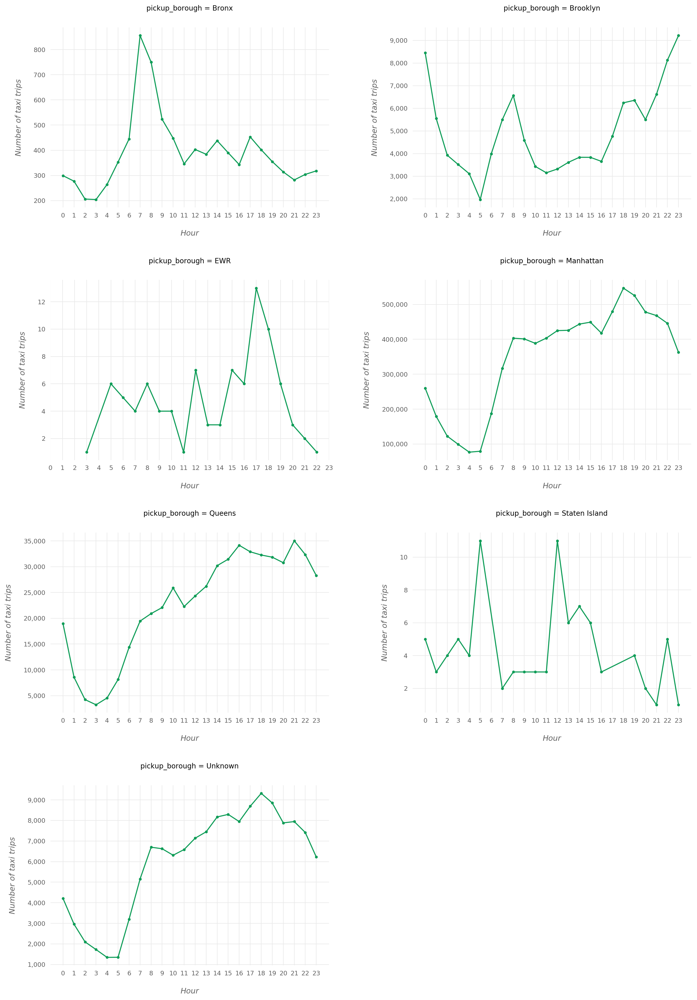

In [191]:
data_grouped_bor = test_data.groupby('pickup_borough')['tpep_pickup_datetime']
data_grouped_bor_dict = defaultdict(list)
for i, (name, group) in enumerate(data_grouped_bor):
    group = group.dt.hour.value_counts(sort=False, ascending=False).sort_index()
    data_grouped_bor_dict['pickup_borough'].extend([name] * group.shape[0])
    data_grouped_bor_dict['hour'].extend(list(group.index.values))
    data_grouped_bor_dict['num_of_trips'].extend(list(group.values))
data_grouped_bor_df = pd.DataFrame(data_grouped_bor_dict)
g = sns.FacetGrid(data_grouped_bor_df, col="pickup_borough", col_wrap=2, height=5, aspect=1.4, 
                  sharey=False, sharex=False)
g = g.map(plt.plot, "hour", "num_of_trips", marker=".", color=pc[3])
for ax in g.axes:
    plot_conf(ax, xlbl='Hour', ylbl='Number of taxi trips', t='')
    ax.set_xticks(range(0, 24))
    ax.set_xticklabels(range(0, 24))
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(int(x))));
plt.tight_layout()
plt.subplots_adjust(hspace=0.4, wspace=0.3)
plt.savefig('{}borpicktimests.png'.format(rep_files_p), dpi=300)

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


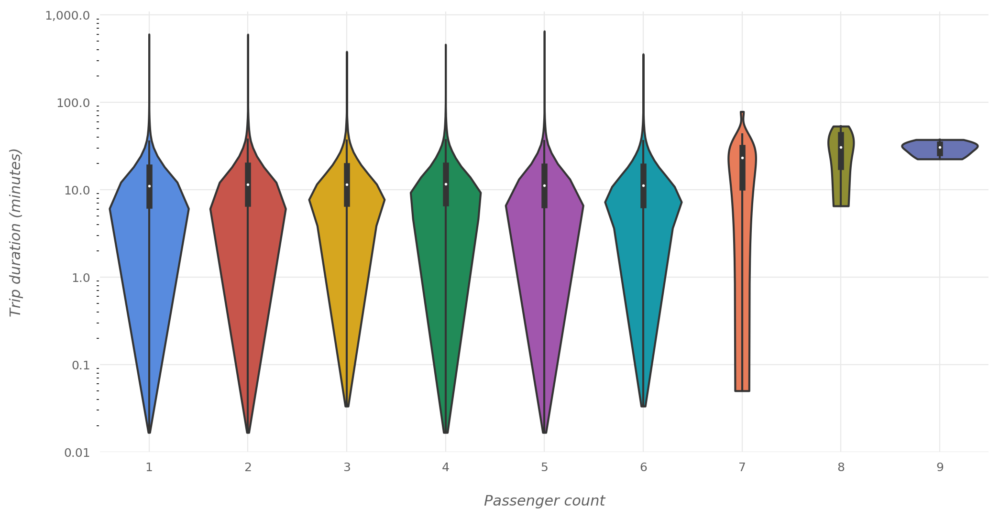

In [192]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.violinplot(x=data.passenger_count, y=data.trip_duration, cut=0, 
               palette=sns.color_palette([pc[x] for x in range(9)]))
plot_conf(ax, xlbl='Passenger count', ylbl='Trip duration (minutes)', t='')
plt.yscale('log')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
fig.savefig('{}passdurtr.png'.format(rep_files_p), dpi=300)

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


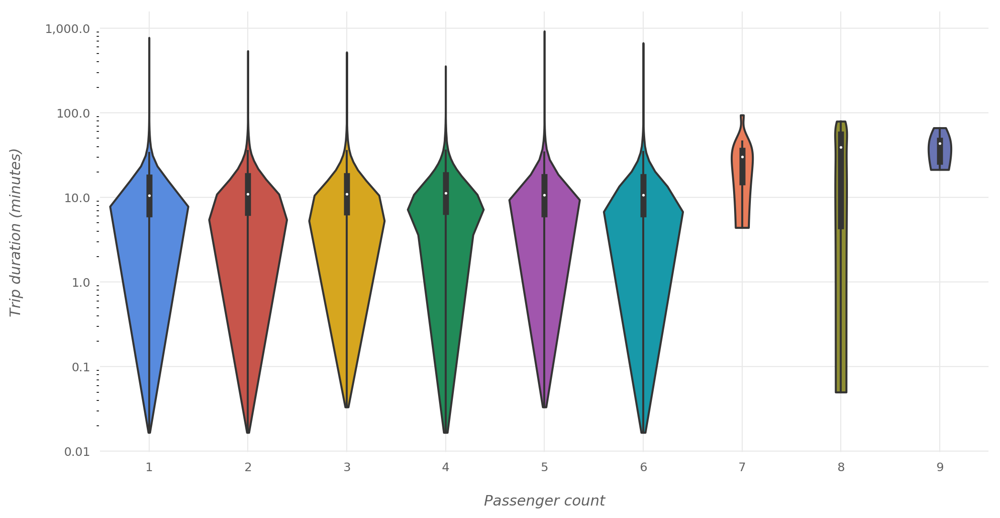

In [193]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.violinplot(x=test_data.passenger_count, y=test_data.trip_duration, cut=0, 
               palette=sns.color_palette([pc[x] for x in range(9)]))
plot_conf(ax, xlbl='Passenger count', ylbl='Trip duration (minutes)', t='')
plt.yscale('log')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
fig.savefig('{}passdurts.png'.format(rep_files_p), dpi=300)

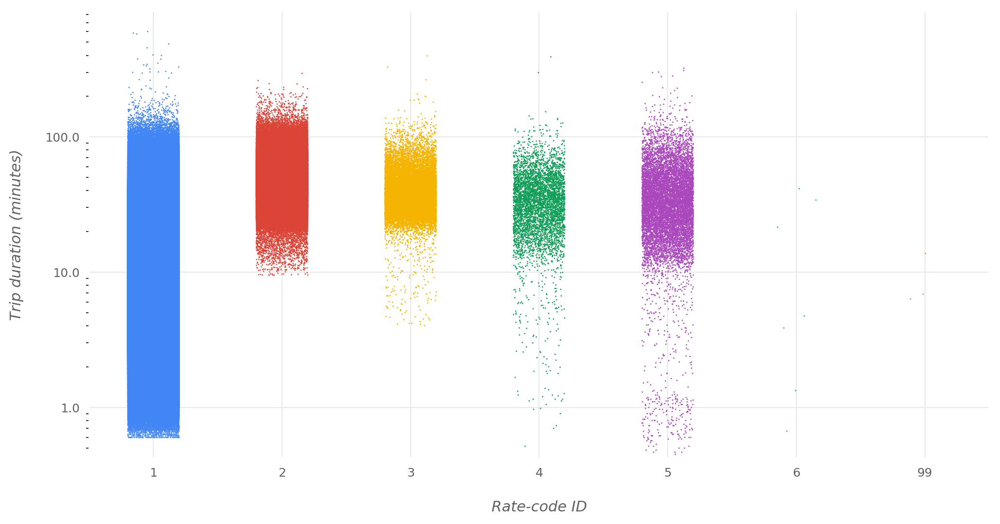

In [371]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.stripplot(x=data.RatecodeID, y=data.trip_duration, jitter=0.2, size=1,
               palette=sns.color_palette([pc[x] for x in range(9)]))
plot_conf(ax, xlbl='Rate-code ID', ylbl='Trip duration (minutes)', t='')
plt.yscale('log')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
fig.savefig('{}ratecodedurtr.png'.format(rep_files_p), dpi=300)

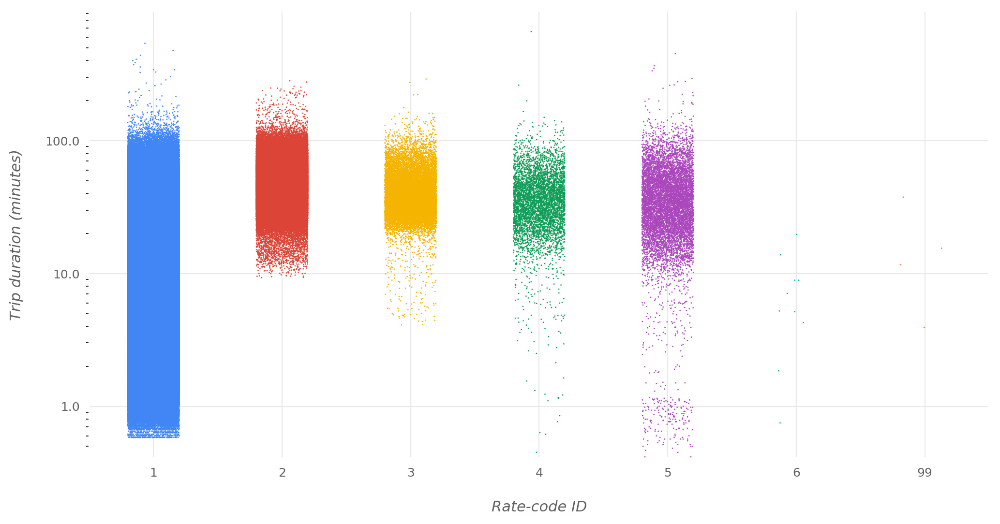

In [370]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.stripplot(x=test_data.RatecodeID, y=test_data.trip_duration, jitter=0.2, size=1,
               palette=sns.color_palette([pc[x] for x in range(9)]))
plot_conf(ax, xlbl='Rate-code ID', ylbl='Trip duration (minutes)', t='')
plt.yscale('log')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
fig.savefig('{}ratecodedurts.png'.format(rep_files_p), dpi=300)

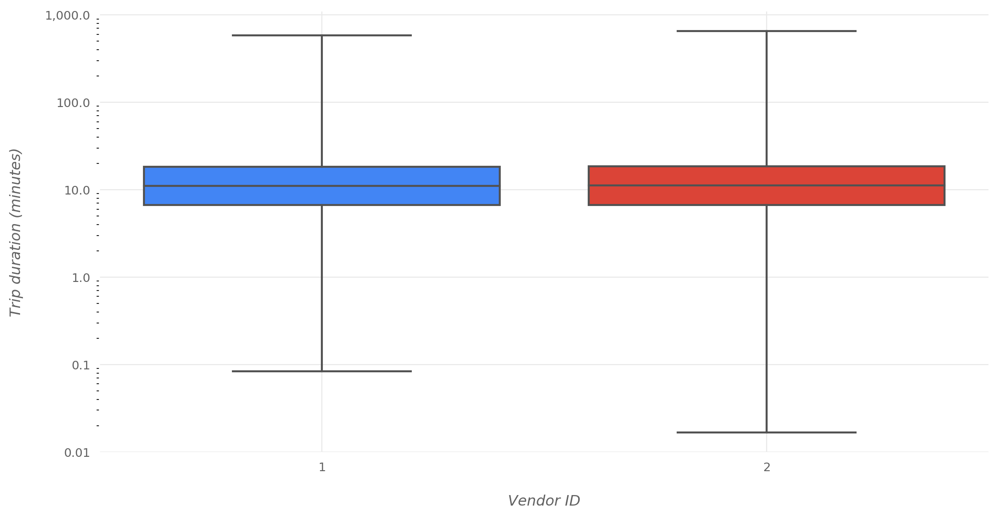

In [196]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.boxplot(x=data.VendorID, y=data.trip_duration, whis=np.Inf, saturation=1,
            palette=sns.color_palette([pc[x] for x in range(2)]))
plot_conf(ax, xlbl='Vendor ID', ylbl='Trip duration (minutes)', t='')
plt.yscale('log')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
fig.savefig('{}vendurtr.png'.format(rep_files_p), dpi=300)

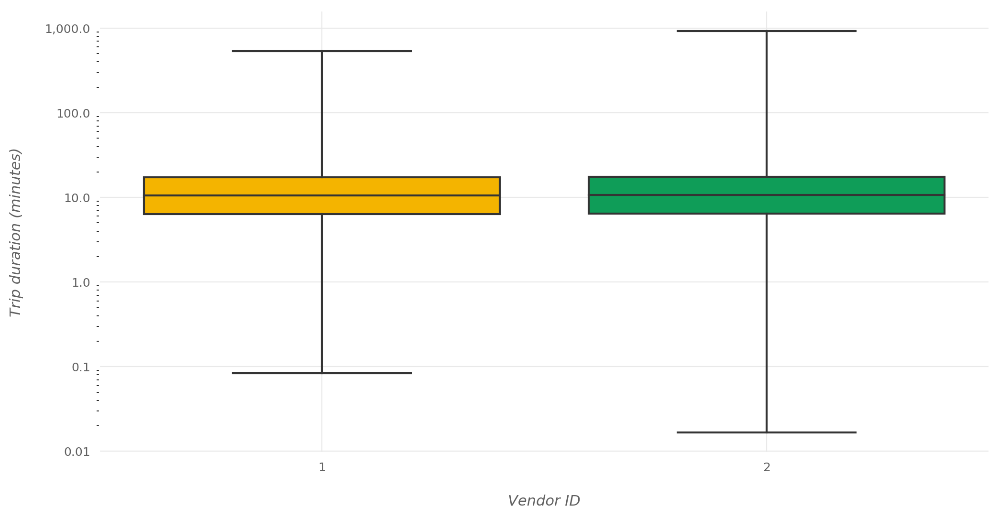

In [197]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.boxplot(x=test_data.VendorID, y=test_data.trip_duration, whis=np.Inf, saturation=1,
            palette=sns.color_palette([pc[x] for x in range(2,4)]))
plot_conf(ax, xlbl='Vendor ID', ylbl='Trip duration (minutes)', t='')
plt.yscale('log')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
fig.savefig('{}vendurts.png'.format(rep_files_p), dpi=300)

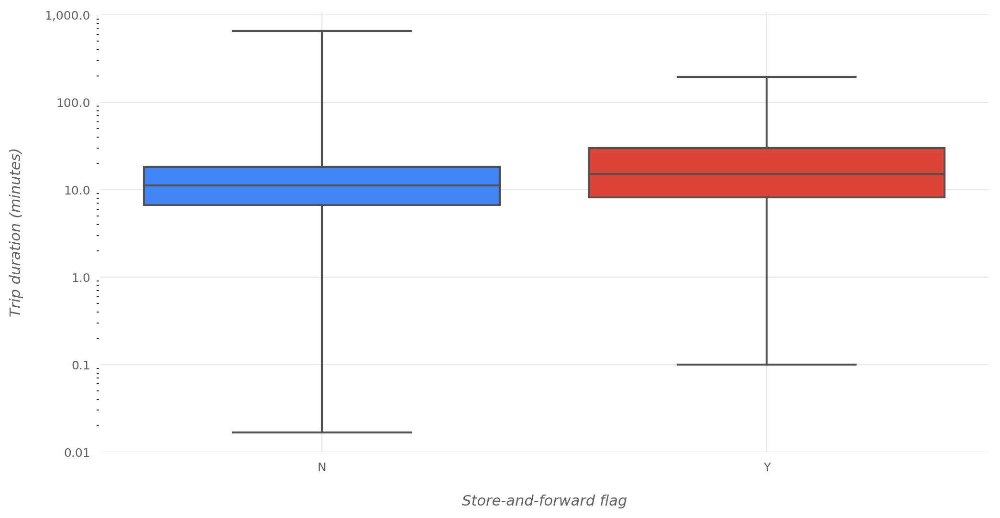

In [198]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.boxplot(x=data.store_and_fwd_flag, y=data.trip_duration, whis=np.Inf, saturation=1,
            palette=sns.color_palette([pc[x] for x in range(2)]))
plot_conf(ax, xlbl='Store-and-forward flag', ylbl='Trip duration (minutes)', t='')
plt.yscale('log')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
fig.savefig('{}snfdurtr.png'.format(rep_files_p), dpi=300)

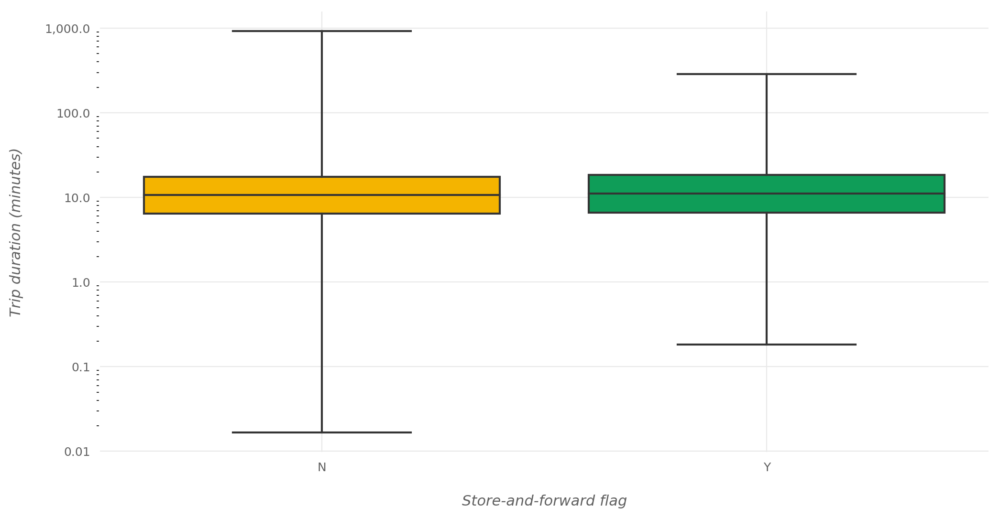

In [199]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.boxplot(x=test_data.store_and_fwd_flag, y=test_data.trip_duration, whis=np.Inf, saturation=1,
            palette=sns.color_palette([pc[x] for x in range(2,4)]))
plot_conf(ax, xlbl='Store-and-forward flag', ylbl='Trip duration (minutes)', t='')
plt.yscale('log')
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
fig.savefig('{}snfdurts.png'.format(rep_files_p), dpi=300)

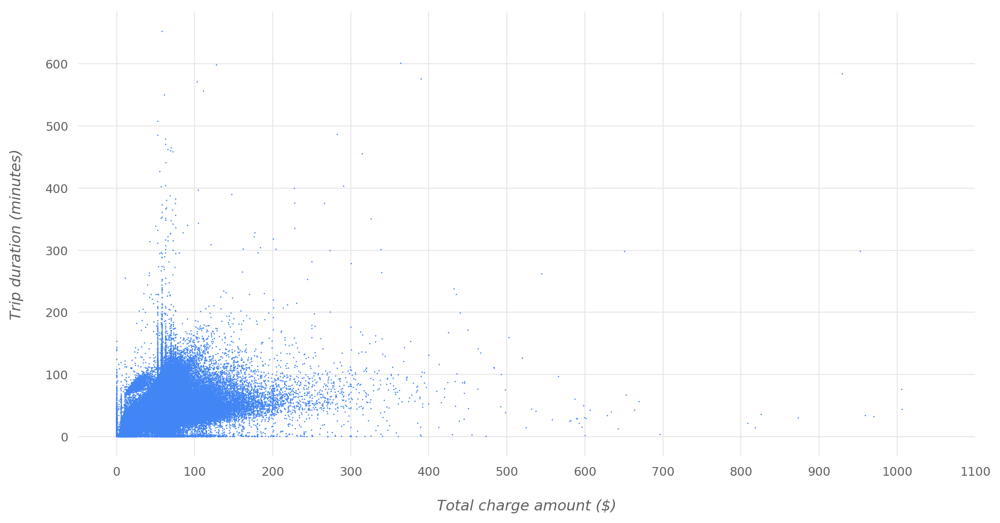

In [241]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.scatterplot(x=data.total_amount, y=data.trip_duration, color=pc[0], s=1, linewidth=0, edgecolor='none')
plot_conf(ax, xlbl='Total charge amount ($)', ylbl='Trip duration (minutes)', t='')
plt.xticks(range(0, int(data.total_amount.max())+100, 100), range(0, int(data.total_amount.max())+100, 100));
fig.savefig('{}mondurtr.png'.format(rep_files_p), dpi=300)

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


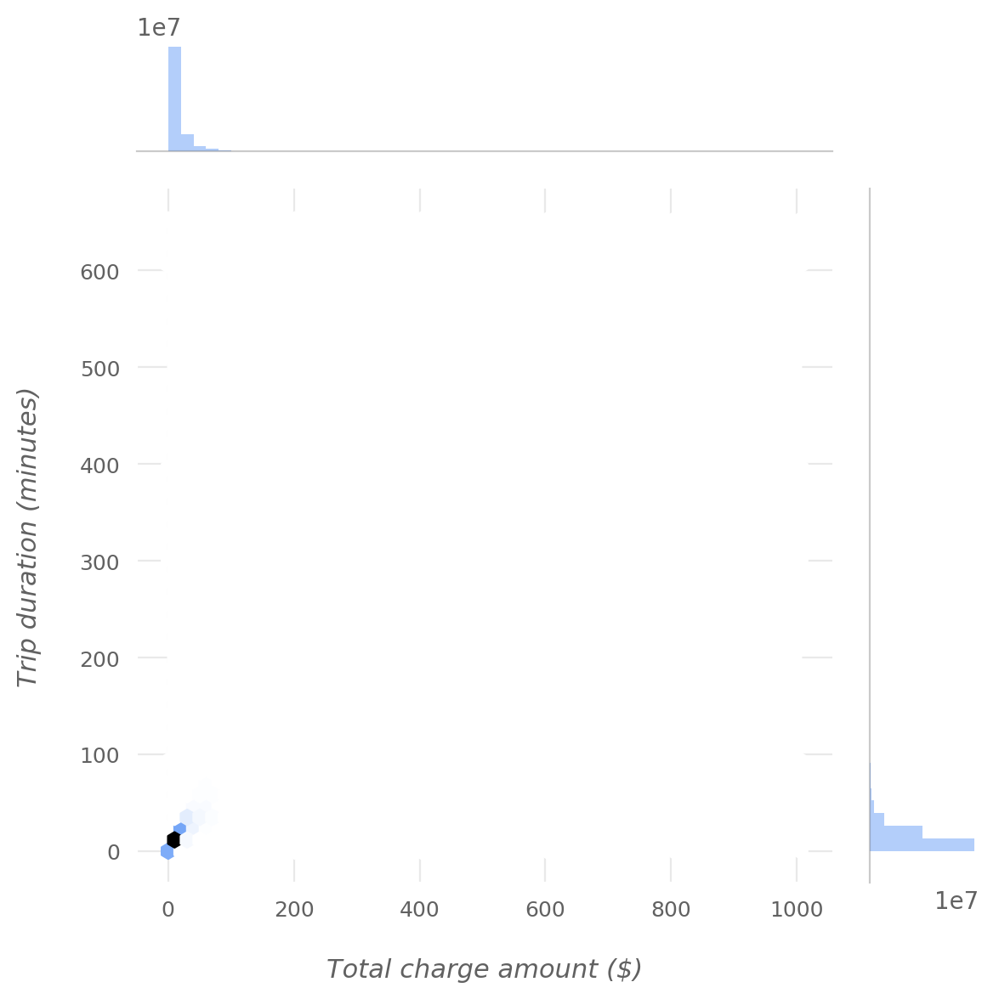

In [201]:
# # not included
# didu_j = sns.jointplot(x=data.total_amount, y=data.trip_duration, kind="hex", color=pc[0]);
# plot_conf(didu_j.ax_joint, xlbl='Total charge amount ($)', ylbl='Trip duration (minutes)', t='')
# plot_conf(didu_j.ax_marg_x, xlbl='', ylbl='', t='')
# plot_conf(didu_j.ax_marg_y, xlbl='', ylbl='', t='')
# didu_j.ax_marg_x.grid(False)
# didu_j.ax_marg_x.spines['bottom'].set_color('#61616155')
# didu_j.ax_marg_y.grid(False)
# didu_j.ax_marg_y.spines['bottom'].set_color('#616161')
# didu_j.ax_marg_y.spines['left'].set_color('#61616155')
# plt.tight_layout()
# plt.savefig('{}mondurhxtr.png'.format(rep_files_p), dpi=300)

In [323]:
charge_by_min_tr = data.total_amount / data.trip_duration

In [324]:
charge_by_min_mad_tr = np.median(np.abs(charge_by_min_tr - np.median(charge_by_min_tr))) 
charge_by_min_mad_tr

0.2227741003389957

In [325]:
lower_limit_tr = np.median(charge_by_min_tr) - 4 * charge_by_min_mad_tr
upper_limit_tr = np.median(charge_by_min_tr) + 20 * charge_by_min_mad_tr
lower_limit_tr, upper_limit_tr

(0.24758973003087847, 5.594168138166775)

In [326]:
"{:,}".format(data[(charge_by_min_tr < lower_limit_tr) | (charge_by_min_tr > upper_limit_tr)].shape[0])

'21,413'

In [327]:
data.shape

(10126642, 23)

In [328]:
data = data[(charge_by_min_tr > lower_limit_tr) & (charge_by_min_tr < upper_limit_tr)]

In [329]:
data.shape

(10105229, 23)

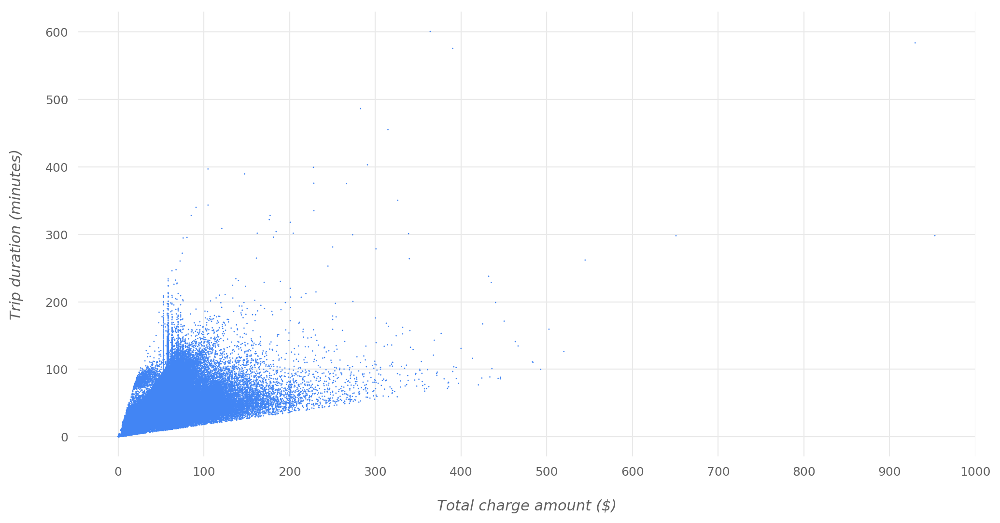

In [337]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.scatterplot(x=data.total_amount, y=data.trip_duration, color=pc[0], s=1, linewidth=0, edgecolor='none')
plot_conf(ax, xlbl='Total charge amount ($)', ylbl='Trip duration (minutes)', t='')
plt.xticks(range(0, int(data.total_amount.max())+100, 100), range(0, int(data.total_amount.max())+100, 100));
fig.savefig('{}monduraftertr.png'.format(rep_files_p), dpi=300)

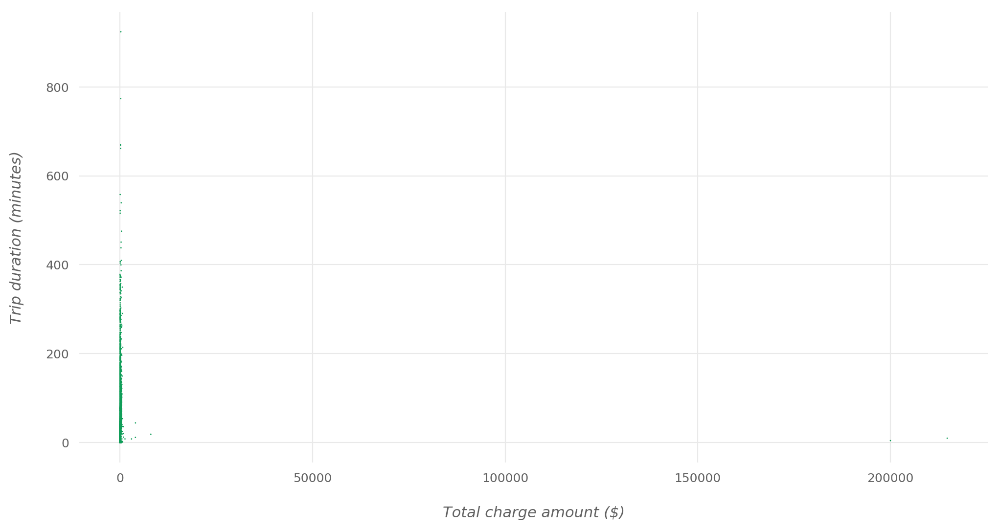

In [202]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.scatterplot(x=test_data.total_amount, y=test_data.trip_duration, color=pc[3], s=1, linewidth=0, edgecolor='none')
plot_conf(ax, xlbl='Total charge amount ($)', ylbl='Trip duration (minutes)', t='')
plt.xticks(range(0, int(data.total_amount.max())+100, 100), range(0, int(data.total_amount.max())+100, 100));
fig.savefig('{}mondurts.png'.format(rep_files_p), dpi=300)

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


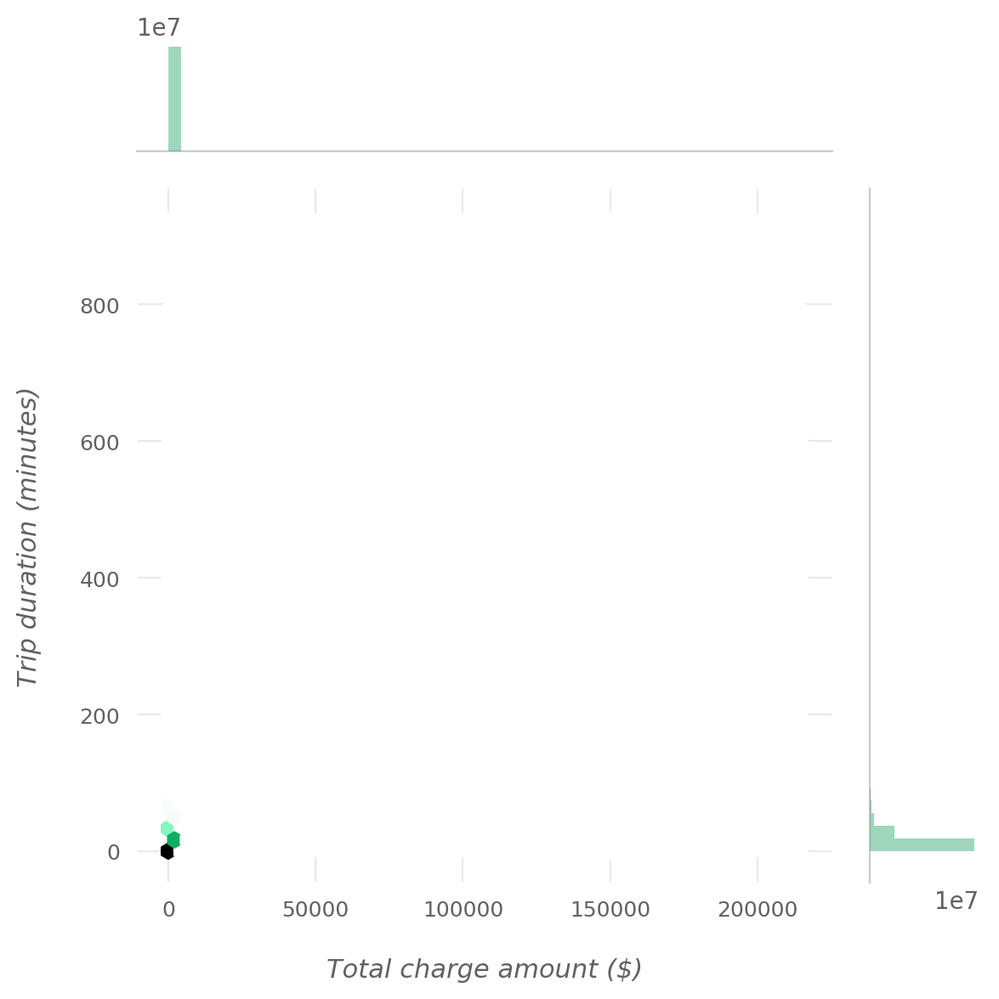

In [203]:
# # not included 
# didu_j = sns.jointplot(x=test_data.total_amount, y=test_data.trip_duration, kind="hex", color=pc[3]);
# plot_conf(didu_j.ax_joint, xlbl='Total charge amount ($)', ylbl='Trip duration (minutes)', t='')
# plot_conf(didu_j.ax_marg_x, xlbl='', ylbl='', t='')
# plot_conf(didu_j.ax_marg_y, xlbl='', ylbl='', t='')
# didu_j.ax_marg_x.grid(False)
# didu_j.ax_marg_x.spines['bottom'].set_color('#61616155')
# didu_j.ax_marg_y.grid(False)
# didu_j.ax_marg_y.spines['bottom'].set_color('#616161')
# didu_j.ax_marg_y.spines['left'].set_color('#61616155')
# plt.tight_layout()
# plt.savefig('{}mondurhxts.png'.format(rep_files_p), dpi=300)

In [330]:
charge_by_min_ts = test_data.total_amount / test_data.trip_duration

In [331]:
charge_by_min_mad_ts = np.median(np.abs(charge_by_min_ts - np.median(charge_by_min_ts))) 
charge_by_min_mad_ts

0.22666863178580188

In [332]:
lower_limit_ts = np.median(charge_by_min_ts) - 4 * charge_by_min_mad_ts
upper_limit_ts = np.median(charge_by_min_ts) + 20 * charge_by_min_mad_ts
lower_limit_ts, upper_limit_ts

(0.25784721198722726, 5.697894374846473)

In [333]:
"{:,}".format(test_data[(charge_by_min_ts < lower_limit_ts) | (charge_by_min_ts > upper_limit_ts)].shape[0])

'19,994'

In [334]:
test_data.shape

(9199661, 23)

In [335]:
test_data = test_data[(charge_by_min_ts > lower_limit_ts) & (charge_by_min_ts < upper_limit_ts)]

In [336]:
test_data.shape

(9179667, 23)

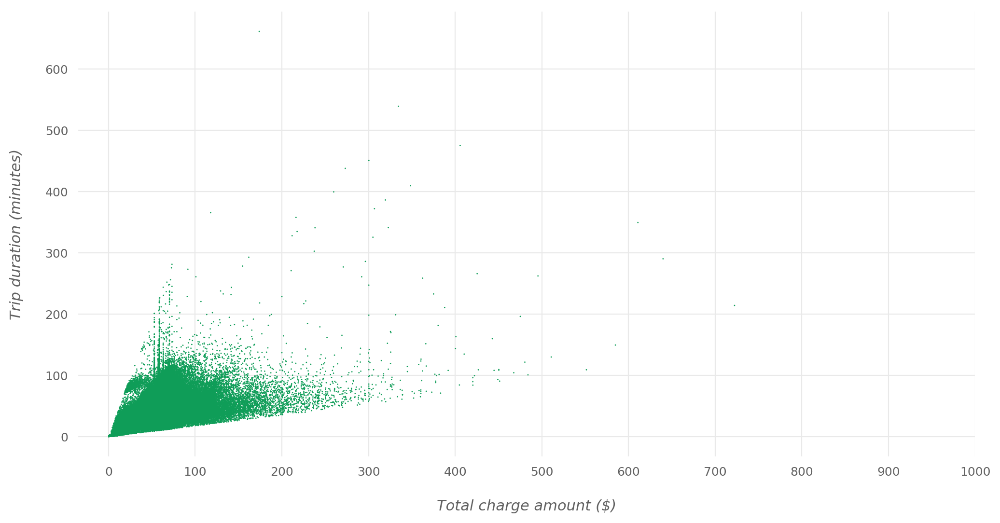

In [338]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.scatterplot(x=test_data.total_amount, y=test_data.trip_duration, color=pc[3], s=1, linewidth=0, edgecolor='none')
plot_conf(ax, xlbl='Total charge amount ($)', ylbl='Trip duration (minutes)', t='')
plt.xticks(range(0, int(data.total_amount.max())+100, 100), range(0, int(data.total_amount.max())+100, 100));
fig.savefig('{}mondurafterts.png'.format(rep_files_p), dpi=300)

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


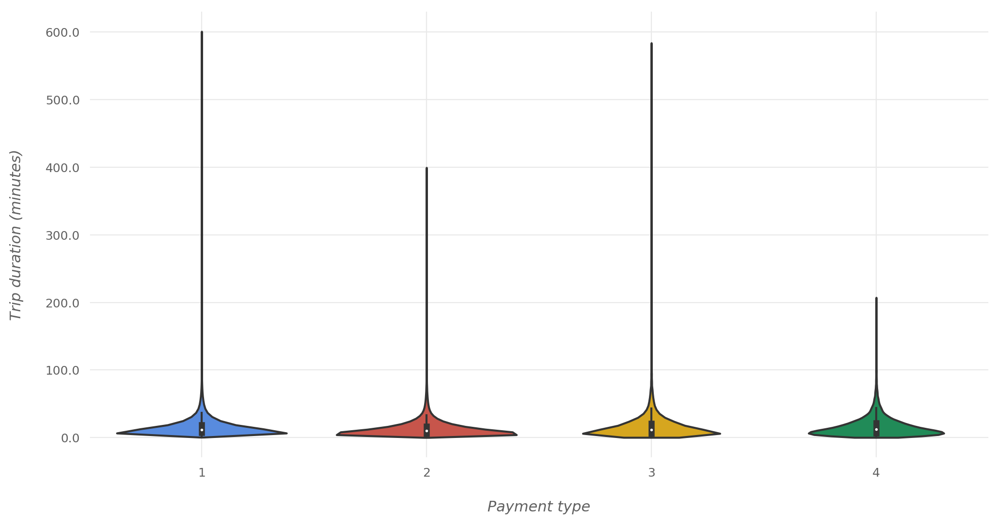

In [339]:
# # not included
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.violinplot(x=data.payment_type, y=data.trip_duration, cut=0, 
#                palette=sns.color_palette([pc[x] for x in range(9)]))
# plot_conf(ax, xlbl='Payment type', ylbl='Trip duration (minutes)', t='')
# # plt.yscale('log')
# ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
# fig.savefig('{}paytdurtr.png'.format(rep_files_p), dpi=300)

/usr/local/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


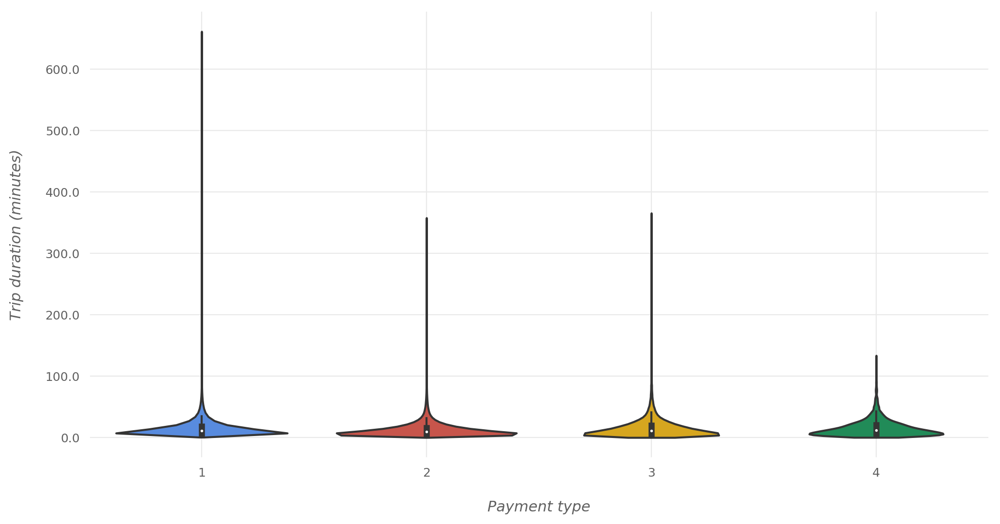

In [340]:
# # not included
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.violinplot(x=test_data.payment_type, y=test_data.trip_duration, cut=0, 
#                palette=sns.color_palette([pc[x] for x in range(9)]))
# plot_conf(ax, xlbl='Payment type', ylbl='Trip duration (minutes)', t='')
# # plt.yscale('log')
# ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
# fig.savefig('{}paytdurts.png'.format(rep_files_p), dpi=300)

In [341]:
# # not included
# day_temp = {}
# for d, t in zip(weather_data.Date.dt.day, weather_data['Average Temperature']):
#     day_temp[d] = t
# data['average_day_temperature'] = data.tpep_pickup_datetime.dt.day.map(day_temp)

# day_temp = {}
# for d, t in zip(weather_test_data.Date.dt.day, weather_test_data['Average Temperature']):
#     day_temp[d] = t
# test_data['average_day_temperature'] = test_data.tpep_pickup_datetime.dt.day.map(day_temp)

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


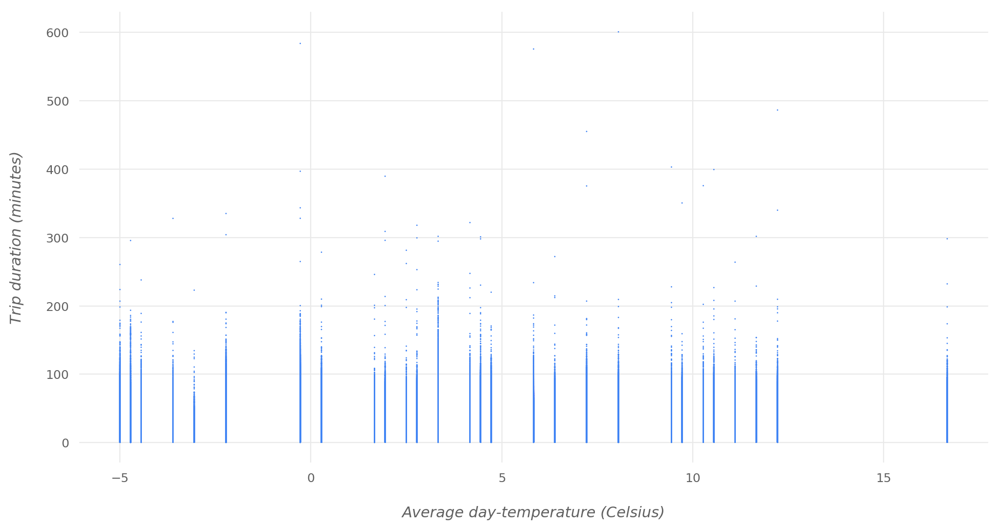

In [342]:
# # not included
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.scatterplot(x=data.average_day_temperature, y=data.trip_duration, 
#                 color=pc[0], s=1, linewidth=0, edgecolor='none')
# plot_conf(ax, xlbl='Average day-temperature (Celsius)', ylbl='Trip duration (minutes)', t='')
# fig.savefig('{}tempdurtr.png'.format(rep_files_p), dpi=300)

In [344]:
# # not included
# data.average_day_temperature.min(), data.average_day_temperature.max()

(-5.0, 16.666666666666668)

In [345]:
# # not included
# avg_daily_temp_tr = data.average_day_temperature.copy()
# avg_daily_temp_tr = pd.cut(avg_daily_temp_tr, [-5, 0, 5, 10, 17], include_lowest=True, 
#                           labels=['[-5 °C — 0 °C]', '(0 °C — 5 °C]', '(5 °C — 10 °C]', '(10 °C — 17 °C]'])

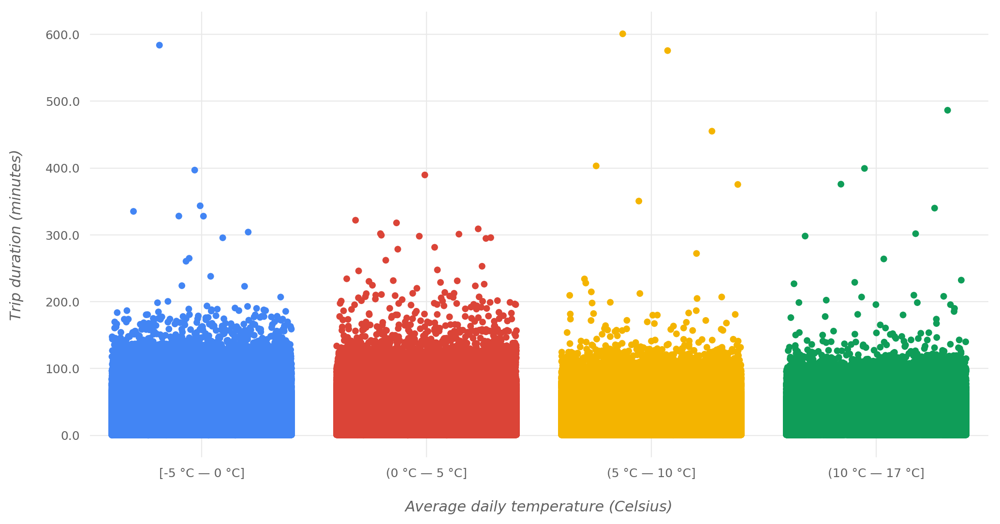

In [346]:
# # not included
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.stripplot(x=avg_daily_temp_tr, y=data.trip_duration, jitter=0.4,
#               palette=sns.color_palette([pc[x] for x in range(9)]))
# plot_conf(ax, xlbl='Average daily temperature (Celsius)', ylbl='Trip duration (minutes)', t='')
# # plt.yscale('log')
# ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
# fig.savefig('{}tempdur2tr.png'.format(rep_files_p), dpi=300)

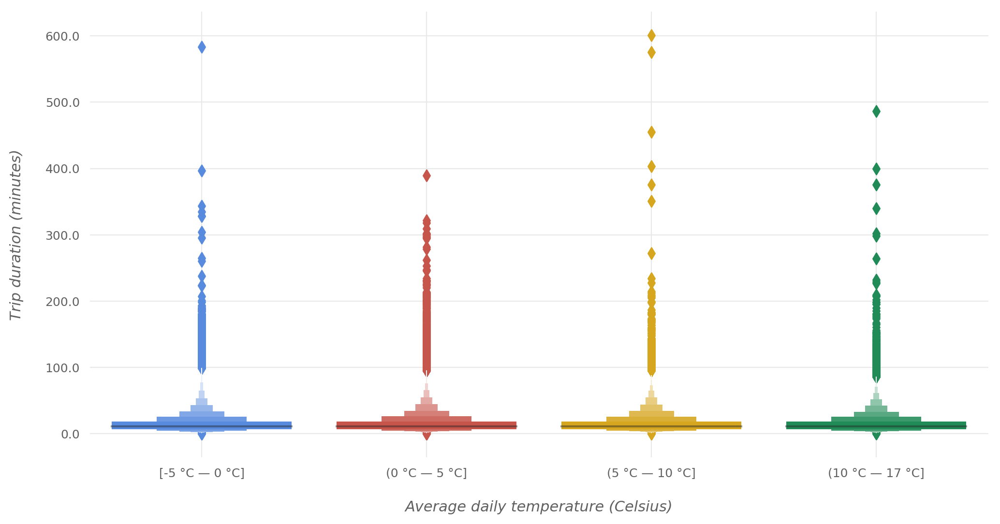

In [364]:
# # not included
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.boxenplot(x=avg_daily_temp_tr, y=data.trip_duration, outlier_prop=0,
#               palette=sns.color_palette([pc[x] for x in range(9)]))
# plot_conf(ax, xlbl='Average daily temperature (Celsius)', ylbl='Trip duration (minutes)', t='')
# # plt.yscale('log')
# ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
# fig.savefig('{}tempdur3tr.png'.format(rep_files_p), dpi=300)

In [347]:
# # not included
# test_data.average_day_temperature.min(), test_data.average_day_temperature.max()

(1.3888888888888888, 11.666666666666666)

In [348]:
# # not included
# avg_daily_temp_ts = test_data.average_day_temperature.copy()
# avg_daily_temp_ts = pd.cut(avg_daily_temp_ts, [1, 6, 12], include_lowest=True, 
#                            labels=['[1 °C — 6 °C]', '(6 °C — 12 °C]'])

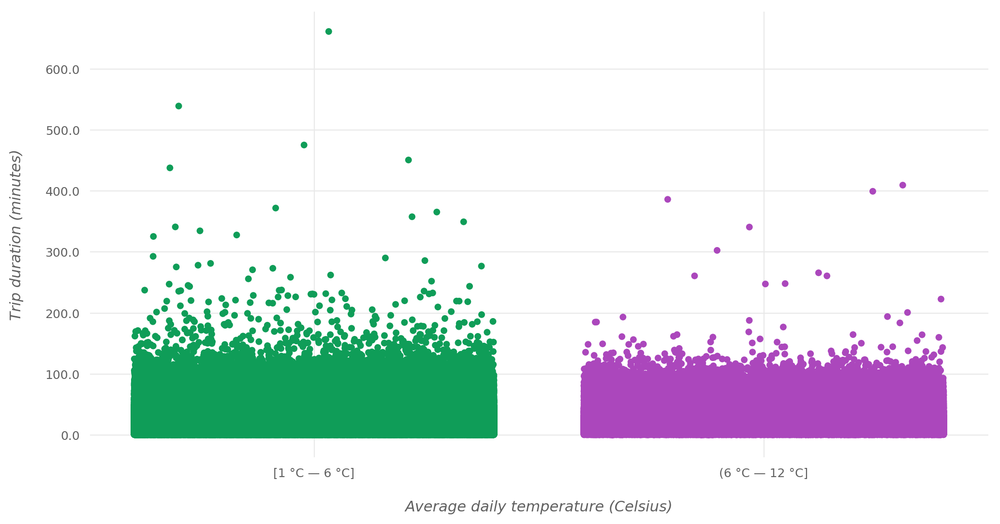

In [366]:
# # not included
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.stripplot(x=avg_daily_temp_ts, y=test_data.trip_duration, jitter=0.4,
#             palette=sns.color_palette([pc[x] for x in range(3,6)]))
# plot_conf(ax, xlbl='Average daily temperature (Celsius)', ylbl='Trip duration (minutes)', t='')
# # plt.yscale('log')
# ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
# fig.savefig('{}tempdur2ts.png'.format(rep_files_p), dpi=300)

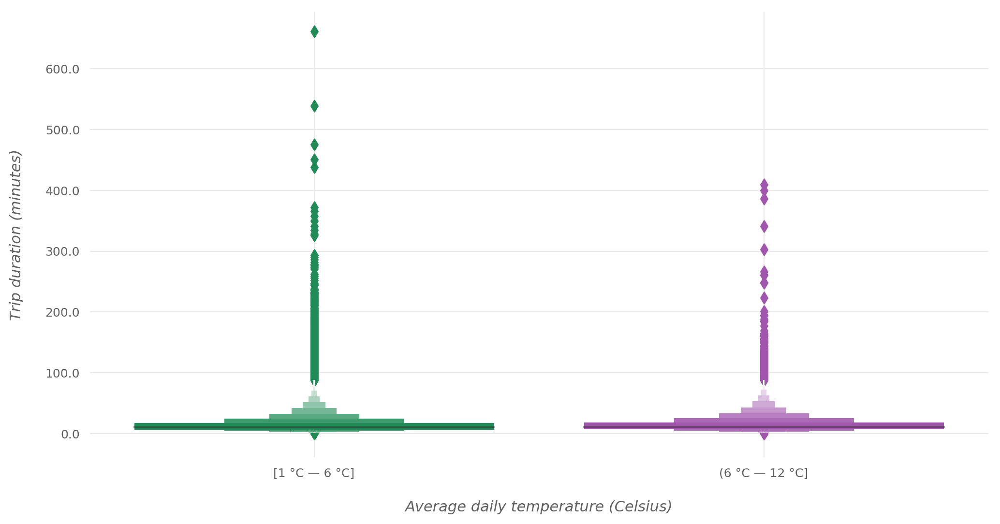

In [367]:
# # not included
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.boxenplot(x=avg_daily_temp_ts, y=test_data.trip_duration,
#               palette=sns.color_palette([pc[x] for x in range(3,6)]))
# plot_conf(ax, xlbl='Average daily temperature (Celsius)', ylbl='Trip duration (minutes)', t='')
# # plt.yscale('log')
# ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
# fig.savefig('{}tempdur3ts.png'.format(rep_files_p), dpi=300)

In [350]:
# # not included
# day_prec = {}
# for d, t in zip(weather_data.Date.dt.day, weather_data['Precipitation']):
#     day_prec[d] = t
# data['day_precipitation'] = data.tpep_pickup_datetime.dt.day.map(day_prec)

# day_prec = {}
# for d, t in zip(weather_test_data.Date.dt.day, weather_test_data['Precipitation']):
#     day_prec[d] = t
# test_data['day_precipitation'] = test_data.tpep_pickup_datetime.dt.day.map(day_temp)

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


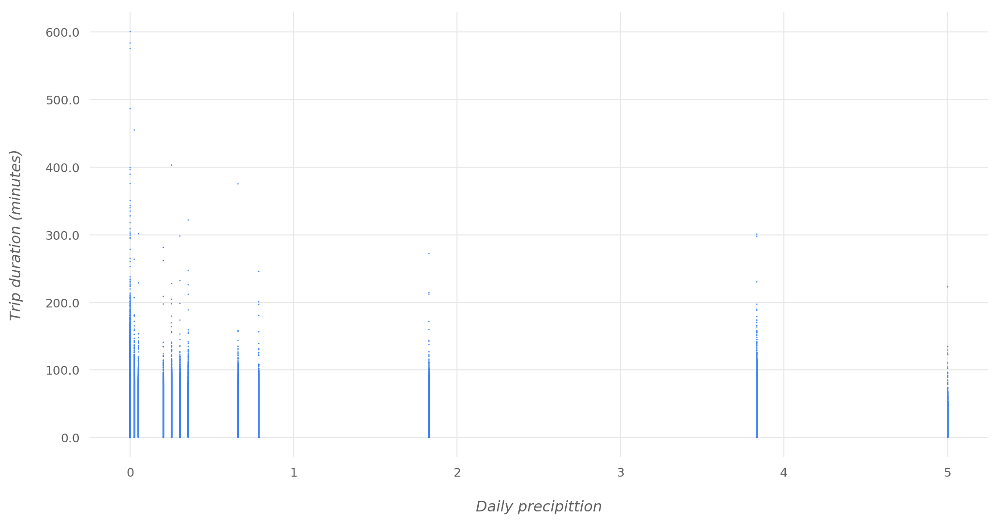

In [351]:
# # not included
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.scatterplot(x=data.day_precipitation, y=data.trip_duration, 
#                 color=pc[0], s=1, linewidth=0, edgecolor='none')
# plot_conf(ax, xlbl='Daily precipittion', ylbl='Trip duration (minutes)', t='')
# # plt.yscale('log')
# ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
# fig.savefig('{}precdurtr.png'.format(rep_files_p), dpi=300)

In [353]:
# # not included
# daily_prec_tr = data.day_precipitation.copy()
# daily_prec_tr = pd.cut(daily_prec_tr, [0, 2.5, 5.1], include_lowest=True, 
#                           labels=['[0 cm — 2.5 cm]', '(2.5 cm — 5 cm]'])

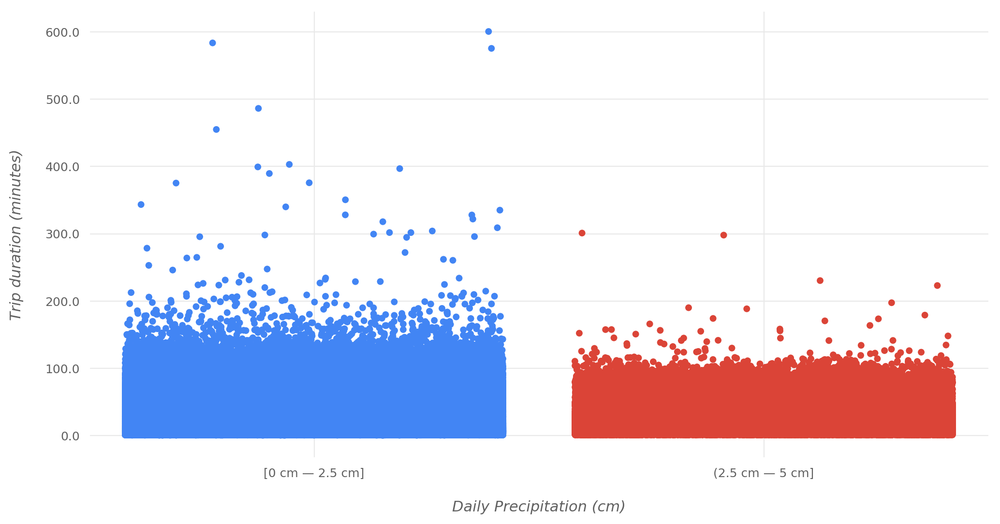

In [354]:
# # not included
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.stripplot(x=daily_prec_tr, y=data.trip_duration, jitter=0.42,
#               palette=sns.color_palette([pc[x] for x in range(9)]))
# plot_conf(ax, xlbl='Daily Precipitation (cm)', ylbl='Trip duration (minutes)', t='')
# # plt.yscale('log')
# ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
# fig.savefig('{}precdur2tr.png'.format(rep_files_p), dpi=300)

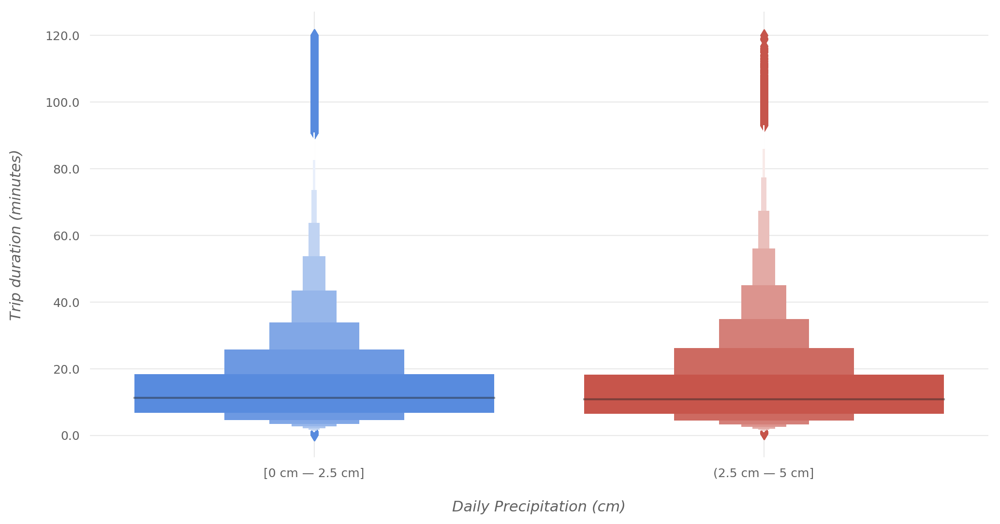

In [355]:
# # not included
# fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
# sns.boxenplot(x=daily_prec_tr[data.trip_duration < 120], y=data[data.trip_duration < 120].trip_duration,
#               palette=sns.color_palette([pc[x] for x in range(9)]))
# plot_conf(ax, xlbl='Daily Precipitation (cm)', ylbl='Trip duration (minutes)', t='')
# # plt.yscale('log')
# ax.yaxis.set_major_formatter(FuncFormatter(lambda x, loc: "{:,}".format(x)));
# # fig.savefig('{}precdur2tr.png'.format(rep_files_p), dpi=300)

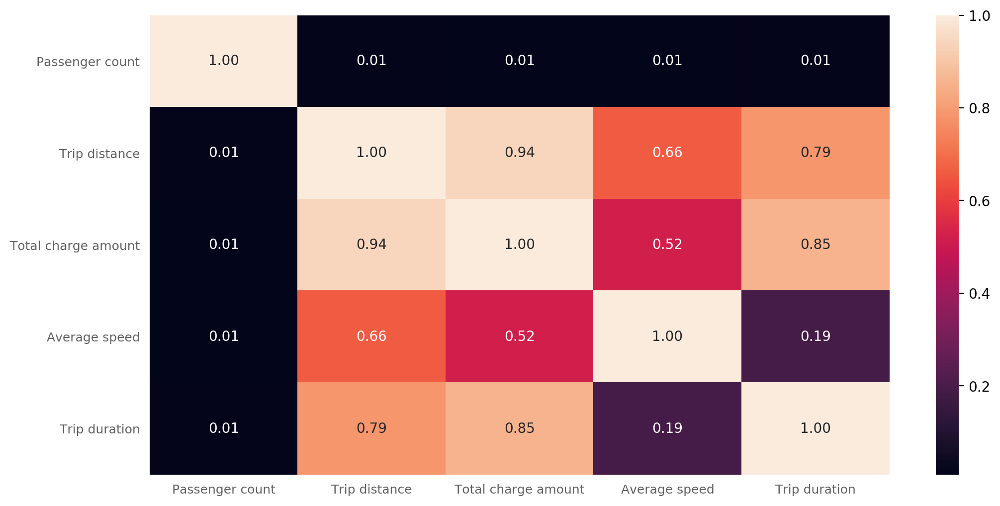

In [376]:
h_labels = ['Passenger count', 'Trip distance', 'Total charge amount', 'Average speed', 'Trip duration']
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.heatmap(data[['passenger_count', 'trip_distance', 'total_amount', 'speed (km/h)', 'trip_duration']].corr(), 
            annot=True, fmt='.2f', xticklabels=h_labels, yticklabels=h_labels)
plot_conf(ax, xlbl='', ylbl='', t='')
fig.savefig('{}corrtr.png'.format(rep_files_p), dpi=300)

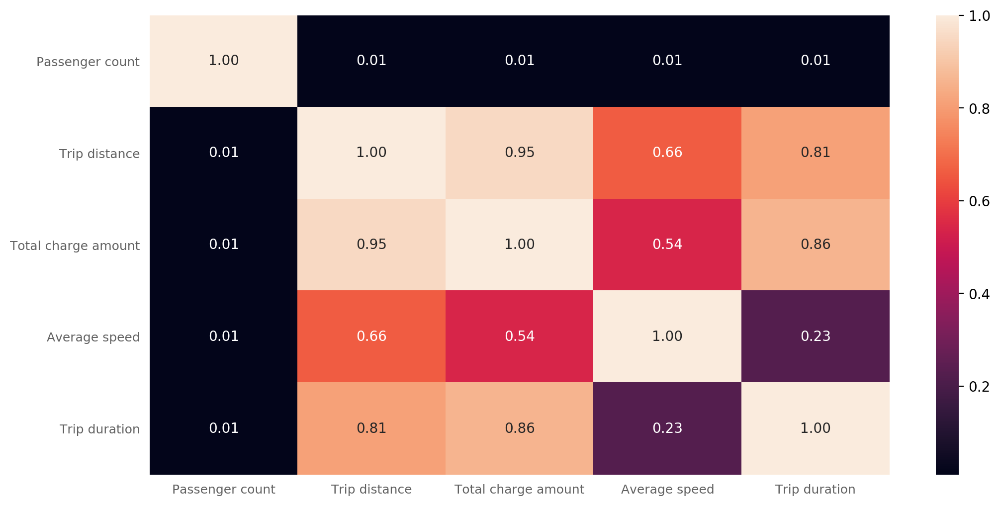

In [384]:
h_labels = ['Passenger count', 'Trip distance', 'Total charge amount', 'Average speed', 'Trip duration']
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.heatmap(test_data[['passenger_count', 'trip_distance', 'total_amount', 'speed (km/h)', 'trip_duration']].corr(), 
            annot=True, fmt='.2f', xticklabels=h_labels, yticklabels=h_labels)
plot_conf(ax, xlbl='', ylbl='', t='')
fig.savefig('{}corrts.png'.format(rep_files_p), dpi=300)

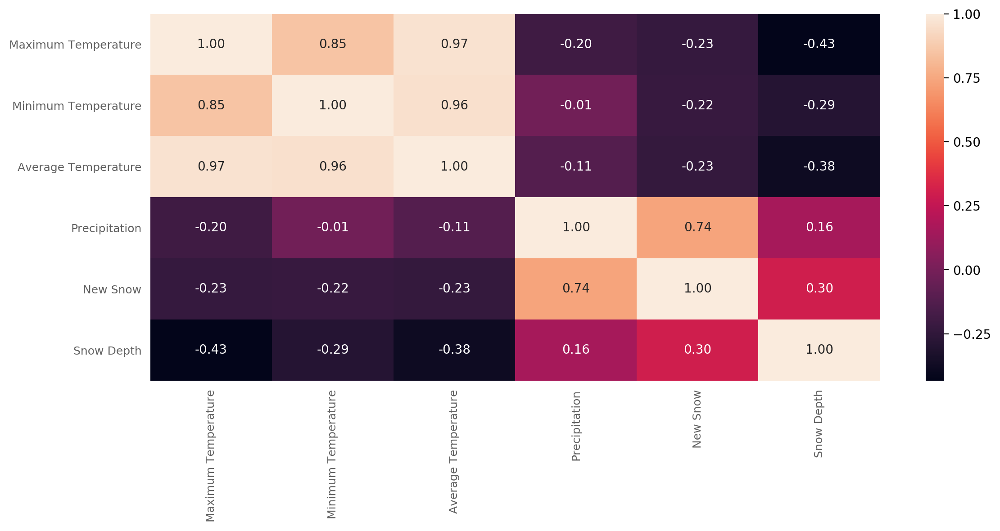

In [385]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.heatmap(weather_data[['Maximum Temperature', 'Minimum Temperature', 'Average Temperature',
                          'Precipitation', 'New Snow', 'Snow Depth']].corr(), 
            annot=True, fmt='.2f')
plot_conf(ax, xlbl='', ylbl='', t='')
plt.tight_layout()
fig.savefig('{}corrwtr.png'.format(rep_files_p), dpi=300)

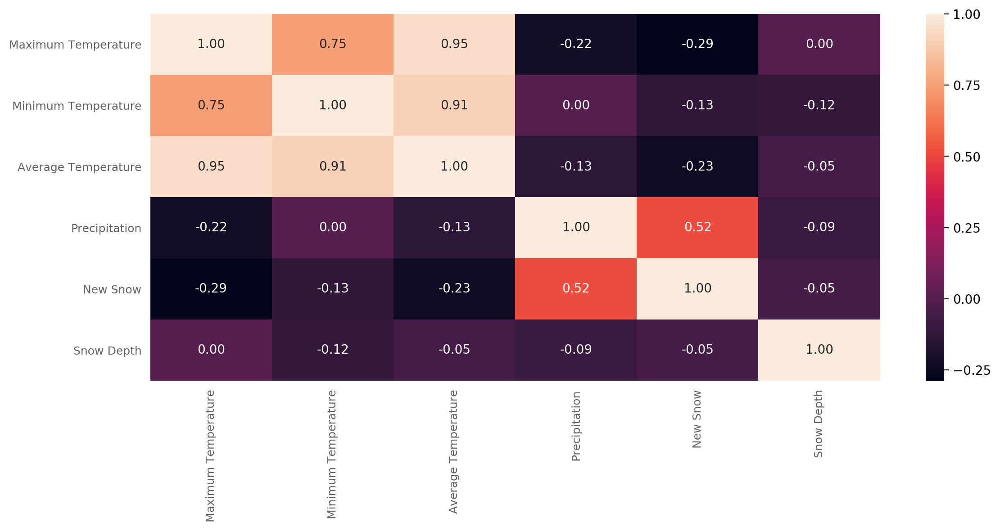

In [386]:
fig, ax = plt.subplots(figsize=fig_size, facecolor=fig_fc)
sns.heatmap(weather_test_data[['Maximum Temperature', 'Minimum Temperature', 'Average Temperature',
                               'Precipitation', 'New Snow', 'Snow Depth']].corr(), 
            annot=True, fmt='.2f')
plot_conf(ax, xlbl='', ylbl='', t='')
plt.tight_layout()
fig.savefig('{}corrwts.png'.format(rep_files_p), dpi=300)

In [388]:
# exporting data for modeling
data.drop(['pickup_borough', 'dropoff_borough', 'speed (km/h)', 'average_day_temperature', 
           'day_precipitation'], axis=1).to_csv('yellow_tripdata_2017-03_processed.csv', index=False)
test_data.drop(['pickup_borough', 'dropoff_borough', 'speed (km/h)', 'average_day_temperature', 
                'day_precipitation'], axis=1).to_csv('yellow_tripdata_2018-03_processed.csv', index=False)

weather_data.to_csv('NY_central_park_weather_2017-03_processed.csv', index=False)
weather_test_data.to_csv('NY_central_park_weather_2018-03_processed.csv', index=False)

In [391]:
import gc
gc.collect()
gc.enable()
gc.collect()

0

In [392]:
del data_, test_data_
gc.collect()

210